## Notes

In [1]:
# import os
# import pandas as pd
# import numpy as np

# os.listdir(path)                              # List files in a folder
# [f for f in os.listdir(path) if f.endswith(".csv_files")]  # List csv_files files only

# pd.read_csv_files(path)                             # Read csv_files file
# pd.read_csv_files(path, encoding="cp1252")          # Read csv_files with specified encoding
# pd.read_csv_files(path, usecols=["A", "B"])         # Read selected columns only

# df.dropna()                                   # Remove rows containing missing values
# df.dropna(subset=["Time", "Primary"])         # Remove rows missing selected values
# df.fillna(0)                                  # Replace missing values with 0
# df.isna()                                     # Check missing values
# df.isna().sum()                               # Count missing values per column

# pd.concat([df1, df2])                         # Combine DataFrames vertically
# pd.concat([df1, df2], ignore_index=True)      # Combine and create a new index
# pd.concat([df1, df2], axis=1)                 # Combine DataFrames horizontally

# pd.DataFrame({...})                           # Create a DataFrame
# df.copy()                                     # Create an independent copy

# df.shape                                      # Get (rows, columns)
# len(df)                                       # Get number of rows
# df.size                                       # Get total number of values
# df.head()                                     # Preview first 5 rows
# df.head(10)                                   # Preview first 10 rows
# df.tail()                                     # Preview last 5 rows
# df.sample(5)                                  # Show 5 random rows
# df.info()                                     # Show structure and data types
# df.describe()                                 # Show numerical summary statistics
# df.dtypes                                     # Show data type of every column

# df.columns                                    # View column names
# df.columns.tolist()                           # Convert column names to a list
# df.columns = df.columns.str.strip()           # Remove spaces around column names
# df.rename(columns={"Old": "New"})             # Rename one column
# df.rename(columns={"I1": "Primary", "I2": "Secondary"})  # Rename multiple columns

# df["Col"]                                     # Select one column as a Series
# df[["Col1", "Col2"]]                          # Select multiple columns
# df.loc[:, ["Col1", "Col2"]]                   # Select columns by name
# df.iloc[:, 0]                                 # Select first column by position
# df.iloc[0]                                    # Select first row
# df.iloc[0:5]                                  # Select first 5 rows

# df[df["Trial"] == 1]                          # Filter rows using one condition
# df[(df["Material"] == "Metal") & (df["Trial"] == 1)]  # Filter using multiple conditions
# df[df["Col"].isin(["A", "B"])]                # Keep selected values
# df.query("Trial == 1")                        # Filter using query syntax

# df.sort_values("Col")                         # Sort by one column
# df.sort_values(["Trial", "Time"])             # Sort by multiple columns
# df.sort_values("Col", ascending=False)        # Sort in descending order

# df.reset_index(drop=True)                     # Reset row index
# df.set_index("Time")                          # Set a column as the index

# df["NewCol"] = values                                 # Add or replace a column
# df["Difference"] = df["Primary"] - df["Secondary"]    # Create calculated column
# df.insert(1, "NewCol", values)                        # Insert column at a position
# df.drop(columns=["Col"])                              # Remove a column
# df.drop(index=[0, 1])                                 # Remove selected rows

# df["Col"].unique()                            # Get unique values
# df["Col"].nunique()                           # Count unique values
# df["Col"].value_counts()                      # Count occurrences of each value

# df.groupby("Col")                                                 # Group rows by one column
# df.groupby(["Material", "Trial"])                                 # Group using multiple columns
# df.groupby("Material")["Primary"].mean()                          # Mean Primary for each material
# df.groupby("Trial").agg({"Primary": "mean", "Secondary": "max"})  # Multiple summaries

# df["Col"].to_numpy()                          # Convert Series to NumPy array
# df["Col"].to_numpy(dtype=float)               # Convert to float NumPy array
# df["Col"].tolist()                            # Convert Series to Python list

# df["Col"].astype(float)                       # Convert column to float
# df["Col"].astype(str)                         # Convert column to string
# pd.to_numeric(df["Col"], errors="coerce")     # Convert to numeric; invalid values become NaN

# df["Col"].min()                               # Minimum value
# df["Col"].max()                               # Maximum value
# df["Col"].mean()                              # Mean
# df["Col"].median()                            # Median
# df["Col"].std()                               # Standard deviation
# df["Col"].sum()                               # Sum
# df["Col"].idxmax()                            # Index of maximum value
# df["Col"].idxmin()                            # Index of minimum value

# df.duplicated()                               # Check duplicate rows
# df.drop_duplicates()                          # Remove duplicate rows

# df.replace([np.inf, -np.inf], np.nan)         # Replace infinities with NaN
# df.loc[mask]                                  # Select rows using a Boolean mask

# df.to_csv_files("output.csv_files", index=False)          # Save DataFrame to csv_files
# df.to_excel("output.xlsx", index=False)       # Save DataFrame to Excel

# pd.set_option("display.max_columns", None)     # Display all columns
# pd.set_option("display.max_rows", None)        # Display all rows
# pd.reset_option("display.max_columns")         # Reset column display setting
# pd.reset_option("display.max_rows")            # Reset row display setting

# Sensor Data Exploration
This notebook provides a concise workflow for exploring multiple sensor datasets with pandas. It covers:

- Loading sensor files (CSV/JSON) and combining them into a single DataFrame.
- Parsing and aligning timestamps, setting a datetime index.
- Cleaning steps: handling missing values, duplicates, outliers, and unit/column harmonization.
- Quick descriptive statistics, group summaries by sensor/type, and checks for data quality.
- Time-series operations: resampling, rolling aggregates, and interpolation to common frequencies.
- Visualizations: time series plots, distributions, correlation matrices, and simple anomaly detection.
- Exporting cleaned datasets and prepared features for downstream modeling or reporting.

Expected inputs: one or more files containing timestamp, sensor_id (or similar), and measurement columns.  
Outputs: a cleaned, merged DataFrame, summary tables, and plots to guide further analysis.

In [2]:
import math
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from matplotlib.lines import Line2D
from matplotlib.ticker import FuncFormatter, LogLocator, ScalarFormatter

from scipy.signal import correlate, correlation_lags, savgol_filter

#from sklearn.feature_selection import VarianceThreshold
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    #accuracy_score,
    classification_report,
    ConfusionMatrixDisplay,
)
from sklearn.model_selection import (
    #cross_val_predict,
    #cross_validate,
    #StratifiedGroupKFold,
    StratifiedKFold,
    #train_test_split,
)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from tsfresh import extract_features

In [3]:
DATE = 'Combined-2'
DATA_PATH = f"../data/02_preprocessed/{DATE}/"

In [4]:
DATA = pd.DataFrame()
file_list = os.listdir(DATA_PATH)

for f in file_list:
    if ".csv" in f:
        trial_file = pd.read_csv(f"{DATA_PATH}{f}").dropna()
        DATA = pd.concat([DATA , trial_file] , ignore_index = True)

MATERIALS = list(DATA['Sample'].unique())

MATERIAL_GROUPS = {
'bismuth': 'metal',
'nickel': 'metal',
'titanium': 'metal',
'iron': 'metal',
'aluminum': 'metal',
'copper': 'metal',

'cement': 'ceramic',
'gypsum': 'ceramic',
'carbon': 'ceramic', 'graphite': 'ceramic',

'cork_coarse': 'composite',
'cork_fine': 'composite',
'wood': 'composite',
'abrasive': 'composite',

'pdms': 'polymer',

'ps_foam': 'foam',
'pu_foam': 'foam'}

DATA['Label']=DATA['Sample'].apply(lambda x : MATERIAL_GROUPS[x])

# Determination of elbow `time`, `value` , and `index`

**Function name:**
- find_first_elbow()

**Returned values:**
- time[elbow_position]
- signal[elbow_position]
- indices[elbow_position]
- time
- smooth_signal

In [5]:
def find_first_elbow(
    subset,
    time_col="Time",
    signal_col="Primary",
    index_col="index",
    smooth_window=15,
    polyorder=2,
    threshold_frac=0.30,
    direction="drop",
    skip_index=5,
):
    df = subset.sort_values(time_col, kind="stable").reset_index(drop=True)

    indices = (
        df[index_col].to_numpy()
        if index_col in df.columns
        else np.arange(len(df))
    )

    df = df.iloc[skip_index:]
    indices = indices[skip_index:]

    time = df[time_col].to_numpy(dtype=float)
    signal = df[signal_col].to_numpy(dtype=float)

    valid = np.isfinite(time) & np.isfinite(signal)
    time = time[valid]
    signal = signal[valid]
    indices = indices[valid]

    n = len(signal)

    if n < 3:
        return np.nan, np.nan, None, time, signal

    window = min(smooth_window, n)

    if window % 2 == 0:
        window -= 1

    if window <= polyorder:
        window = polyorder + 1

        if window % 2 == 0:
            window += 1

    if window > n:
        return np.nan, np.nan, None, time, signal

    smooth_signal = savgol_filter(
        signal,
        window_length=window,
        polyorder=polyorder,
    )

    derivative = np.gradient(smooth_signal, time)

    if direction == "drop":
        strongest_idx = np.argmin(derivative)
        active = derivative < threshold_frac * derivative[strongest_idx]

    elif direction == "rise":
        strongest_idx = np.argmax(derivative)
        active = derivative > threshold_frac * derivative[strongest_idx]

    else:
        raise ValueError("direction must be 'drop' or 'rise'")

    elbow_position = 0

    for position in range(strongest_idx, -1, -1):
        if not active[position]:
            elbow_position = position + 1
            break

    return (
        time[elbow_position],
        signal[elbow_position],
        indices[elbow_position],
        time,
        smooth_signal,
    )

## Storage of elbow `time`, `value` , and `index` into df.DATA

In [6]:
ELBOW_IDX_DICT = {}
DATA["Elbow time"] = np.nan
DATA["Elbow value"] = np.nan
DATA["Elbow index"] = np.nan

for material in MATERIALS:
    current_material = DATA[DATA['Sample'] == material]
    current_material = current_material.sort_values(["Trial", "Time"])

    trial_numbers = sorted(current_material["Trial"].unique())

    ELBOW_IDX_DICT[material] = {}

    for trial in trial_numbers:
        trial = int(trial)
        subset = current_material[current_material["Trial"] == trial]

        (
            ELBOW_TIME,
            ELBOW_VALUE,
            ELBOW_IDX,
            SMOOTH_TIME,
            SMOOTH_PRIMARY,
        ) = find_first_elbow(subset)

        ELBOW_IDX_DICT[material][trial] = int(ELBOW_IDX)

        row_condition = ((DATA["Sample"] == material) & (DATA["Trial"] == trial))

        DATA.loc[row_condition, "Elbow time"]   = ELBOW_TIME
        DATA.loc[row_condition, "Elbow value"]  = ELBOW_VALUE
        DATA.loc[row_condition, "Elbow index"]  = ELBOW_IDX

In [7]:
DATA

,index,Sample,Trial,k,Mass,Volume,rho,cp,Time,Primary,Secondary,Label,Elbow time,Elbow value,Elbow index
0,0,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.00930,0.000661,0.000700,foam,11.40066,0.00066,114.0
1,1,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.10067,0.000661,0.000700,foam,11.40066,0.00066,114.0
2,2,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.20070,0.000661,0.000700,foam,11.40066,0.00066,114.0
3,3,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.30066,0.000661,0.000700,foam,11.40066,0.00066,114.0
4,4,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.40070,0.000661,0.000700,foam,11.40066,0.00066,114.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19258,213,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.30071,0.000651,0.000691,metal,10.00070,0.00066,100.0
19259,214,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.40070,0.000651,0.000691,metal,10.00070,0.00066,100.0
19260,215,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.50066,0.000651,0.000691,metal,10.00070,0.00066,100.0
19261,216,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.60070,0.000651,0.000691,metal,10.00070,0.00066,100.0


## Visual inspection of elbow

ps_foam - Trial 1 - elbow index: 78.0, elbow time: 7.801
ps_foam - Trial 2 - elbow index: 86.0, elbow time: 8.601
ps_foam - Trial 3 - elbow index: 60.0, elbow time: 6.001
ps_foam - Trial 4 - elbow index: 103.0, elbow time: 10.301
ps_foam - Trial 5 - elbow index: 96.0, elbow time: 9.601
ps_foam - Trial 6 - elbow index: 114.0, elbow time: 11.401


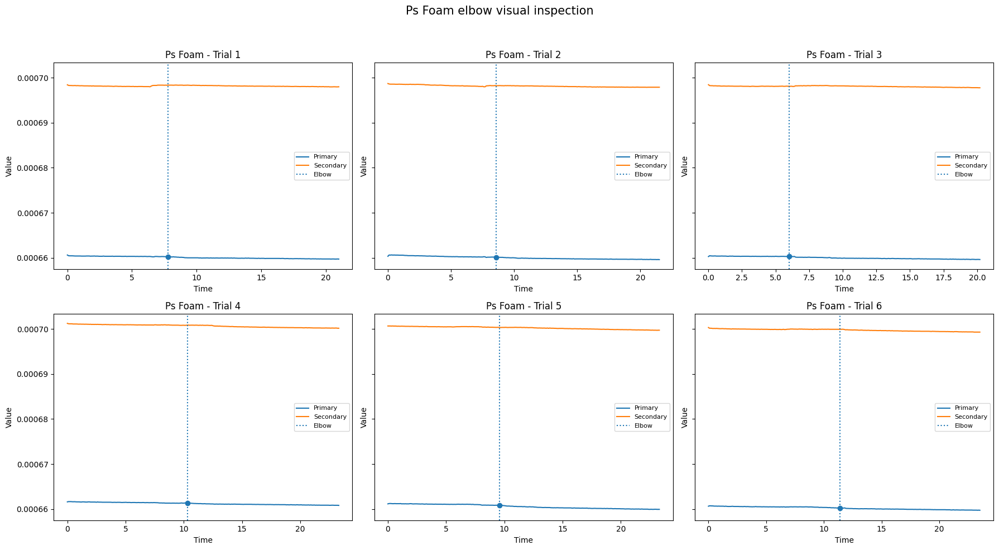

carbon - Trial 1 - elbow index: 151.0, elbow time: 15.101
carbon - Trial 2 - elbow index: 129.0, elbow time: 12.901
carbon - Trial 3 - elbow index: 116.0, elbow time: 11.601
carbon - Trial 4 - elbow index: 143.0, elbow time: 14.301
carbon - Trial 5 - elbow index: 108.0, elbow time: 10.801
carbon - Trial 6 - elbow index: 112.0, elbow time: 11.201


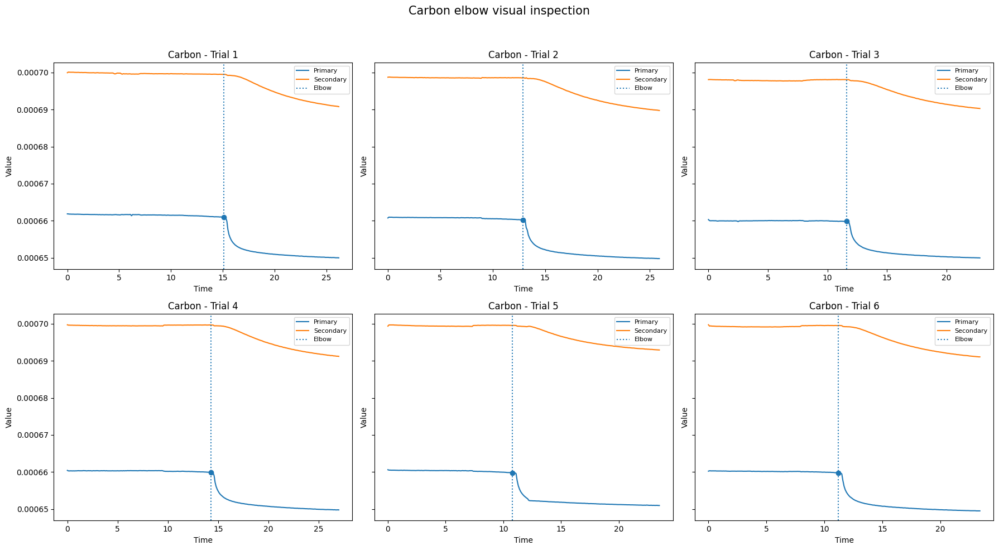

aluminum - Trial 1 - elbow index: 86.0, elbow time: 8.601
aluminum - Trial 2 - elbow index: 92.0, elbow time: 9.201
aluminum - Trial 3 - elbow index: 105.0, elbow time: 10.501
aluminum - Trial 4 - elbow index: 105.0, elbow time: 10.501
aluminum - Trial 5 - elbow index: 104.0, elbow time: 10.401
aluminum - Trial 6 - elbow index: 143.0, elbow time: 14.301


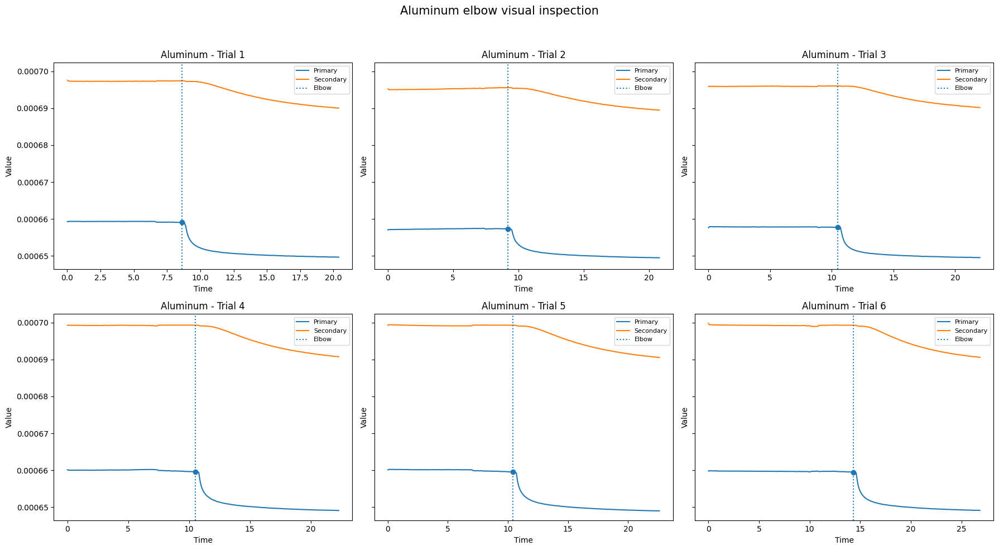

wood - Trial 1 - elbow index: 147.0, elbow time: 14.701
wood - Trial 2 - elbow index: 101.0, elbow time: 10.101
wood - Trial 3 - elbow index: 96.0, elbow time: 9.601
wood - Trial 4 - elbow index: 104.0, elbow time: 10.401
wood - Trial 5 - elbow index: 115.0, elbow time: 11.501
wood - Trial 6 - elbow index: 104.0, elbow time: 10.401


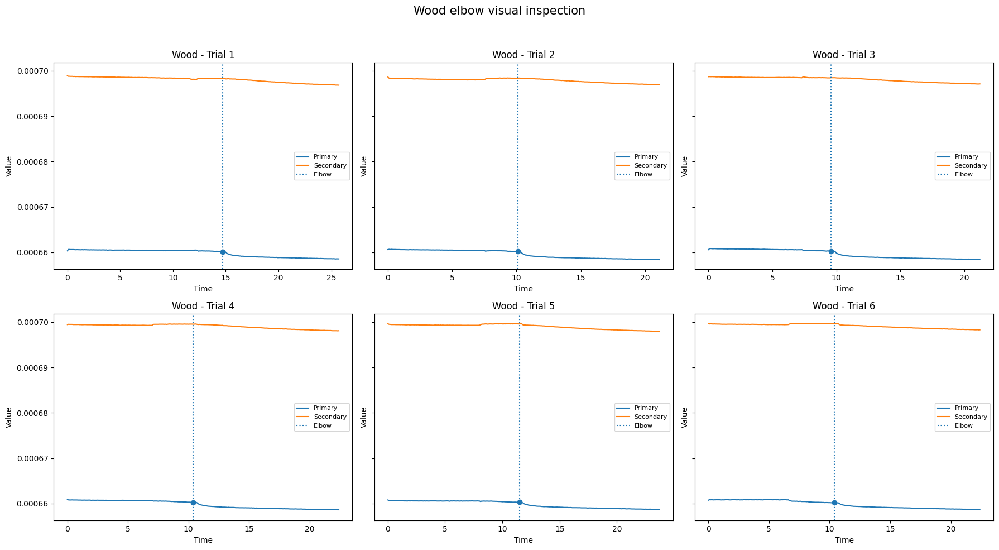

cork_fine - Trial 1 - elbow index: 98.0, elbow time: 9.801
cork_fine - Trial 2 - elbow index: 122.0, elbow time: 12.201
cork_fine - Trial 3 - elbow index: 95.0, elbow time: 9.501
cork_fine - Trial 4 - elbow index: 114.0, elbow time: 11.401
cork_fine - Trial 5 - elbow index: 110.0, elbow time: 11.001
cork_fine - Trial 6 - elbow index: 73.0, elbow time: 7.301


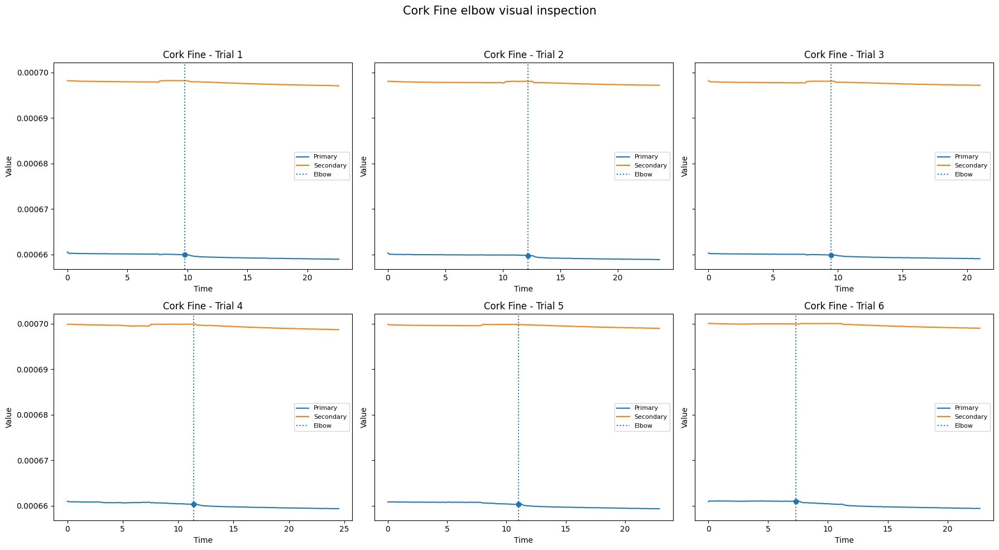

nickel - Trial 1 - elbow index: 161.0, elbow time: 16.101
nickel - Trial 2 - elbow index: 99.0, elbow time: 9.901
nickel - Trial 3 - elbow index: 101.0, elbow time: 10.101
nickel - Trial 4 - elbow index: 112.0, elbow time: 11.201
nickel - Trial 5 - elbow index: 105.0, elbow time: 10.501
nickel - Trial 6 - elbow index: 98.0, elbow time: 9.801


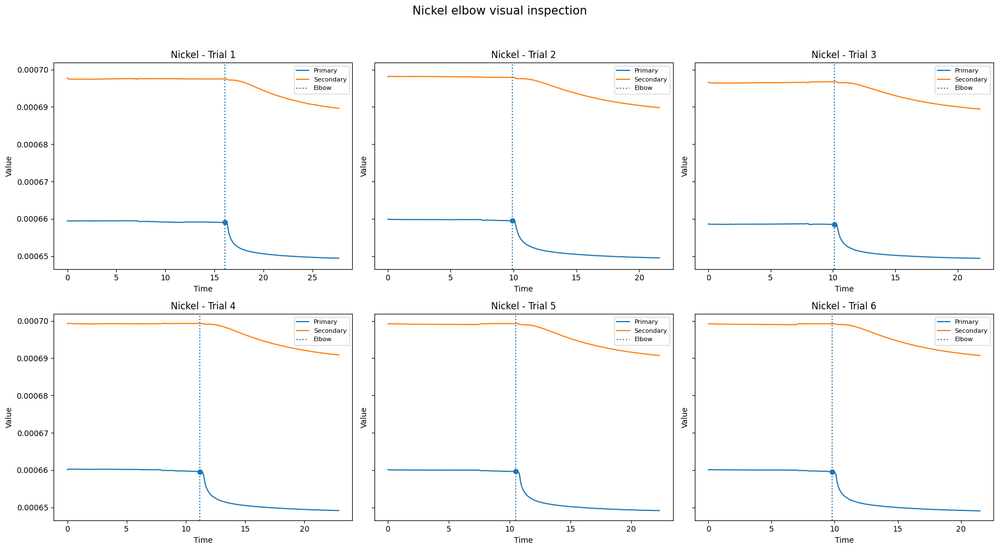

titanium - Trial 1 - elbow index: 84.0, elbow time: 8.401
titanium - Trial 2 - elbow index: 87.0, elbow time: 8.701
titanium - Trial 3 - elbow index: 95.0, elbow time: 9.501
titanium - Trial 4 - elbow index: 118.0, elbow time: 11.801
titanium - Trial 5 - elbow index: 108.0, elbow time: 10.801
titanium - Trial 6 - elbow index: 106.0, elbow time: 10.601


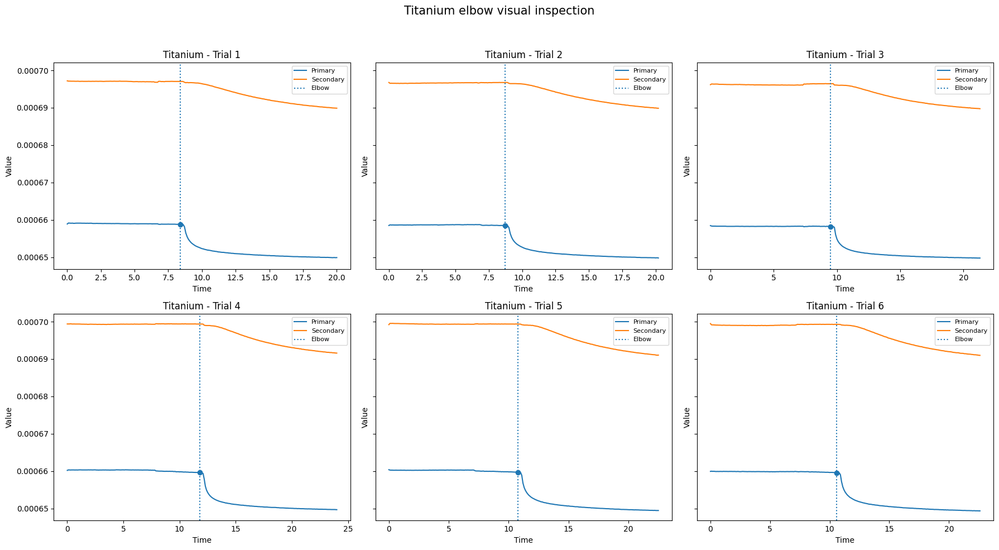

gypsum - Trial 1 - elbow index: 113.0, elbow time: 11.301
gypsum - Trial 2 - elbow index: 107.0, elbow time: 10.701
gypsum - Trial 3 - elbow index: 101.0, elbow time: 10.101
gypsum - Trial 4 - elbow index: 104.0, elbow time: 10.401
gypsum - Trial 5 - elbow index: 107.0, elbow time: 10.701
gypsum - Trial 6 - elbow index: 109.0, elbow time: 10.901


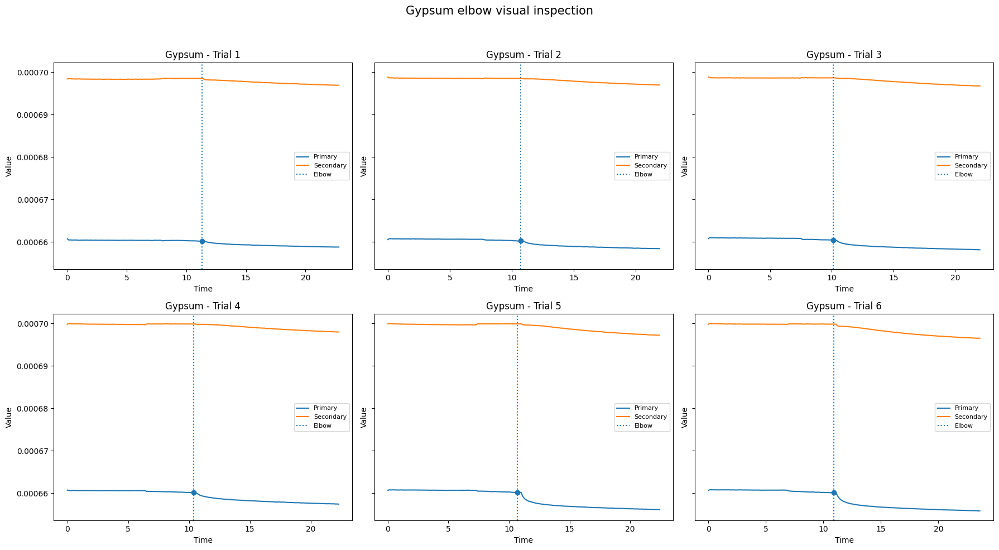

bismuth - Trial 1 - elbow index: 100.0, elbow time: 10.001
bismuth - Trial 2 - elbow index: 97.0, elbow time: 9.701
bismuth - Trial 3 - elbow index: 93.0, elbow time: 9.301
bismuth - Trial 4 - elbow index: 113.0, elbow time: 11.301
bismuth - Trial 5 - elbow index: 117.0, elbow time: 11.701
bismuth - Trial 6 - elbow index: 108.0, elbow time: 10.801


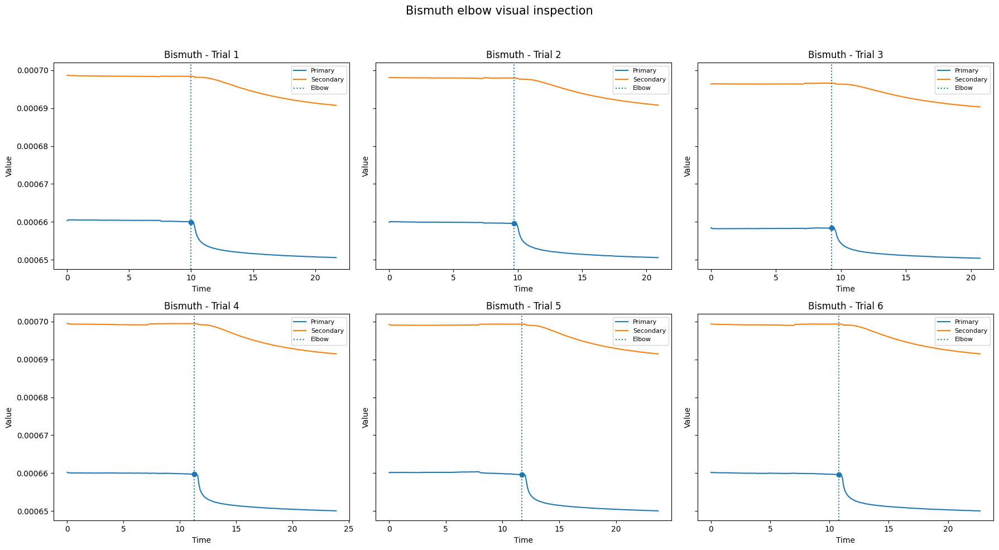

pdms - Trial 1 - elbow index: 106.0, elbow time: 10.601
pdms - Trial 2 - elbow index: 93.0, elbow time: 9.301
pdms - Trial 3 - elbow index: 85.0, elbow time: 8.501
pdms - Trial 4 - elbow index: 239.0, elbow time: 23.901
pdms - Trial 5 - elbow index: 111.0, elbow time: 11.101
pdms - Trial 6 - elbow index: 177.0, elbow time: 17.701


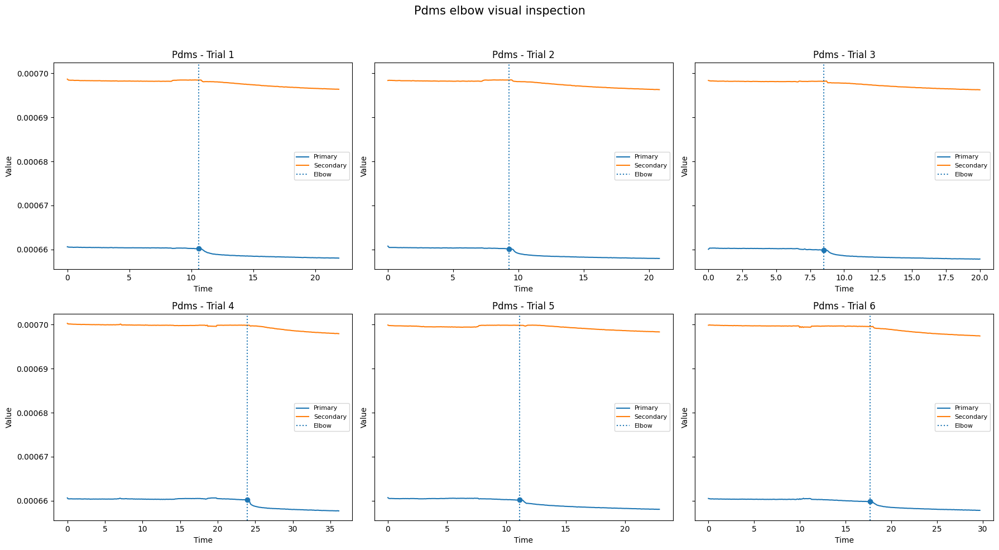

iron - Trial 1 - elbow index: 101.0, elbow time: 10.101
iron - Trial 2 - elbow index: 102.0, elbow time: 10.201
iron - Trial 3 - elbow index: 83.0, elbow time: 8.301
iron - Trial 4 - elbow index: 106.0, elbow time: 10.601
iron - Trial 5 - elbow index: 102.0, elbow time: 10.201
iron - Trial 6 - elbow index: 106.0, elbow time: 10.601


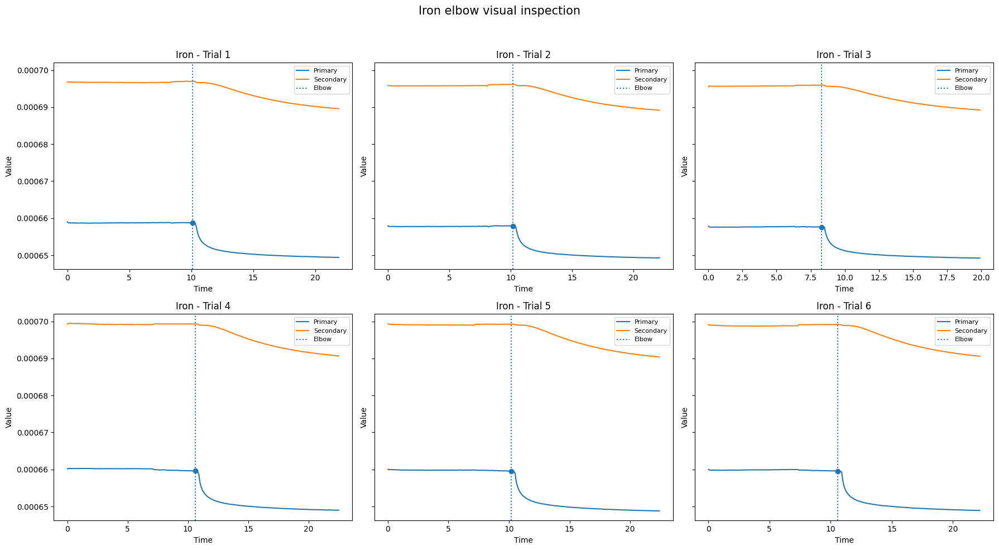

cement - Trial 1 - elbow index: 95.0, elbow time: 9.501
cement - Trial 2 - elbow index: 100.0, elbow time: 10.001
cement - Trial 3 - elbow index: 103.0, elbow time: 10.301
cement - Trial 4 - elbow index: 106.0, elbow time: 10.601
cement - Trial 5 - elbow index: 119.0, elbow time: 11.901
cement - Trial 6 - elbow index: 124.0, elbow time: 12.401


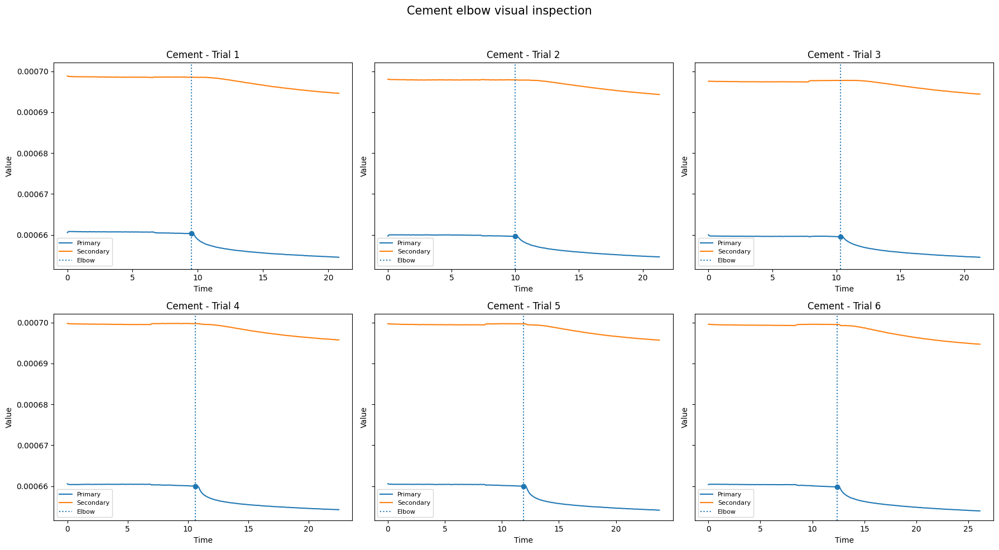

pu_foam - Trial 1 - elbow index: 101.0, elbow time: 10.101
pu_foam - Trial 2 - elbow index: 105.0, elbow time: 10.501
pu_foam - Trial 3 - elbow index: 149.0, elbow time: 14.901
pu_foam - Trial 4 - elbow index: 122.0, elbow time: 12.201
pu_foam - Trial 5 - elbow index: 80.0, elbow time: 8.001
pu_foam - Trial 6 - elbow index: 98.0, elbow time: 9.801


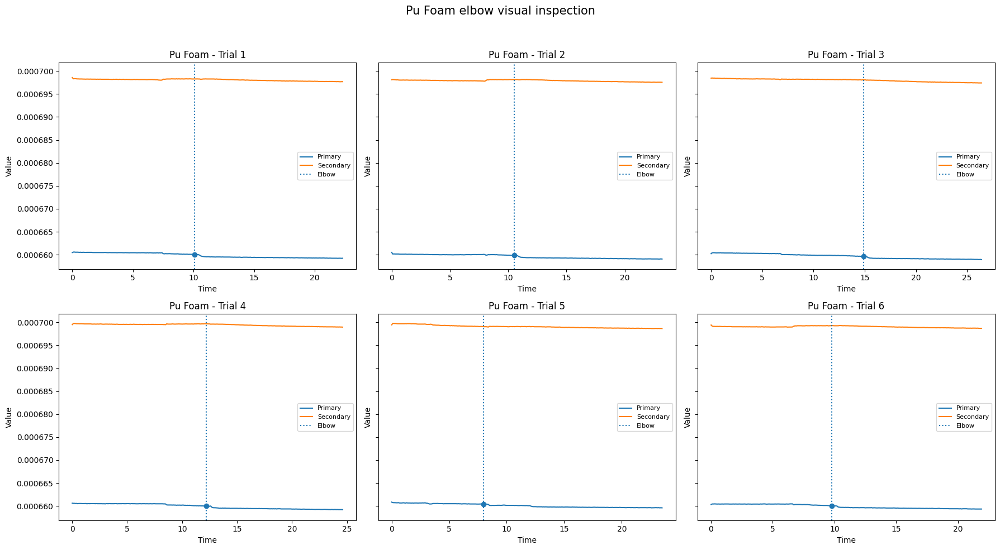

copper - Trial 1 - elbow index: 101.0, elbow time: 10.101
copper - Trial 2 - elbow index: 87.0, elbow time: 8.701
copper - Trial 3 - elbow index: 92.0, elbow time: 9.201
copper - Trial 4 - elbow index: 100.0, elbow time: 10.001
copper - Trial 5 - elbow index: 109.0, elbow time: 10.901
copper - Trial 6 - elbow index: 100.0, elbow time: 10.001


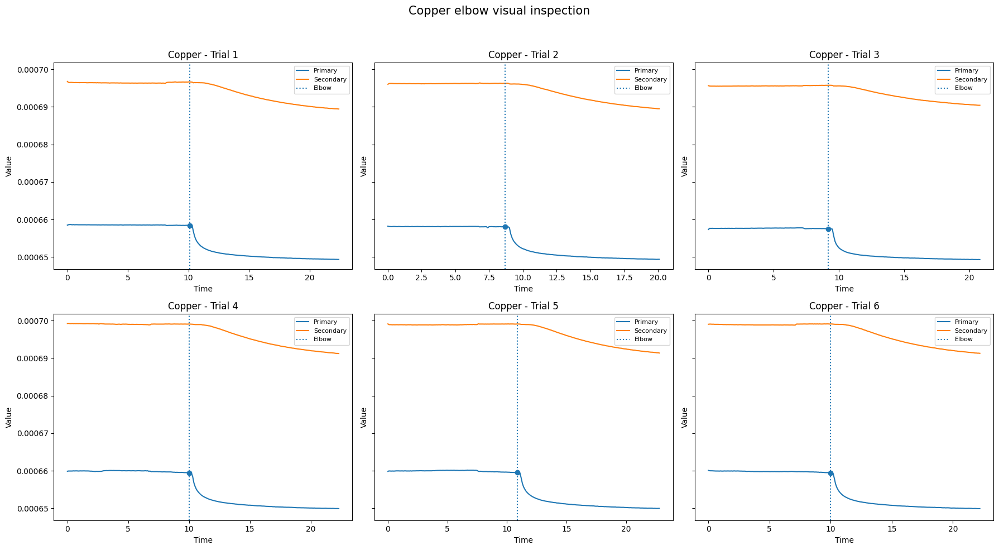

In [8]:
for material in MATERIALS:
    current_material = DATA[DATA["Sample"] == material]
    trial_numbers = sorted(current_material["Trial"].unique())

    n_cols = min(3, len(trial_numbers))
    n_rows = math.ceil(len(trial_numbers) / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(6 * n_cols, 5 * n_rows),
        sharey=True,
        squeeze=False,
    )

    axes = axes.ravel()

    for ax, trial in zip(axes, trial_numbers):
        subset = (
            current_material[current_material["Trial"].astype(int) == trial]
            .sort_values("Time")
            .copy()
        )

        elbow_time = subset["Elbow time"].iloc[0]
        elbow_value = subset["Elbow value"].iloc[0]
        elbow_idx = subset["Elbow index"].iloc[0]

        ax.plot(
            subset["Time"],
            subset["Primary"],
            label="Primary",
        )

        ax.plot(
            subset["Time"],
            subset["Secondary"],
            label="Secondary",
        )

        if np.isfinite(elbow_time):
            ax.axvline(
                elbow_time,
                linestyle=":",
                label="Elbow",
            )

            ax.scatter(
                elbow_time,
                elbow_value,
                zorder=5,
            )

        ax.set(
            title=f"{material.replace('_', ' ').title()} - Trial {trial}",
            xlabel="Time",
            ylabel="Value",
        )

        ax.legend(fontsize=8)

        print(
            f"{material} - Trial {trial} - "
            f"elbow index: {elbow_idx}, elbow time: {elbow_time:.3f}"
        )

    for ax in axes[len(trial_numbers):]:
        ax.axis("off")

    fig.suptitle(
        f"{material.replace('_', ' ').title()} elbow visual inspection",
        fontsize=15,
    )

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

## Elbow Position Normalization

In [9]:
DATA

,index,Sample,Trial,k,Mass,Volume,rho,cp,Time,Primary,Secondary,Label,Elbow time,Elbow value,Elbow index
0,0,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.00930,0.000661,0.000700,foam,11.40066,0.00066,114.0
1,1,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.10067,0.000661,0.000700,foam,11.40066,0.00066,114.0
2,2,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.20070,0.000661,0.000700,foam,11.40066,0.00066,114.0
3,3,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.30066,0.000661,0.000700,foam,11.40066,0.00066,114.0
4,4,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.40070,0.000661,0.000700,foam,11.40066,0.00066,114.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19258,213,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.30071,0.000651,0.000691,metal,10.00070,0.00066,100.0
19259,214,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.40070,0.000651,0.000691,metal,10.00070,0.00066,100.0
19260,215,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.50066,0.000651,0.000691,metal,10.00070,0.00066,100.0
19261,216,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.60070,0.000651,0.000691,metal,10.00070,0.00066,100.0


In [10]:
DATA["Time from elbow"] = DATA["Time"] - DATA["Elbow time"]
DATA["Primary aligned"] = DATA["Primary"] - DATA["Elbow value"]
DATA["Secondary aligned"] = DATA["Secondary"] - DATA["Elbow value"]
DATA = DATA[(DATA['Time from elbow'] >= 0) & (DATA['Time from elbow'] < 5.1)]


#  Plots of sensor data

## Plots of each material at each trial

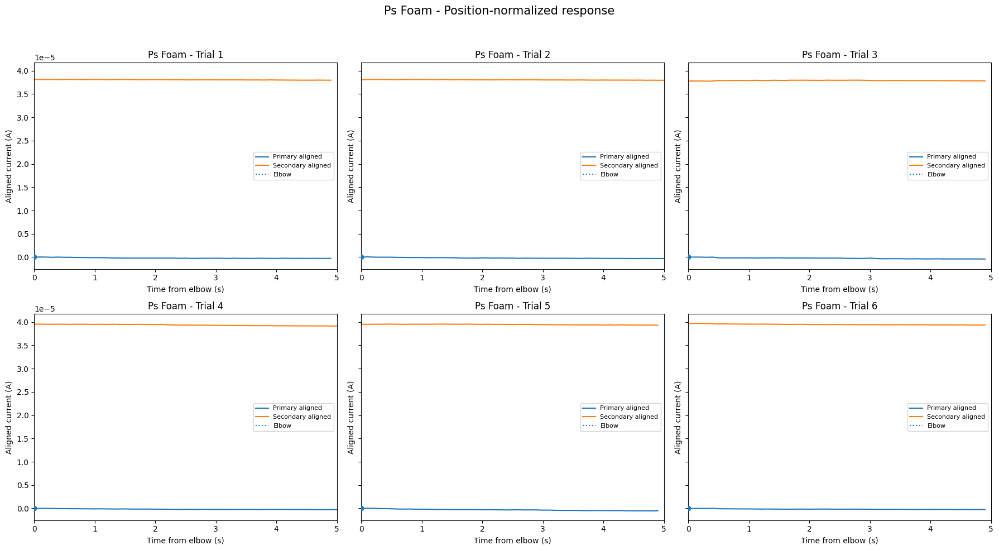

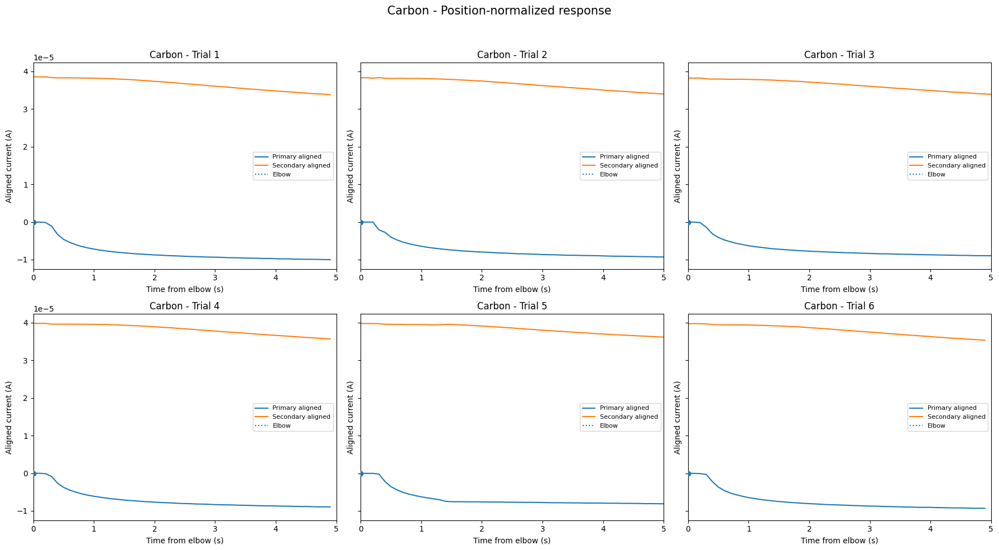

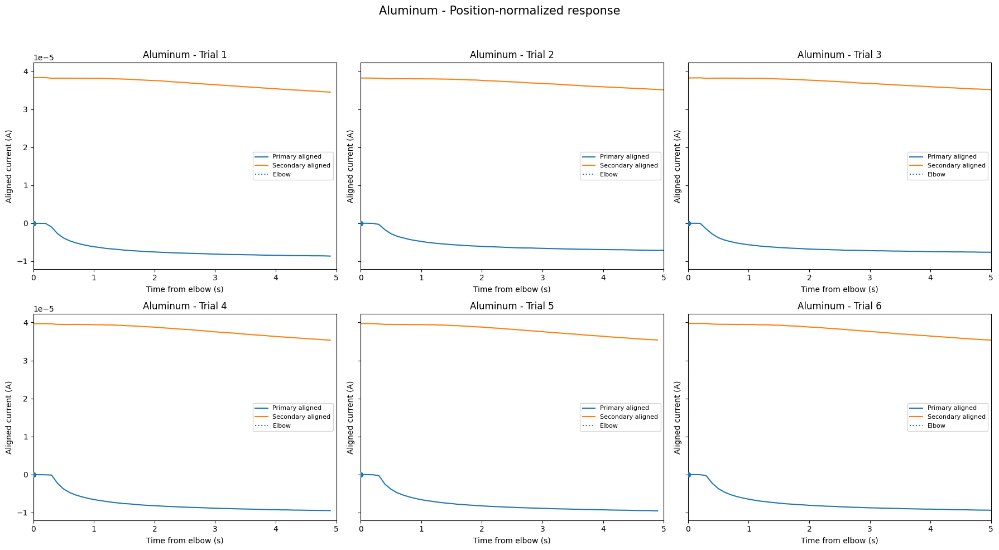

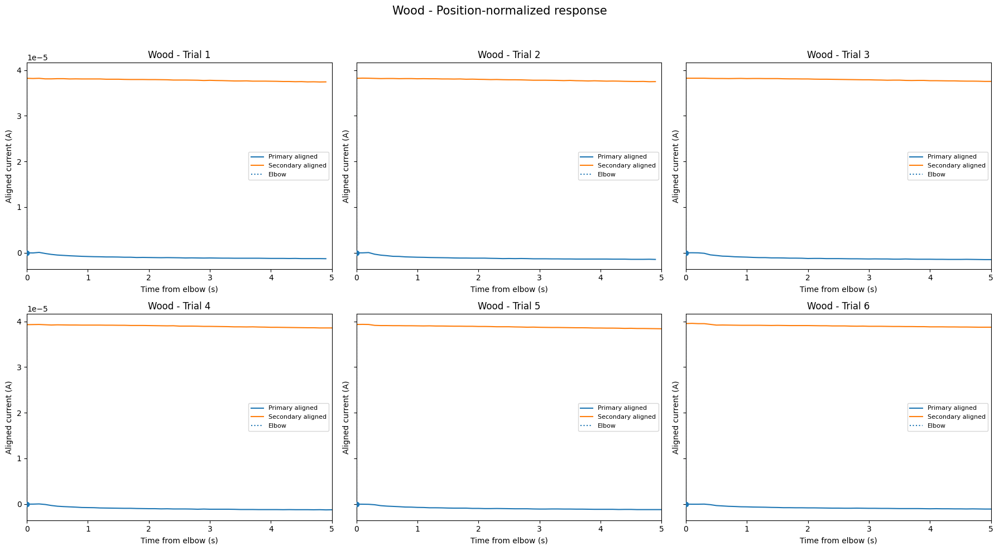

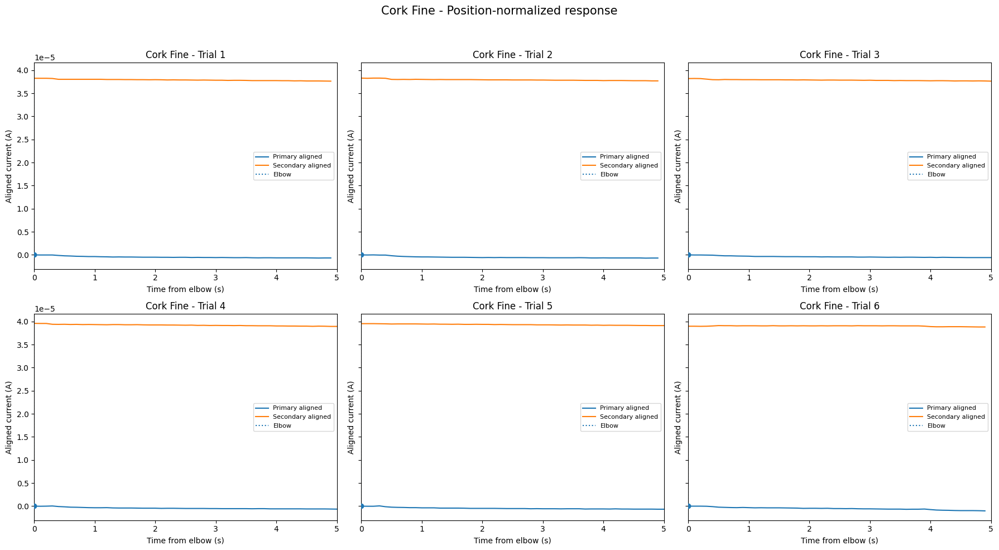

...

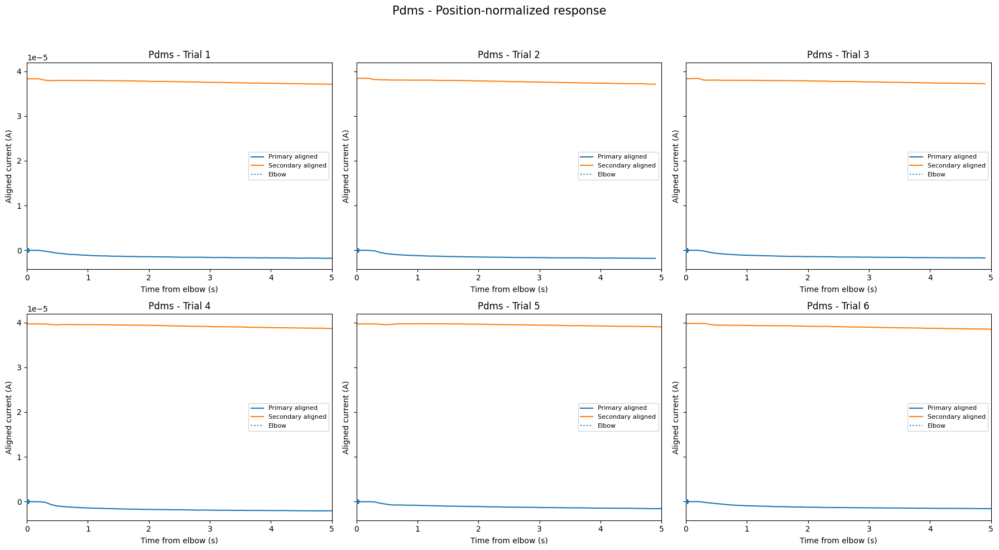

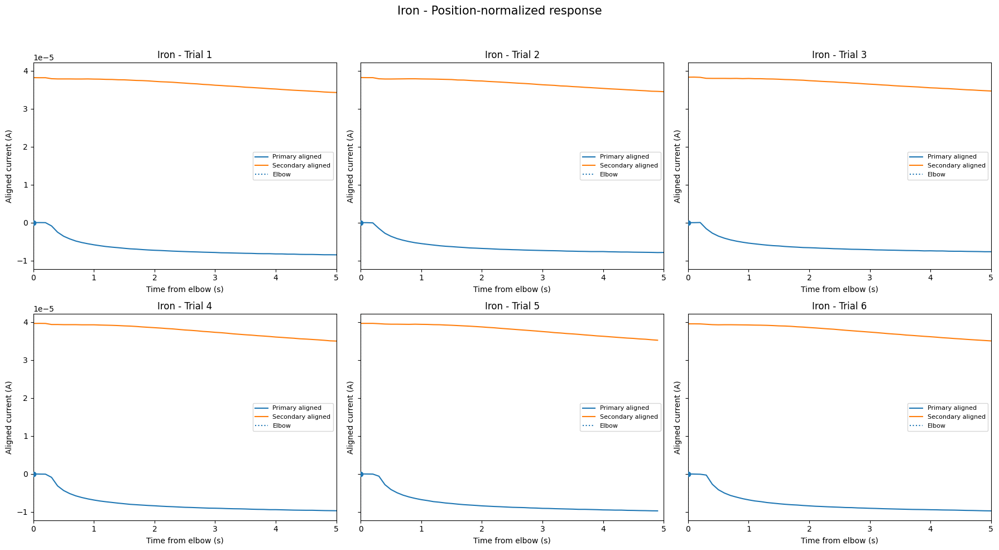

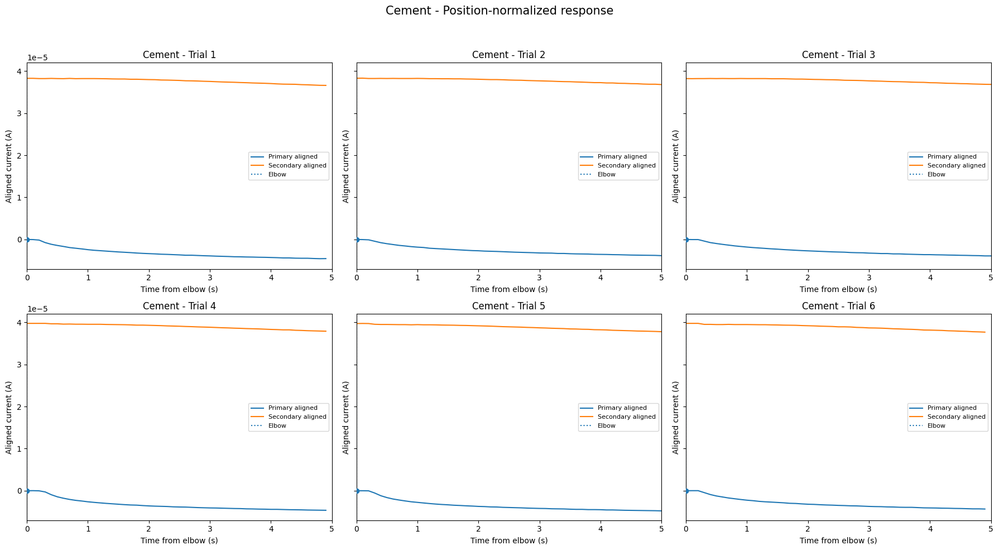

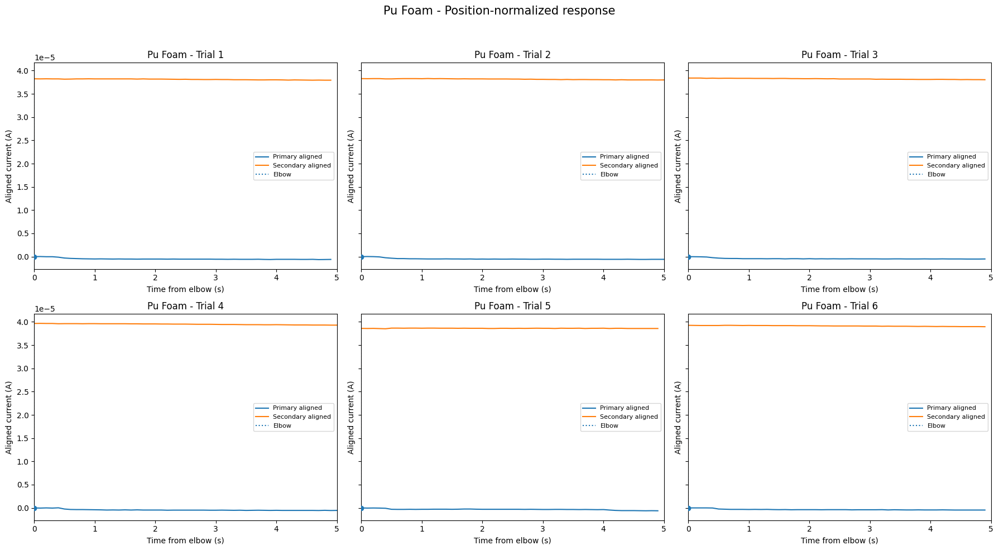

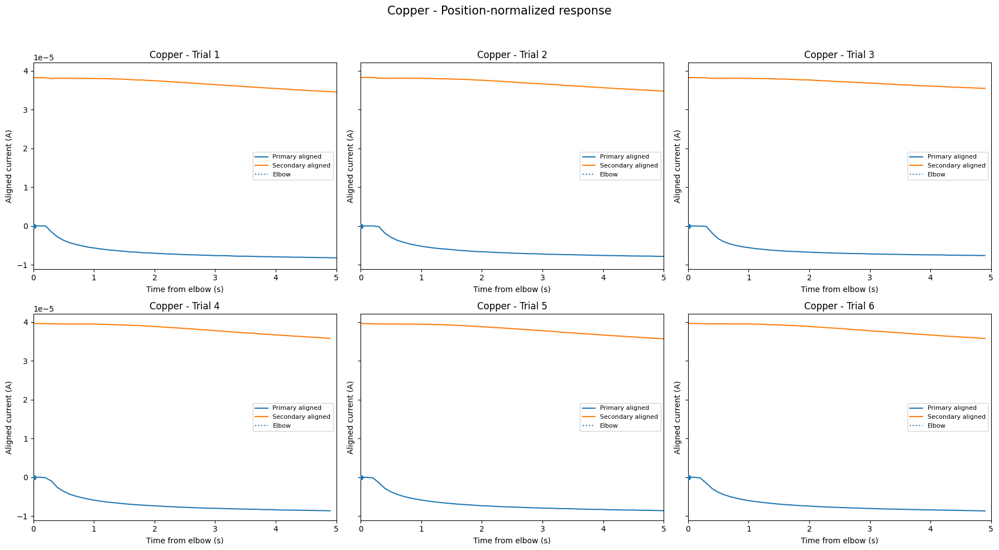

In [11]:
for material in MATERIALS:
    material_data = DATA[
        (DATA["Sample"] == material)
        & (DATA["Time from elbow"] >= 0)
        & (DATA["Time from elbow"] <= 5)
    ].copy()

    trials = sorted(
        material_data["Trial"]
        .dropna()
        .astype(int)
        .unique()
    )

    n_cols = min(3, len(trials))
    n_rows = math.ceil(len(trials) / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(6 * n_cols, 5 * n_rows),
        sharey=True,
        squeeze=False,
    )

    axes = axes.ravel()

    for ax, trial in zip(axes, trials):
        subset = (
            material_data[material_data["Trial"].astype(int) == trial]
            .sort_values("Time from elbow")
            .copy()
        )

        if subset.empty:
            ax.axis("off")
            continue

        ax.plot(
            subset["Time from elbow"],
            subset["Primary aligned"],
            label="Primary aligned",
        )

        ax.plot(
            subset["Time from elbow"],
            subset["Secondary aligned"],
            label="Secondary aligned",
        )

        ax.axvline(
            0,
            linestyle=":",
            label="Elbow",
        )

        ax.scatter(
            0,
            0,
            zorder=5,
        )

        ax.set_xlim(0, 5)

        ax.set(
            title=f"{material.replace('_', ' ').title()} - Trial {trial}",
            xlabel="Time from elbow (s)",
            ylabel="Aligned current (A)",
        )

        ax.legend(fontsize=8)

    for ax in axes[len(trials):]:
        ax.axis("off")

    fig.suptitle(
        f"{material.replace('_', ' ').title()} - Position-normalized response",
        fontsize=15,
    )

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

## Plot of each material across all trials

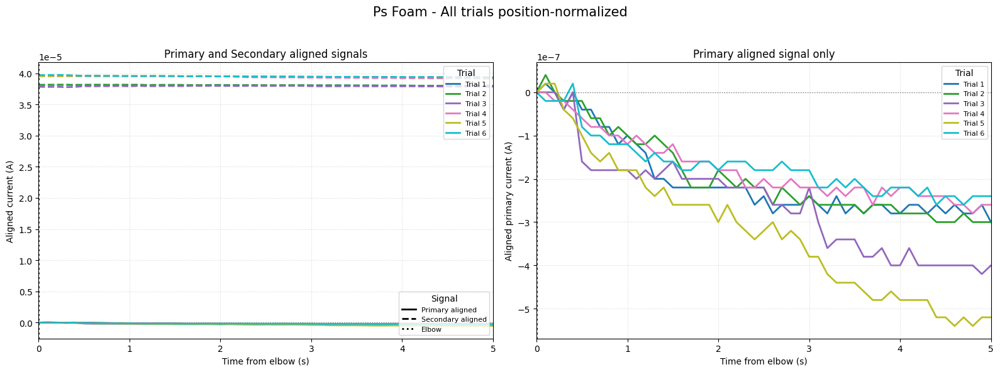

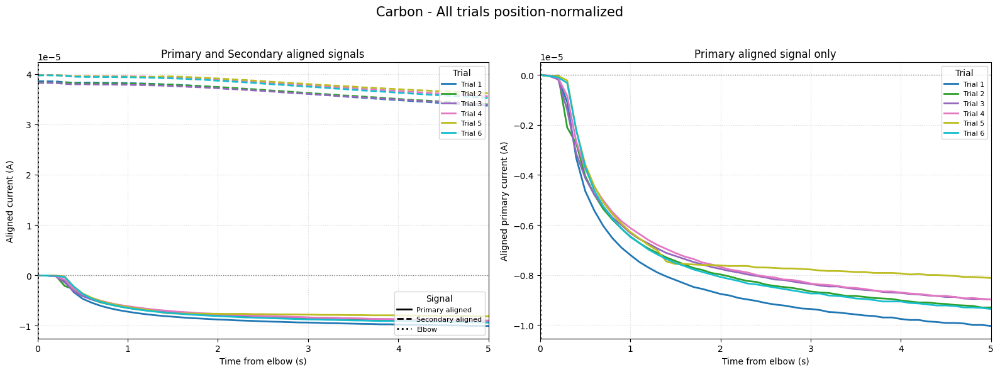

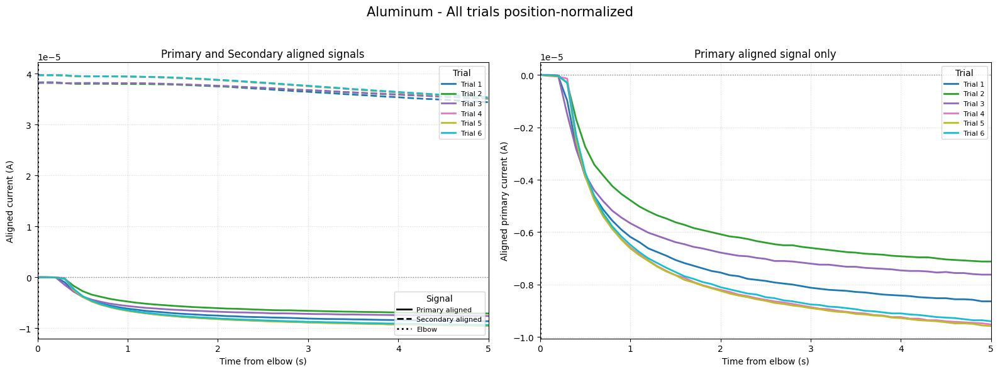

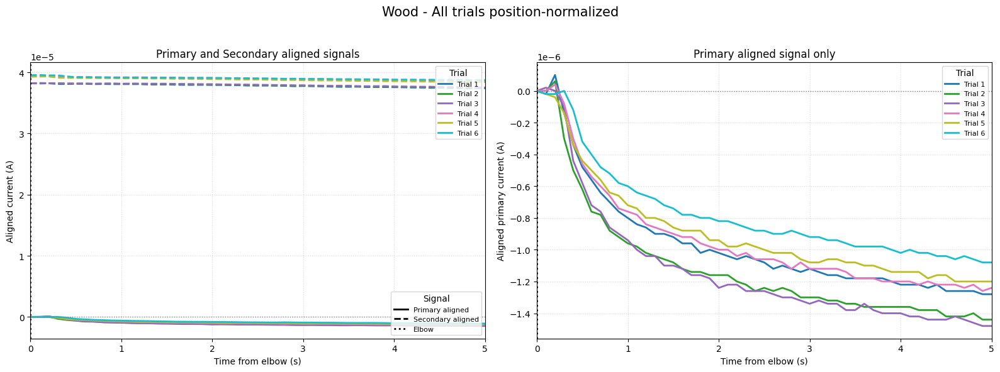

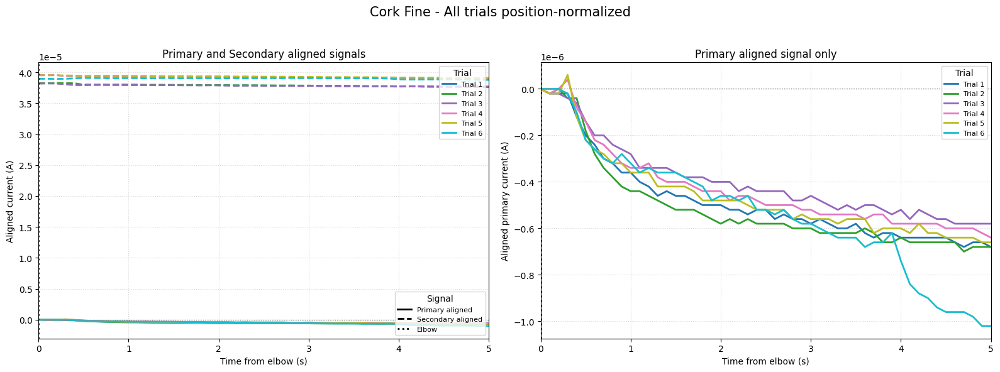

...

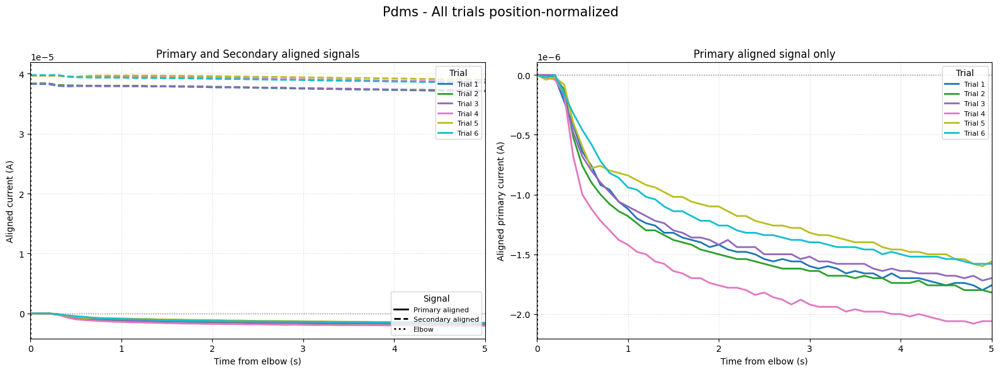

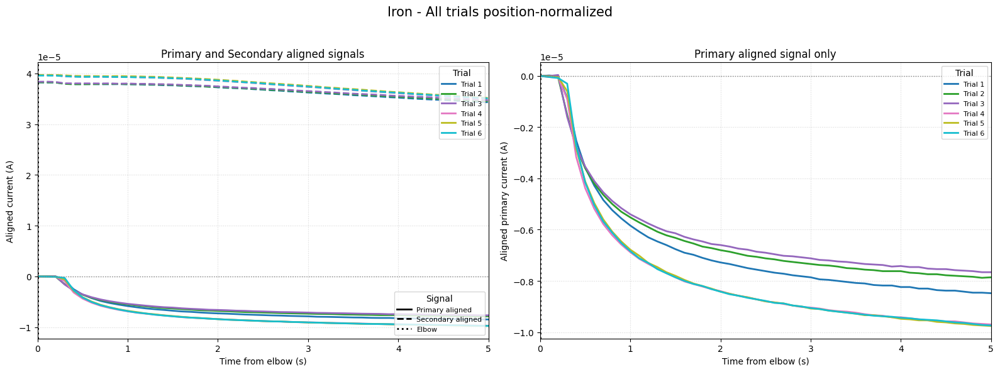

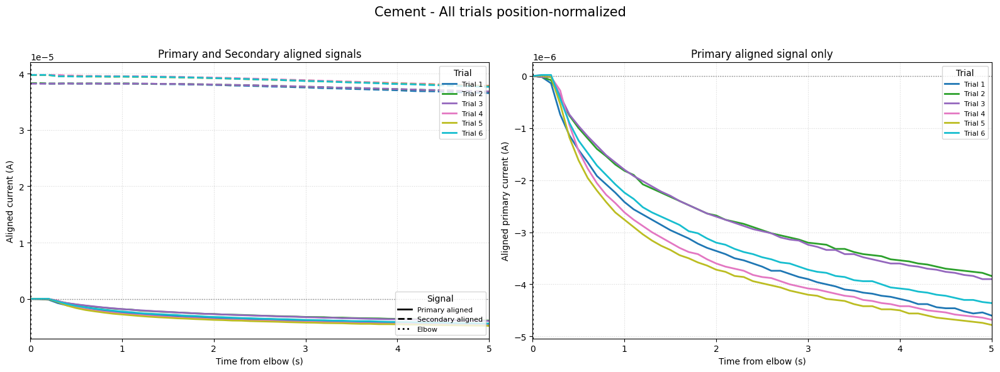

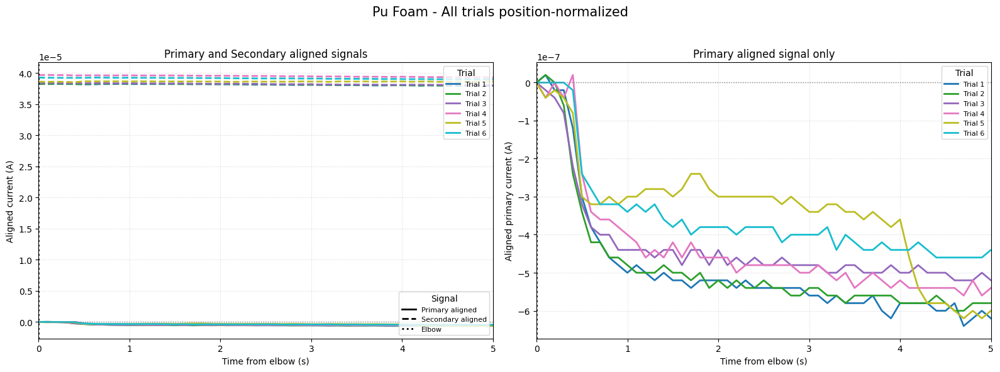

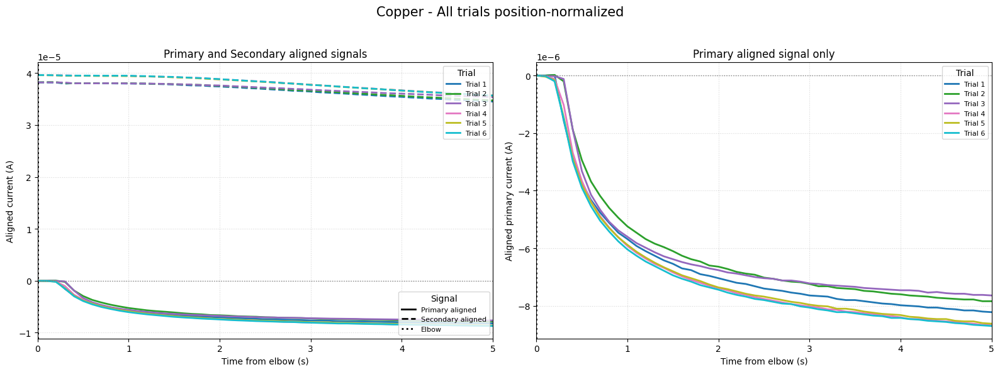

In [12]:
for material in MATERIALS:
    material_data = DATA[
        DATA["Sample"] == material
    ].copy()

    if material_data.empty:
        print(f"No post-elbow data for {material}")
        continue

    trials = sorted(
        material_data["Trial"]
        .dropna()
        .astype(int)
        .unique()
    )

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(16, 6),
        sharey=False,
        squeeze=False,
    )

    ax_both = axes.ravel()[0]
    ax_primary = axes.ravel()[1]

    cmap = plt.get_cmap("tab10", len(trials))

    for trial_idx, trial in enumerate(trials):
        subset = (
            material_data[material_data["Trial"].astype(int) == trial]
            .sort_values("Time from elbow")
            .copy()
        )

        trial_color = cmap(trial_idx)

        # Left plot: aligned Primary + aligned Secondary
        ax_both.plot(
            subset["Time from elbow"],
            subset["Primary aligned"],
            color=trial_color,
            linestyle="-",
            linewidth=2,
        )

        ax_both.plot(
            subset["Time from elbow"],
            subset["Secondary aligned"],
            color=trial_color,
            linestyle="--",
            linewidth=2,
        )

        # Right plot: aligned Primary only
        ax_primary.plot(
            subset["Time from elbow"],
            subset["Primary aligned"],
            color=trial_color,
            linestyle="-",
            linewidth=2,
        )

    for ax in [ax_both, ax_primary]:
        ax.axvline(
            0,
            linestyle=":",
            color="black",
            linewidth=2,
        )

        ax.axhline(
            0,
            linestyle=":",
            color="gray",
            linewidth=1,
        )

        ax.set_xlim(0, 5)

        ax.grid(
            linestyle=":",
            alpha=0.5,
        )

    ax_both.set(
        title="Primary and Secondary aligned signals",
        xlabel="Time from elbow (s)",
        ylabel="Aligned current (A)",
    )

    ax_primary.set(
        title="Primary aligned signal only",
        xlabel="Time from elbow (s)",
        ylabel="Aligned primary current (A)",
    )

    trial_handles = [
        Line2D(
            [0],
            [0],
            color=cmap(i),
            linestyle="-",
            linewidth=2,
            label=f"Trial {trial}",
        )
        for i, trial in enumerate(trials)
    ]

    sensor_handles = [
        Line2D(
            [0],
            [0],
            color="black",
            linestyle="-",
            linewidth=2,
            label="Primary aligned",
        ),
        Line2D(
            [0],
            [0],
            color="black",
            linestyle="--",
            linewidth=2,
            label="Secondary aligned",
        ),
        Line2D(
            [0],
            [0],
            color="black",
            linestyle=":",
            linewidth=2,
            label="Elbow",
        ),
    ]

    legend1 = ax_both.legend(
        handles=trial_handles,
        title="Trial",
        loc="upper right",
        fontsize=8,
    )

    ax_both.add_artist(legend1)

    ax_both.legend(
        handles=sensor_handles,
        title="Signal",
        loc="lower right",
        fontsize=8,
    )

    ax_primary.legend(
        handles=trial_handles,
        title="Trial",
        loc="upper right",
        fontsize=8,
    )

    fig.suptitle(
        f"{material.replace('_', ' ').title()} - All trials position-normalized",
        fontsize=15,
    )

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

## Plot of all materials per trial

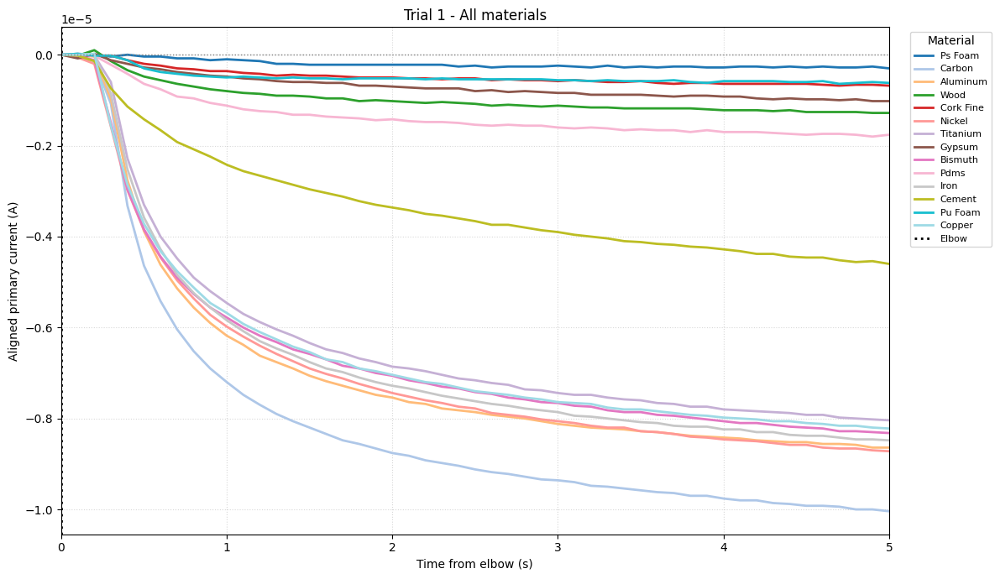

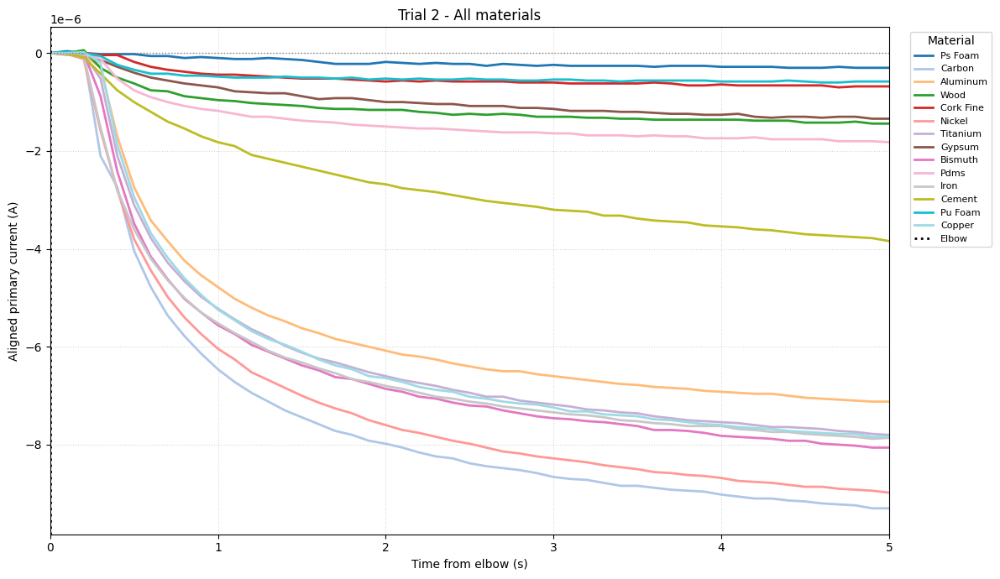

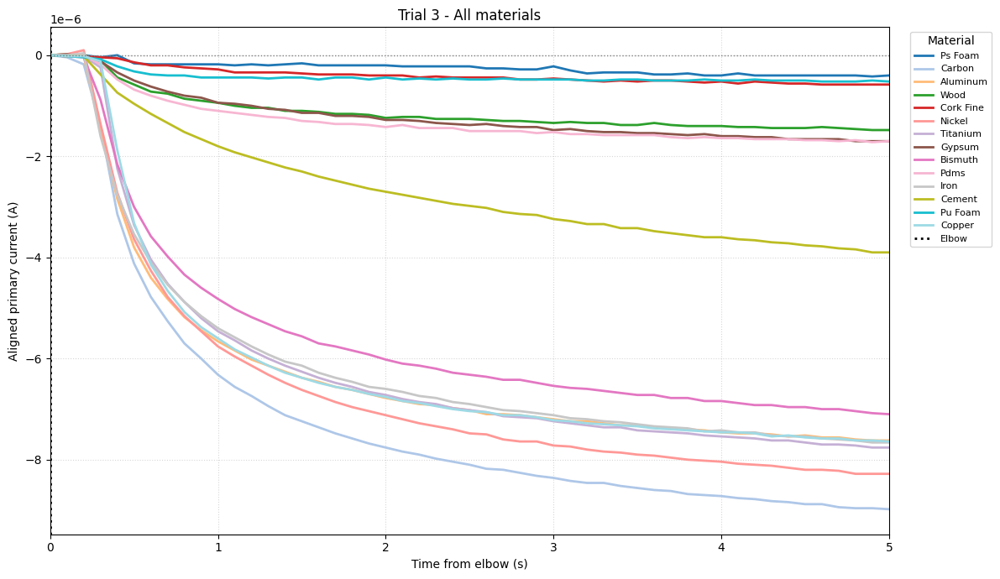

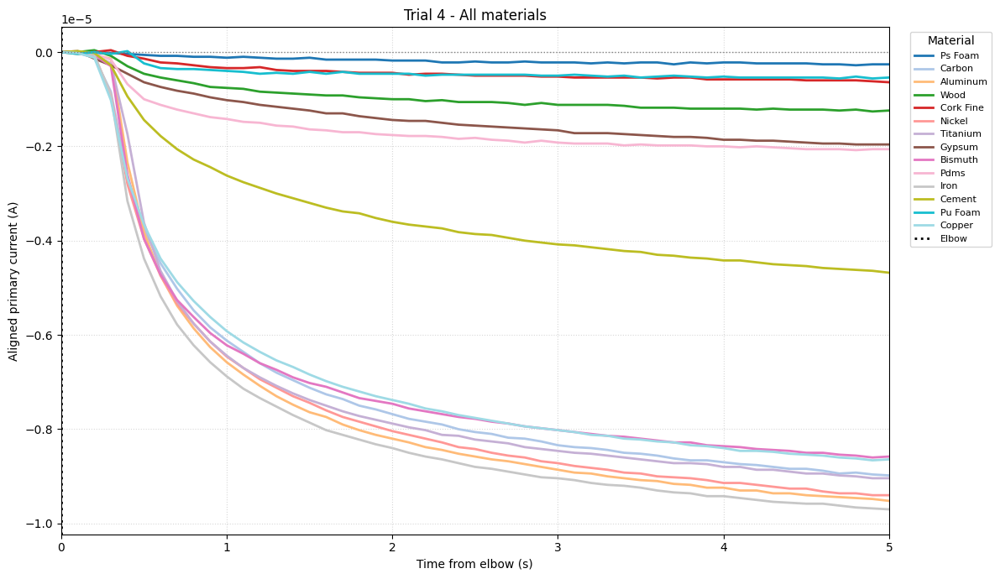

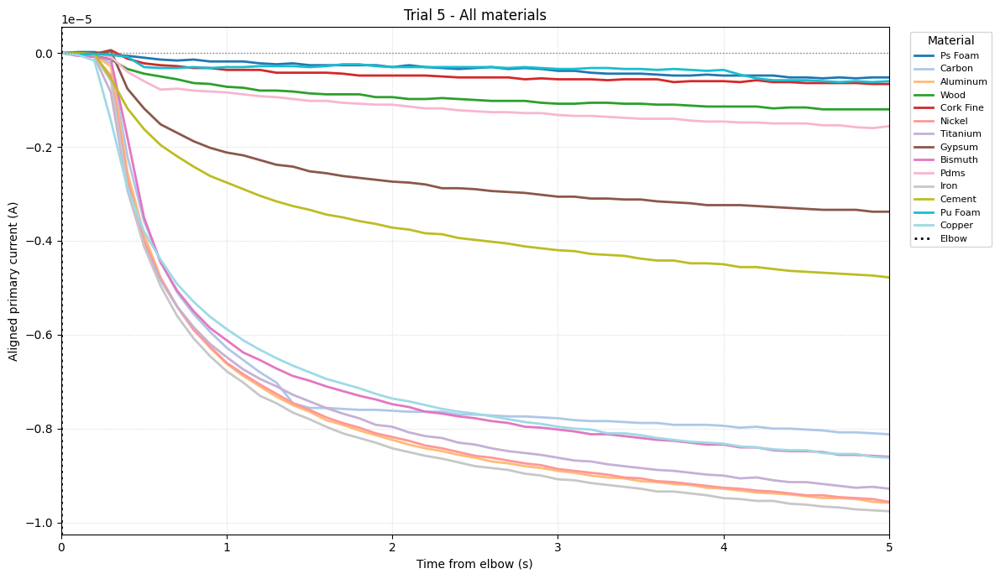

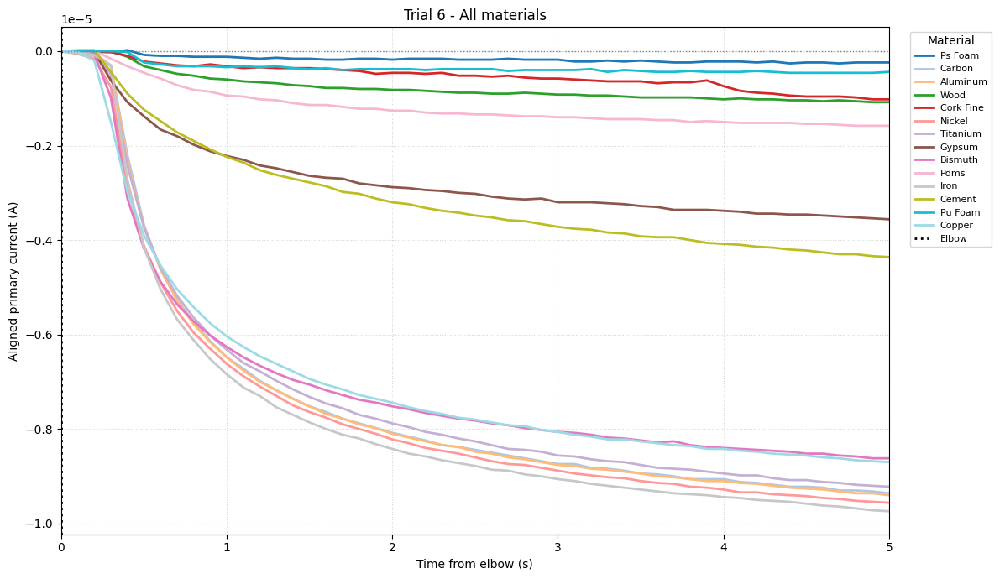

In [13]:
trials = sorted(
    DATA["Trial"]
    .dropna()
    .astype(int)
    .unique()
)

materials = [
    material
    for material in MATERIALS
    if material in DATA["Sample"].unique()
]

cmap = plt.get_cmap("tab20", len(materials))

for trial in trials:
    trial_data = (
        DATA[DATA["Trial"].astype(int) == trial]
        .copy()
        .sort_values(["Sample", "Time from elbow"])
    )

    fig, ax = plt.subplots(figsize=(12, 7))

    for material_idx, material in enumerate(materials):
        subset = (
            trial_data[trial_data["Sample"] == material]
            .sort_values("Time from elbow")
            .copy()
        )

        if subset.empty:
            continue

        material_color = cmap(material_idx)

        ax.plot(
            subset["Time from elbow"],
            subset["Primary aligned"],
            color=material_color,
            linewidth=2,
            label=material.replace("_", " ").title(),
        )

    ax.axvline(
        0,
        linestyle=":",
        color="black",
        linewidth=2,
        label="Elbow",
    )

    ax.axhline(
        0,
        linestyle=":",
        color="gray",
        linewidth=1,
    )

    ax.set_xlim(0, 5)

    ax.set(
        title=f"Trial {trial} - All materials",
        xlabel="Time from elbow (s)",
        ylabel="Aligned primary current (A)",
    )

    ax.grid(linestyle=":", alpha=0.5)

    ax.legend(
        title="Material",
        fontsize=8,
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
    )

    plt.tight_layout()
    plt.show()

In [14]:
DATA[['Sample', 'Trial']].value_counts()

Sample     Trial
carbon     2        52
aluminum   4        52
carbon     3        52
cork_fine  3        52
aluminum   6        52
                    ..
iron       6        51
pu_foam    1        51
copper     5        51
           4        51
bismuth    1        51
Name: count, Length: 84, dtype: int64

## Plot Primary-Secondary Differnce

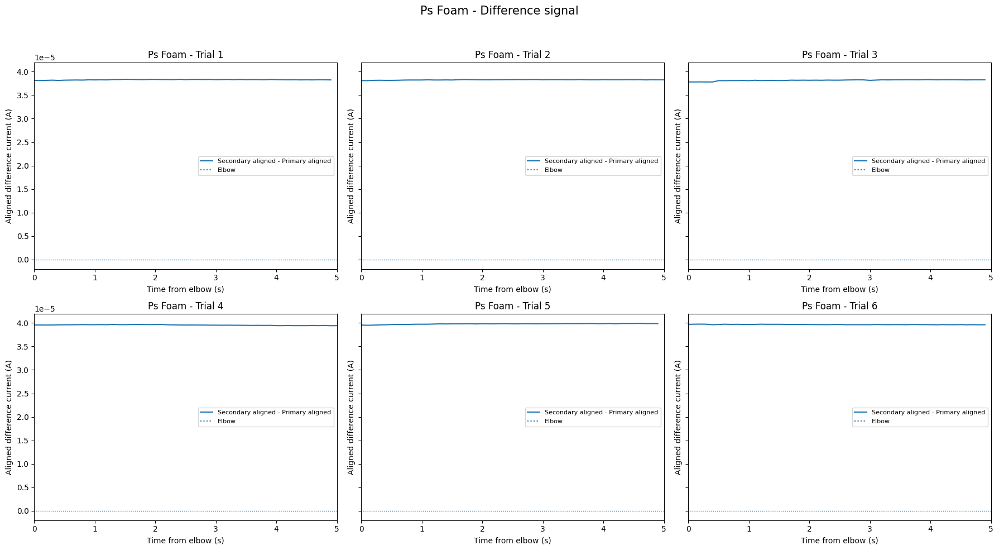

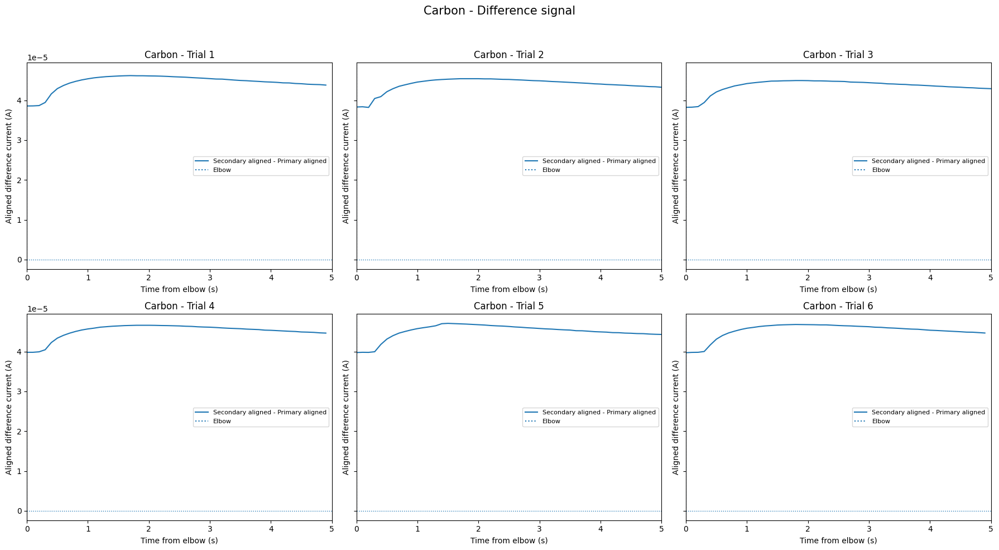

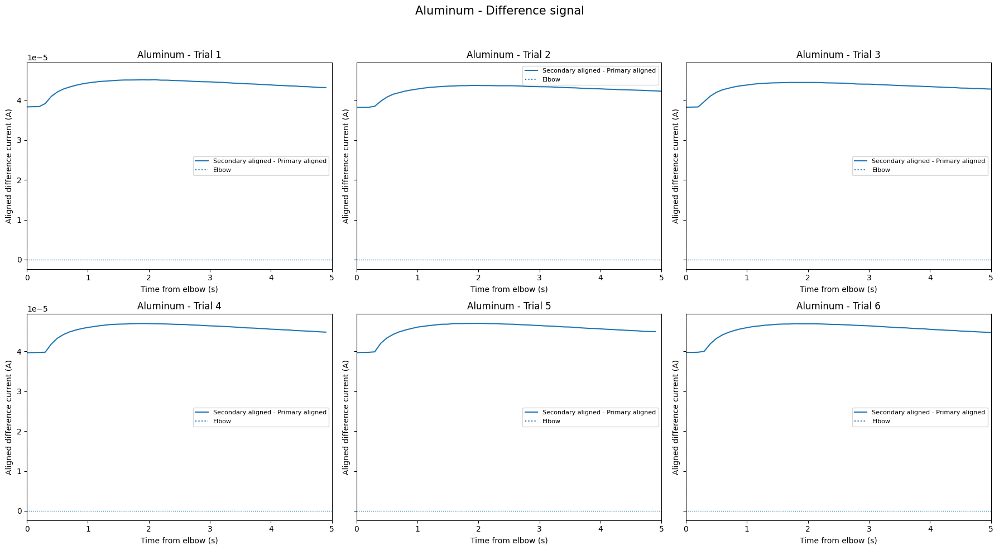

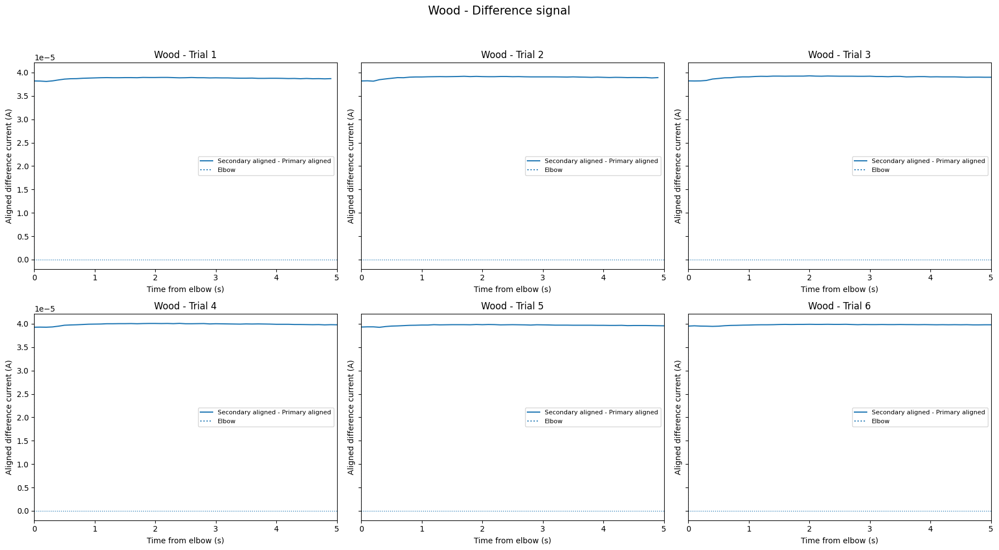

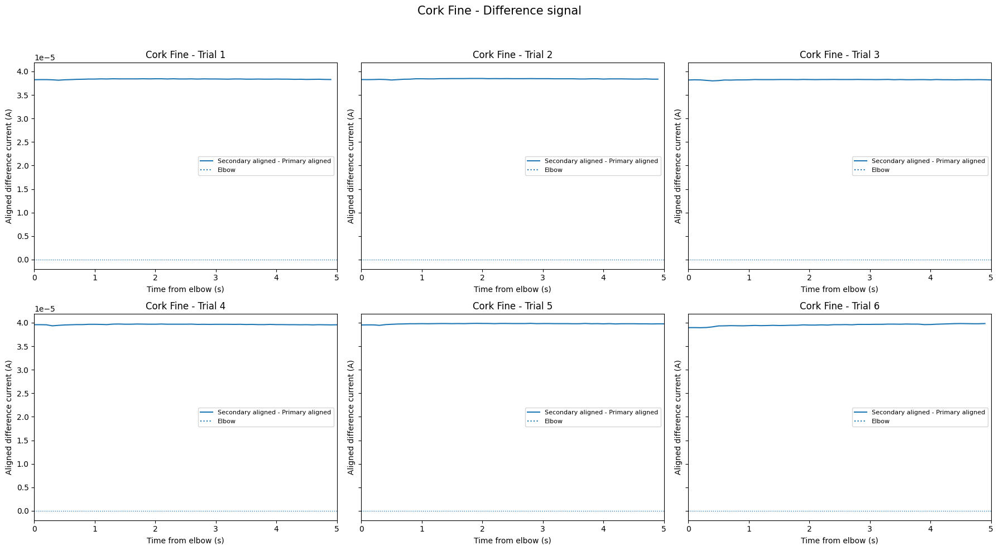

...

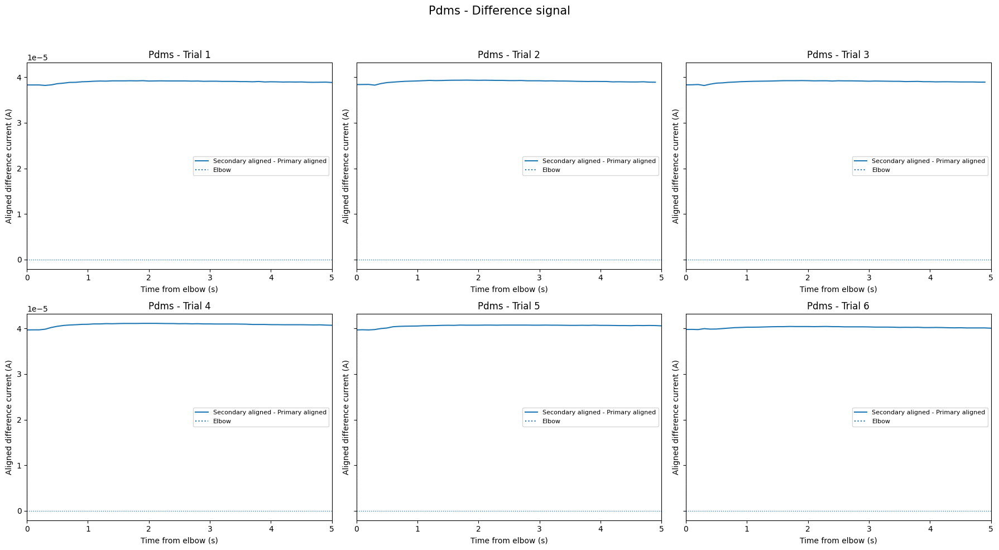

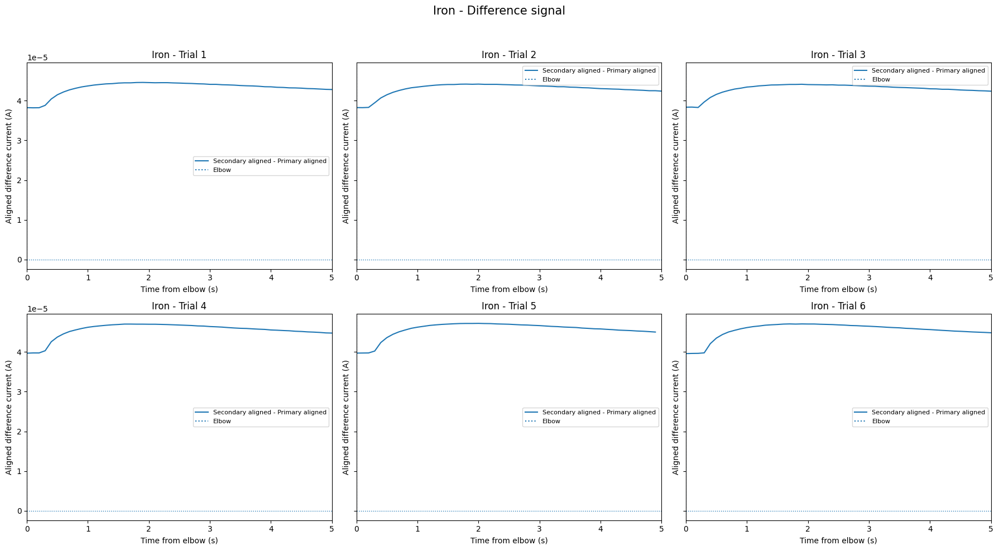

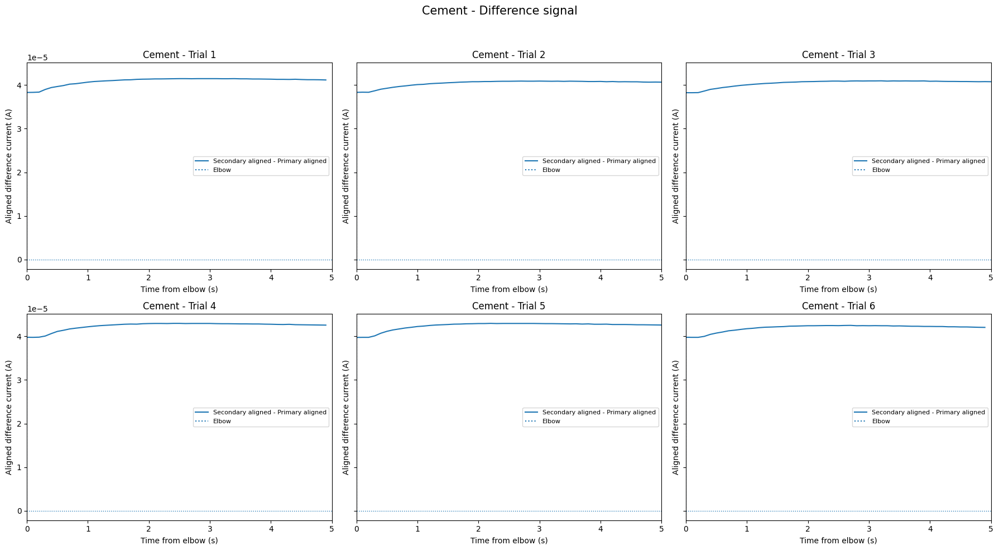

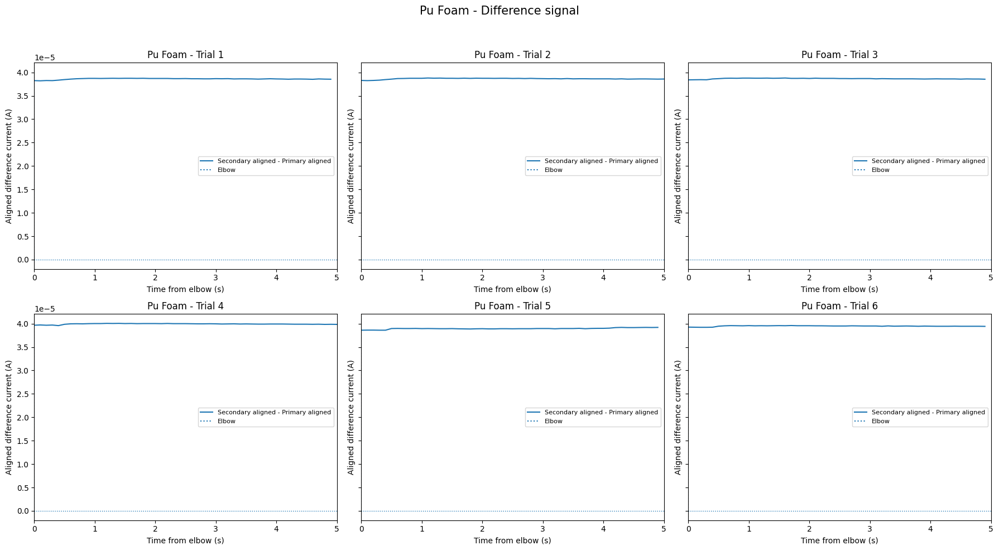

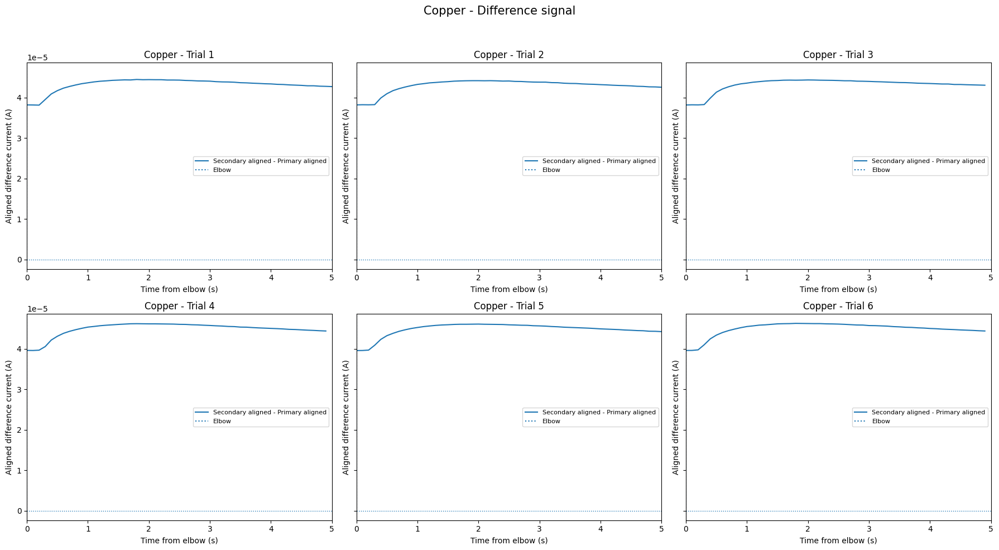

In [15]:
DATA["diff aligned"] = (
    DATA["Secondary aligned"] - DATA["Primary aligned"]
)

DATA["abs diff aligned"] = DATA["diff aligned"].abs()

for material in MATERIALS:
    material_data = DATA[
        (DATA["Sample"] == material)
        & (DATA["Time from elbow"] >= 0)
        & (DATA["Time from elbow"] <= 5)
    ].copy()

    trials = sorted(
        material_data["Trial"]
        .dropna()
        .astype(int)
        .unique()
    )

    n_cols = min(3, len(trials))
    n_rows = math.ceil(len(trials) / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(6 * n_cols, 5 * n_rows),
        sharey=True,
        squeeze=False,
    )

    axes = axes.ravel()

    for ax, trial in zip(axes, trials):
        subset = (
            material_data[material_data["Trial"].astype(int) == trial]
            .sort_values("Time from elbow")
            .copy()
        )

        ax.plot(
            subset["Time from elbow"],
            subset["diff aligned"],
            label="Secondary aligned - Primary aligned",
        )

        ax.axvline(
            0,
            linestyle=":",
            label="Elbow",
        )

        ax.axhline(
            0,
            linestyle=":",
            linewidth=1,
        )

        ax.set_xlim(0, 5)

        ax.set(
            xlabel="Time from elbow (s)",
            ylabel="Aligned difference current (A)",
            title=f"{material.replace('_', ' ').title()} - Trial {trial}",
        )

        ax.legend(fontsize=8)

    for ax in axes[len(trials):]:
        ax.axis("off")

    fig.suptitle(
        f"{material.replace('_', ' ').title()} - Difference signal",
        fontsize=15,
    )

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Feature extraction - thermal features

In [16]:
def extract_trial_features(
    trial_data,
    analysis_window=(0.0, 5.0),
    initial_window=(0.0, 1.0),
    early_window=(0.0, 1.0),
    mid_window=(1.0, 3.0),
    late_window=(3.0, 5.0),
    smooth=True,
    savgol_window=11,
    savgol_polyorder=2,
):
    """
    Extract temperature-response and derivative-based features
    from one trial.

    Assumptions
    -----------
    - Columns:
        Time
        Primary
        Secondary
    - The first row corresponds to detected contact onset/elbow.
    - Primary and Secondary are already temperature values, or are
      linearly proportional to temperature.
    - Time is expressed in seconds.

    Returns
    -------
    pd.Series
        One row containing all extracted features.
    """

    # ------------------------------------------------------------
    # Helper functions
    # ------------------------------------------------------------

    def make_mask(time_array, window):
        start, end = window
        return (time_array >= start) & (time_array <= end)

    def fitted_slope(time_array, signal_array, window):
        """
        Fit y = slope*x + intercept within the selected window.
        """
        mask = make_mask(time_array, window)

        valid = (
            mask
            & np.isfinite(time_array)
            & np.isfinite(signal_array)
        )

        if valid.sum() < 3:
            return np.nan

        slope, _ = np.polyfit(
            time_array[valid],
            signal_array[valid],
            deg=1,
        )

        return float(slope)

    def mean_rate(time_array, signal_array, window):
        """
        Mean dT/dt over a window.

        Equivalent to:
            [T(t2) - T(t1)] / [t2 - t1]
        """
        start, end = window

        if end <= start:
            return np.nan

        if start < time_array.min() or end > time_array.max():
            return np.nan

        start_value = np.interp(
            start,
            time_array,
            signal_array,
        )

        end_value = np.interp(
            end,
            time_array,
            signal_array,
        )

        return float(
            (end_value - start_value)
            / (end - start)
        )

    def safe_ratio(numerator, denominator):
        if (
            not np.isfinite(numerator)
            or not np.isfinite(denominator)
            or np.isclose(denominator, 0.0)
        ):
            return np.nan

        return float(numerator / denominator)

    def estimate_rate_lag(
        time_array,
        primary_rate,
        secondary_rate,
        window,
    ):
        """
        Estimate the lag between Primary and Secondary derivative
        profiles using normalized cross-correlation.

        Positive lag:
            Secondary response occurs after Primary response.
        """
        mask = make_mask(time_array, window)

        t = time_array[mask]
        x = primary_rate[mask]
        y = secondary_rate[mask]

        valid = (
            np.isfinite(t)
            & np.isfinite(x)
            & np.isfinite(y)
        )

        t = t[valid]
        x = x[valid]
        y = y[valid]

        if len(t) < 4:
            return np.nan

        # Resample onto a uniform time grid because cross-correlation
        # assumes equally spaced observations.
        dt = np.median(np.diff(t))

        if not np.isfinite(dt) or dt <= 0:
            return np.nan

        uniform_time = np.arange(
            t[0],
            t[-1] + 0.5 * dt,
            dt,
        )

        x_uniform = np.interp(
            uniform_time,
            t,
            x,
        )

        y_uniform = np.interp(
            uniform_time,
            t,
            y,
        )

        # Remove the means and normalize.
        x_uniform = x_uniform - np.mean(x_uniform)
        y_uniform = y_uniform - np.mean(y_uniform)

        x_std = np.std(x_uniform)
        y_std = np.std(y_uniform)

        if np.isclose(x_std, 0.0) or np.isclose(y_std, 0.0):
            return np.nan

        x_uniform = x_uniform / x_std
        y_uniform = y_uniform / y_std

        correlation = correlate(
            y_uniform,
            x_uniform,
            mode="full",
        )

        lags = correlation_lags(
            len(y_uniform),
            len(x_uniform),
            mode="full",
        )

        best_lag_samples = lags[
            np.argmax(correlation)
        ]

        return float(best_lag_samples * dt)

    # ------------------------------------------------------------
    # 1. Clean and sort the trial
    # ------------------------------------------------------------

    required_columns = {
        "Time",
        "Primary",
        "Secondary",
    }

    missing_columns = (
        required_columns
        - set(trial_data.columns)
    )

    if missing_columns:
        raise KeyError(
            f"Missing columns: {sorted(missing_columns)}"
        )

    trial_data = (
        trial_data[
            ["Time", "Primary", "Secondary"]
        ]
        .copy()
        .apply(pd.to_numeric, errors="coerce")
        .dropna()
        .sort_values("Time")
        .drop_duplicates(subset="Time")
        .reset_index(drop=True)
    )

    if len(trial_data) < 4:
        raise ValueError(
            "The trial contains too few valid observations."
        )

    original_time = trial_data[
        "Time"
    ].to_numpy(dtype=float)

    primary = trial_data[
        "Primary"
    ].to_numpy(dtype=float)

    secondary = trial_data[
        "Secondary"
    ].to_numpy(dtype=float)

    if np.any(np.diff(original_time) <= 0):
        raise ValueError(
            "Time must be strictly increasing."
        )

    # ------------------------------------------------------------
    # 2. Treat first observation as contact onset/elbow
    # ------------------------------------------------------------

    elbow_time = float(original_time[0])

    time = original_time - elbow_time

    # ------------------------------------------------------------
    # 3. Restrict every trial to the same fixed analysis window
    # ------------------------------------------------------------

    analysis_mask = make_mask(
        time,
        analysis_window,
    )

    time = time[analysis_mask]
    primary = primary[analysis_mask]
    secondary = secondary[analysis_mask]

    if len(time) < 4:
        raise ValueError(
            "Too few observations inside analysis_window."
        )

    # ------------------------------------------------------------
    # 4. Smooth the temperature signals before differentiation
    # ------------------------------------------------------------

    def smooth_signal(signal):
        if not smooth:
            return signal.copy()

        window = min(
            int(savgol_window),
            len(signal),
        )

        # Savitzky-Golay window must be odd.
        if window % 2 == 0:
            window -= 1

        minimum_window = savgol_polyorder + 2

        if minimum_window % 2 == 0:
            minimum_window += 1

        if window < minimum_window:
            return signal.copy()

        return savgol_filter(
            signal,
            window_length=window,
            polyorder=savgol_polyorder,
            mode="interp",
        )

    primary_smooth = smooth_signal(primary)
    secondary_smooth = smooth_signal(secondary)

    difference_smooth = (
        primary_smooth - secondary_smooth
    )

    # ------------------------------------------------------------
    # 5. Calculate full dT/dt profiles
    # ------------------------------------------------------------

    # np.gradient supports nonuniform time spacing.
    primary_rate = np.gradient(
        primary_smooth,
        time,
    )

    secondary_rate = np.gradient(
        secondary_smooth,
        time,
    )

    difference_rate = (
        primary_rate - secondary_rate
    )

    signals = {
        "primary": {
            "temperature": primary_smooth,
            "rate": primary_rate,
        },
        "secondary": {
            "temperature": secondary_smooth,
            "rate": secondary_rate,
        },
        "difference": {
            "temperature": difference_smooth,
            "rate": difference_rate,
        },
    }

    result = {
        "elbow_time": elbow_time,
        "analysis_start": analysis_window[0],
        "analysis_end": analysis_window[1],
    }

    # ------------------------------------------------------------
    # 6. Extract temperature and derivative features
    # ------------------------------------------------------------

    for name, values in signals.items():

        signal = values["temperature"]
        rate = values["rate"]

        baseline_value = float(signal[0])
        change = signal - baseline_value

        # --------------------------------------------------------
        # Temperature-response features
        # --------------------------------------------------------

        result[f"{name}_elbow_value"] = baseline_value

        # Since heating is sustained, use fixed-window endpoint
        # rather than "peak temperature."
        result[f"{name}_final_offset"] = float(
            change[-1]
        )

        result[f"{name}_response_auc"] = float(
            np.trapezoid(
                np.abs(change),
                time,
            )
        )

        # --------------------------------------------------------
        # Initial rate: fitted slope over initial_window
        # --------------------------------------------------------

        initial_rate = fitted_slope(
            time,
            signal,
            initial_window,
        )

        # Mean early rate:
        # [T(t2)-T(t1)] / [t2-t1]
        early_mean_rate = mean_rate(
            time,
            signal,
            early_window,
        )

        # Mid- and late-window fitted rates
        mid_rate = fitted_slope(
            time,
            signal,
            mid_window,
        )

        late_rate = fitted_slope(
            time,
            signal,
            late_window,
        )

        # --------------------------------------------------------
        # Maximum derivative and corresponding time
        # --------------------------------------------------------

        if np.all(np.isnan(rate)):
            max_rate = np.nan
            max_abs_rate = np.nan
            time_of_max_rate = np.nan
            time_of_max_abs_rate = np.nan

        else:
            max_rate_index = int(
                np.nanargmax(rate)
            )

            max_abs_rate_index = int(
                np.nanargmax(np.abs(rate))
            )

            max_rate = float(
                rate[max_rate_index]
            )

            max_abs_rate = float(
                np.abs(
                    rate[max_abs_rate_index]
                )
            )

            time_of_max_rate = float(
                time[max_rate_index]
            )

            time_of_max_abs_rate = float(
                time[max_abs_rate_index]
            )

        # --------------------------------------------------------
        # Rate-decay ratio
        # --------------------------------------------------------

        rate_decay_ratio = safe_ratio(
            late_rate,
            initial_rate,
        )

        # --------------------------------------------------------
        # Rate AUC
        # --------------------------------------------------------

        rate_auc = float(
            np.trapezoid(
                np.abs(rate),
                time,
            )
        )

        # For monotonic heating, the signed rate AUC should be
        # approximately equal to the final temperature change.
        signed_rate_auc = float(
            np.trapezoid(
                rate,
                time,
            )
        )

        # --------------------------------------------------------
        # Derivative variability
        # --------------------------------------------------------

        rate_std = (
            float(np.nanstd(rate, ddof=1))
            if len(rate) > 1
            else np.nan
        )

        # --------------------------------------------------------
        # Store results
        # --------------------------------------------------------

        result[f"{name}_initial_rate"] = initial_rate
        result[f"{name}_mean_early_rate"] = early_mean_rate
        result[f"{name}_mid_window_rate"] = mid_rate
        result[f"{name}_late_window_rate"] = late_rate

        result[f"{name}_max_rate"] = max_rate
        result[f"{name}_time_of_max_rate"] = (
            time_of_max_rate
        )

        result[f"{name}_max_abs_rate"] = max_abs_rate
        result[f"{name}_time_of_max_abs_rate"] = (
            time_of_max_abs_rate
        )

        result[f"{name}_rate_decay_ratio"] = (
            rate_decay_ratio
        )

        result[f"{name}_rate_auc"] = rate_auc
        result[f"{name}_signed_rate_auc"] = (
            signed_rate_auc
        )

        result[f"{name}_rate_std"] = rate_std

    # ------------------------------------------------------------
    # 7. Primary-secondary comparison features
    # ------------------------------------------------------------

    result["secondary_initial_rate_ratio"] = safe_ratio(
        result["secondary_initial_rate"],
        result["primary_initial_rate"],
    )

    result["secondary_mid_rate_ratio"] = safe_ratio(
        result["secondary_mid_window_rate"],
        result["primary_mid_window_rate"],
    )

    result["secondary_late_rate_ratio"] = safe_ratio(
        result["secondary_late_window_rate"],
        result["primary_late_window_rate"],
    )

    result["secondary_rate_auc_ratio"] = safe_ratio(
        result["secondary_rate_auc"],
        result["primary_rate_auc"],
    )

    # ------------------------------------------------------------
    # 8. Top-bottom rate-difference features
    # ------------------------------------------------------------

    result["mean_top_bottom_rate_difference"] = float(
        np.nanmean(difference_rate)
    )

    result["max_top_bottom_rate_difference"] = float(
        np.nanmax(difference_rate)
    )

    result["max_abs_top_bottom_rate_difference"] = float(
        np.nanmax(
            np.abs(difference_rate)
        )
    )

    result["top_bottom_rate_difference_auc"] = float(
        np.trapezoid(
            np.abs(difference_rate),
            time,
        )
    )

    result["top_bottom_rate_difference_std"] = float(
        np.nanstd(
            difference_rate,
            ddof=1,
        )
    )

    # ------------------------------------------------------------
    # 9. Lag between full Primary and Secondary rate profiles
    # ------------------------------------------------------------

    result["top_bottom_rate_lag"] = (
        estimate_rate_lag(
            time,
            primary_rate,
            secondary_rate,
            analysis_window,
        )
    )

    # ------------------------------------------------------------
    # 10. Return one feature row
    # ------------------------------------------------------------

    return pd.Series(result)

In [17]:
# 1. Define the new extract_trial_features function

# 2. Run this
features_df = (
    DATA
    .groupby(["Sample", "Trial", "Label", "k"])
    .apply(
        lambda trial_data: extract_trial_features(
            trial_data,
            analysis_window=(0.0, 5.0),
            initial_window=(0.0, 1.0),
            early_window=(0.0, 1.0),
            mid_window=(1.0, 3.0),
            late_window=(3.0, 5.0),
        )
    )
    .reset_index()
)

# 3. View the extracted features
features_df.head()

,Sample,Trial,Label,k,elbow_time,analysis_start,analysis_end,primary_elbow_value,primary_final_offset,primary_response_auc,...,secondary_initial_rate_ratio,secondary_mid_rate_ratio,secondary_late_rate_ratio,secondary_rate_auc_ratio,mean_top_bottom_rate_difference,max_top_bottom_rate_difference,max_abs_top_bottom_rate_difference,top_bottom_rate_difference_auc,top_bottom_rate_difference_std,top_bottom_rate_lag
0,aluminum,1,metal,215.0,8.60066,0.0,5.0,0.000660,-0.000009,0.000038,...,0.026637,1.023242,3.918869,0.406050,-1.207392e-06,7.961172e-07,0.000009,0.000010,0.000003,2.4
1,aluminum,2,metal,215.0,9.20070,0.0,5.0,0.000658,-0.000008,0.000031,...,0.039351,0.851877,3.273539,0.402867,-9.586497e-07,6.515204e-07,0.000007,0.000007,0.000002,3.0
2,aluminum,3,metal,215.0,10.50070,0.0,5.0,0.000659,-0.000008,0.000035,...,0.012310,1.051715,3.887082,0.368900,-1.132748e-06,6.743590e-07,0.000010,0.000009,0.000003,2.5
3,aluminum,4,metal,215.0,10.50070,0.0,5.0,0.000660,-0.000010,0.000041,...,0.034507,1.021596,3.661417,0.421558,-1.270499e-06,8.913105e-07,0.000010,0.000010,0.000003,3.0
4,aluminum,5,metal,215.0,10.40066,0.0,5.0,0.000660,-0.000010,0.000041,...,0.040338,0.867137,3.475210,0.419662,-1.285195e-06,8.876202e-07,0.000010,0.000010,0.000003,3.2


In [18]:
# ============================================================
# 1. Select the extracted features to visualize
# ============================================================

features = [
    # --------------------------------------------------------
    # Primary sensor
    # --------------------------------------------------------
    "primary_initial_rate",
    "primary_mean_early_rate",
    "primary_mid_window_rate",
    "primary_late_window_rate",
    "primary_max_rate",
    #"primary_time_of_max_rate",
    #"primary_rate_decay_ratio",
    "primary_rate_auc",
    "primary_rate_std",
    "primary_final_offset",
    "primary_response_auc",

    # --------------------------------------------------------
    # Secondary sensor
    # --------------------------------------------------------
    "secondary_initial_rate",
    "secondary_mean_early_rate",
    "secondary_mid_window_rate",
    "secondary_late_window_rate",
    "secondary_max_rate",
    #"secondary_time_of_max_rate",
    #"secondary_rate_decay_ratio",
    "secondary_rate_auc",
    "secondary_rate_std",
    "secondary_final_offset",
    "secondary_response_auc",

    # --------------------------------------------------------
    # Primary - Secondary difference
    # --------------------------------------------------------
    "difference_initial_rate",
    "difference_mean_early_rate",
    "difference_mid_window_rate",
    "difference_late_window_rate",
    "difference_max_rate",
    #"difference_time_of_max_rate",
    #"difference_rate_decay_ratio",
    "difference_rate_auc",
    "difference_rate_std",
    "difference_final_offset",
    "difference_response_auc",

    # --------------------------------------------------------
    # Secondary-to-primary ratios
    # --------------------------------------------------------
    "secondary_initial_rate_ratio",
    "secondary_mid_rate_ratio",
    "secondary_late_rate_ratio",
    "secondary_rate_auc_ratio",

    # --------------------------------------------------------
    # Cross-sensor derivative features
    # --------------------------------------------------------
    "mean_top_bottom_rate_difference",
    "max_top_bottom_rate_difference",
    "max_abs_top_bottom_rate_difference",
    "top_bottom_rate_difference_auc",
    "top_bottom_rate_difference_std",
    "top_bottom_rate_lag",
]


# Keep only features that actually exist in features_df.
# This prevents KeyError if some names were not generated.
features = [
    feature
    for feature in features
    if feature in features_df.columns
]

print(f"Number of features to plot: {len(features)}")

Number of features to plot: 37


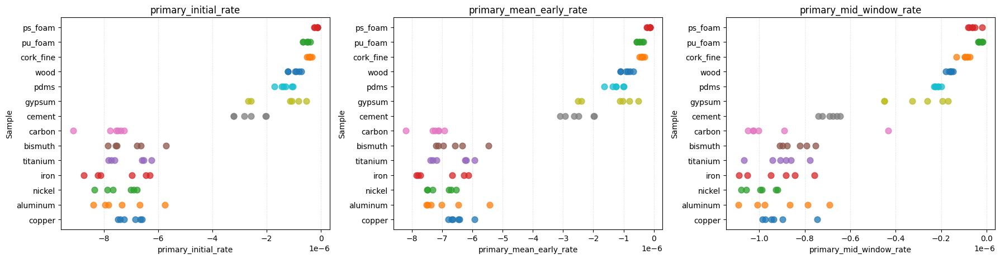

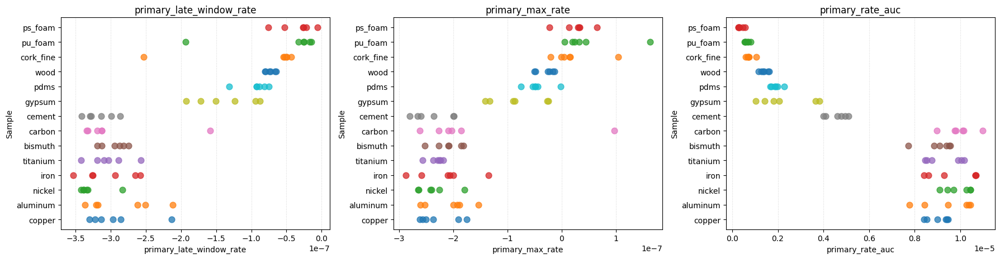

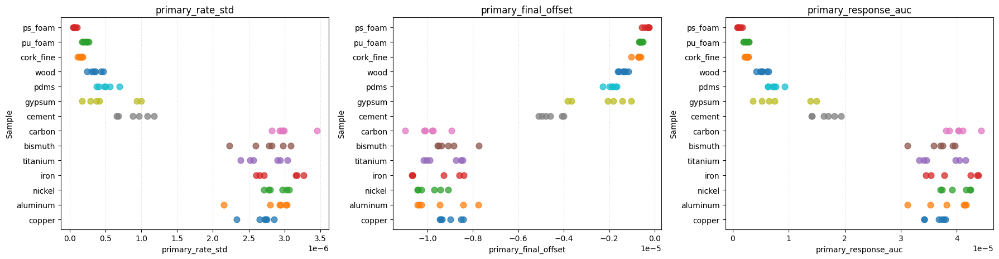

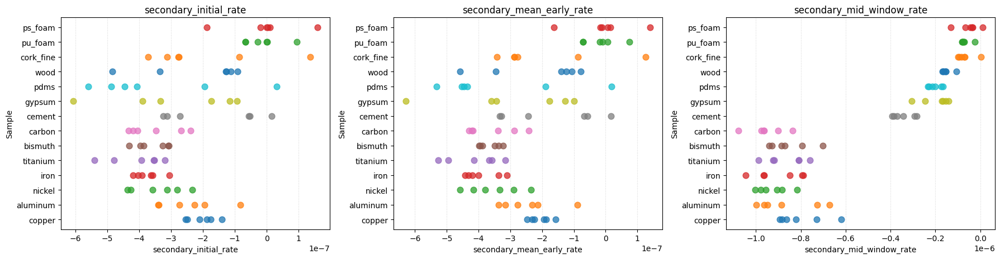

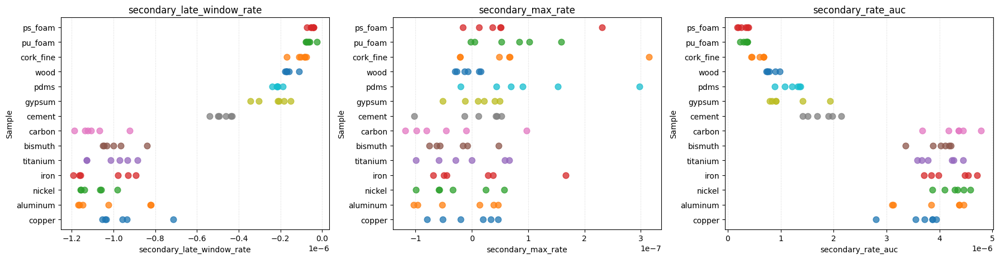

...

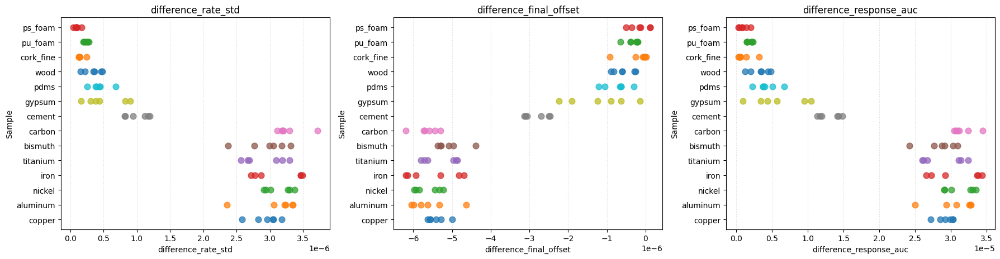

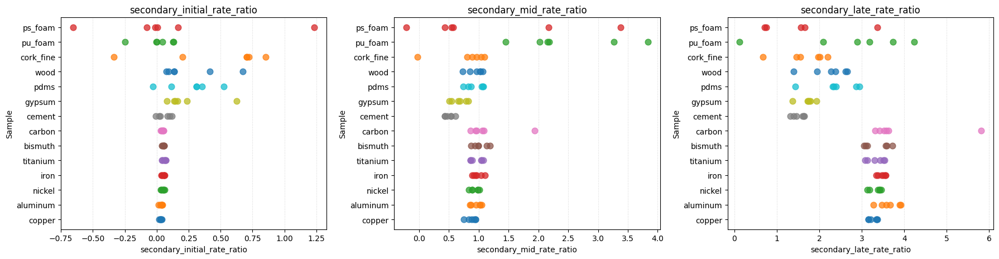

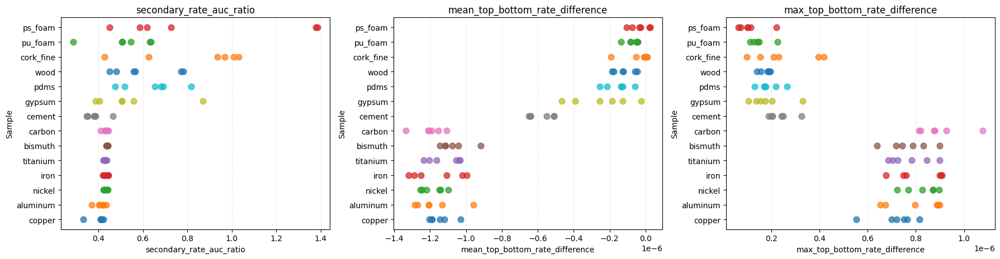

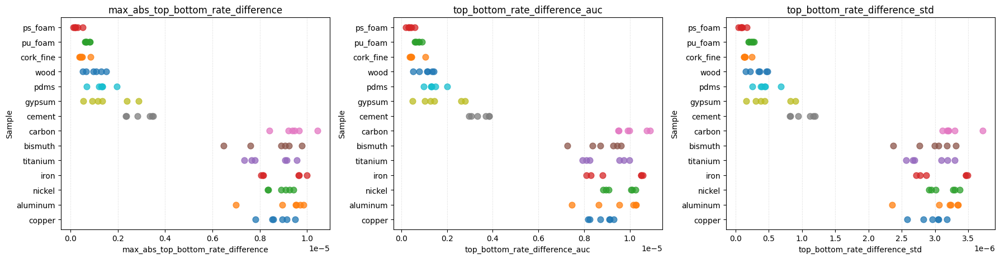

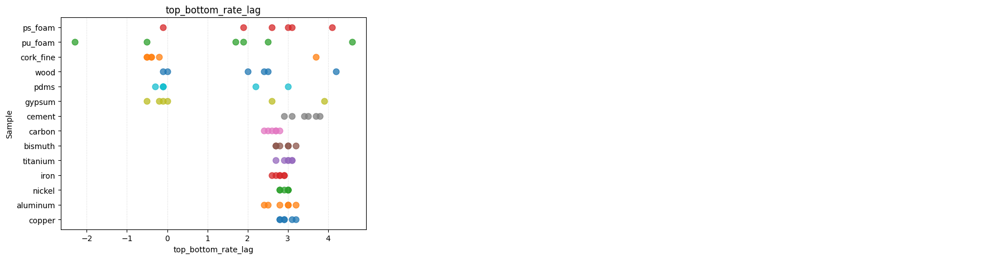

In [19]:
legend_col = "Sample"

plots_per_fig = 3
n_cols = 3
n_rows = 1

n_figures = math.ceil(
    len(features) / plots_per_fig
)

desired_order = [
    "copper",
    "aluminum",
    "nickel",
    "iron",
    "titanium",
    "bismuth",
    "carbon",
    "cement",
    "gypsum",
    "pdms",
    "wood",
    "cork_fine",
    "cork_coarse",
    "pu_foam",
    "ps_foam",
    "abrasive",      # Polyester foam
]

available_groups = (
    features_df[legend_col]
    .dropna()
    .unique()
)

groups = [
    group
    for group in desired_order
    if group in available_groups
]

# Include any samples not listed in desired_order
remaining_groups = [
    group
    for group in available_groups
    if group not in groups
]

groups.extend(remaining_groups)


for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig

    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 5),
    )

    axes = np.atleast_1d(axes).flatten()

    for ax, feature in zip(
        axes,
        current_features,
    ):

        for group_idx, group in enumerate(groups):

            subset = features_df[
                features_df[legend_col] == group
            ]

            values = pd.to_numeric(
                subset[feature],
                errors="coerce",
            ).dropna()

            if values.empty:
                continue

            y_position = np.full(
                len(values),
                group_idx,
                dtype=float,
            )

            # Small vertical jitter helps reveal overlapping trials
            jitter = np.random.uniform(
                0,
                0.005,
                size=len(values),
            )

            ax.scatter(
                values,
                y_position + jitter,
                label=str(group),
                alpha=0.75,
                s=60,
            )

        ax.set_yticks(
            range(len(groups))
        )

        ax.set_yticklabels(groups)

        ax.set_xlabel(feature)
        ax.set_ylabel(legend_col)
        ax.set_title(feature)

        ax.grid(
            axis="x",
            linestyle=":",
            alpha=0.5,
        )

    # Hide unused axes in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")

    """
    fig.suptitle(
        (
            "Feature number-line plots — "
            f"Figure {fig_num + 1}"
        ),
        fontsize=16,
    )
    """

    plt.tight_layout(
        rect=[0, 0, 1, 0.95]
    )

    plt.show()

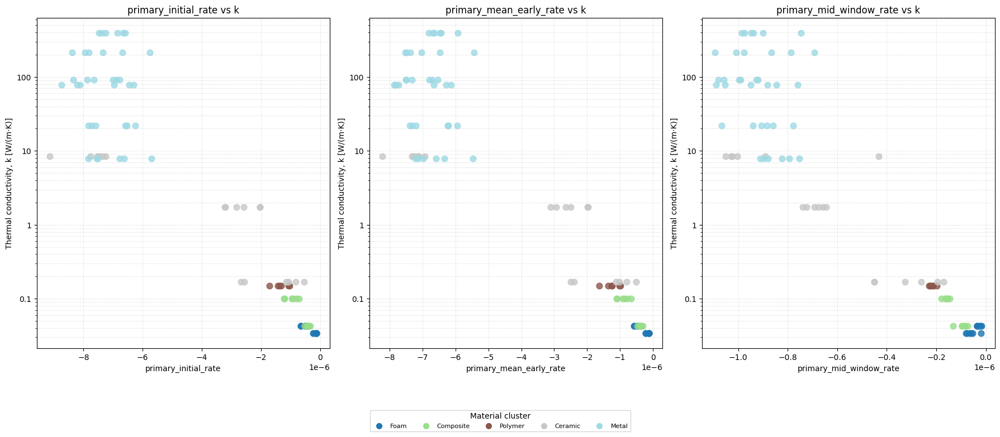

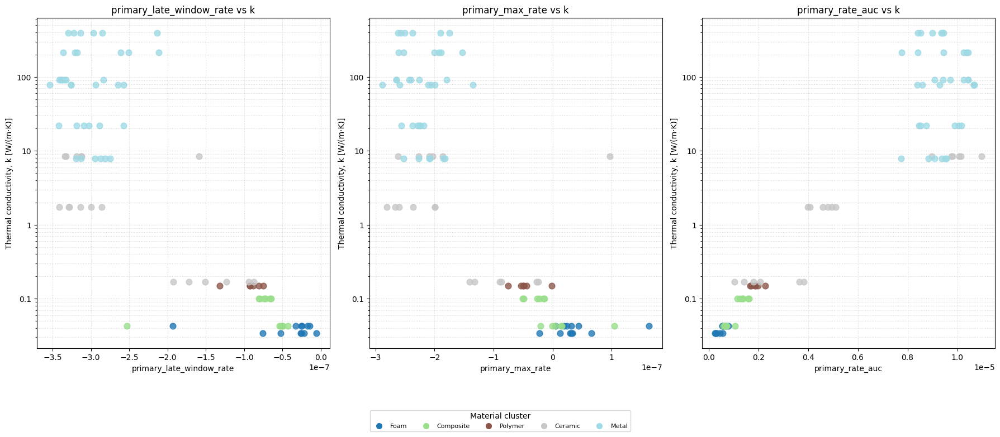

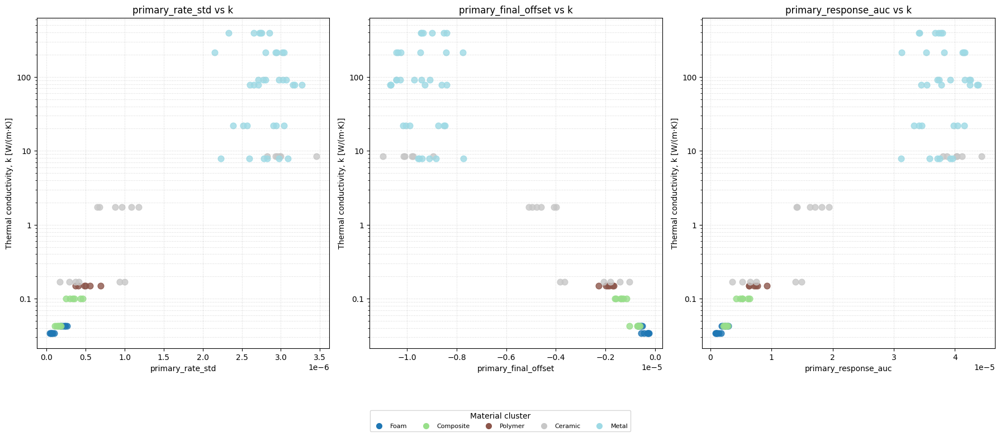

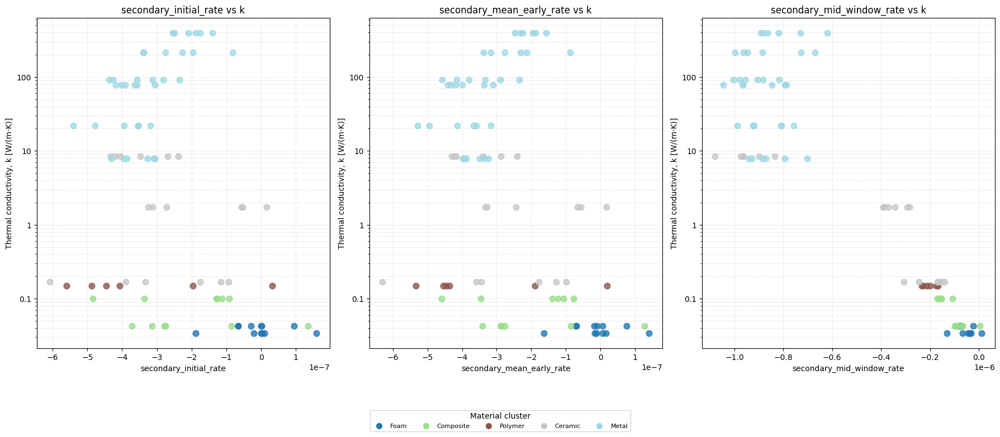

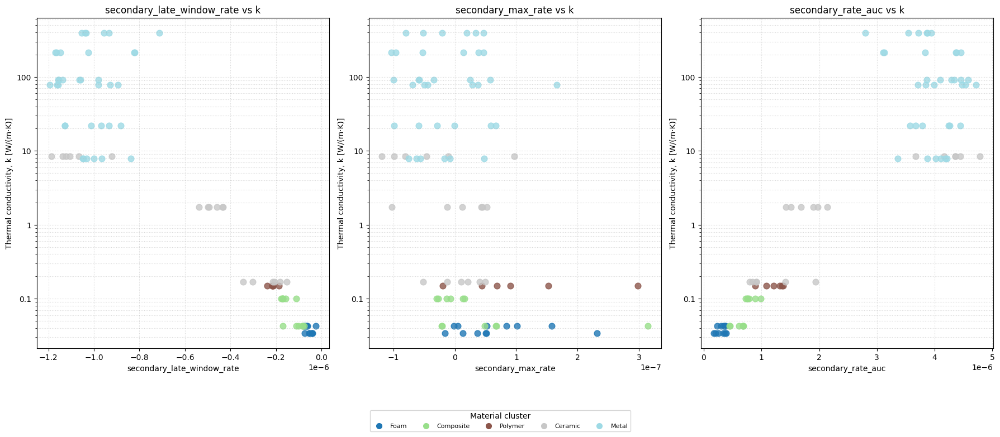

...

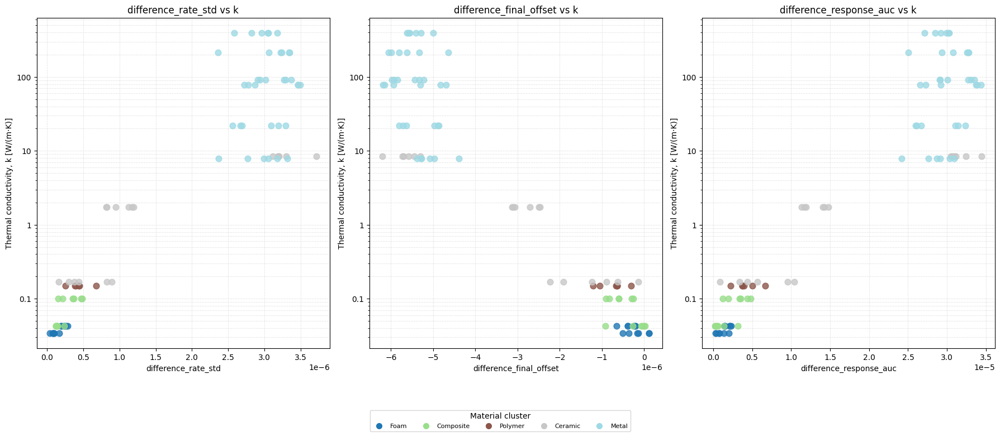

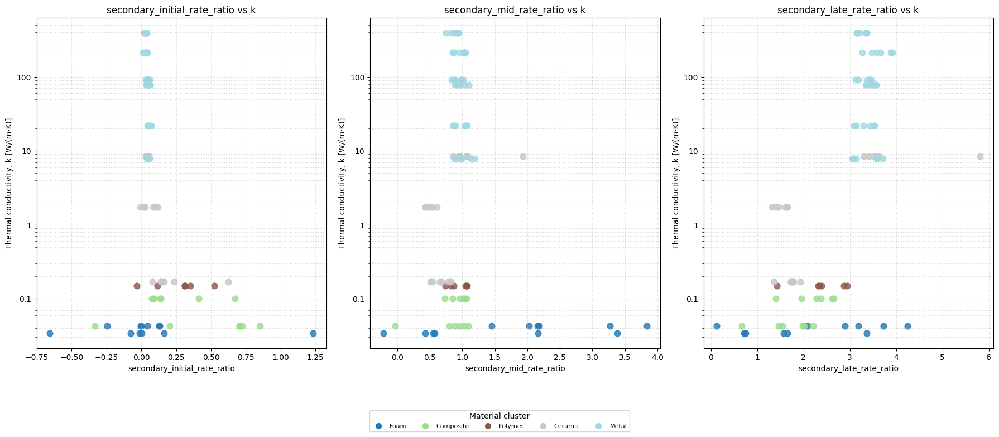

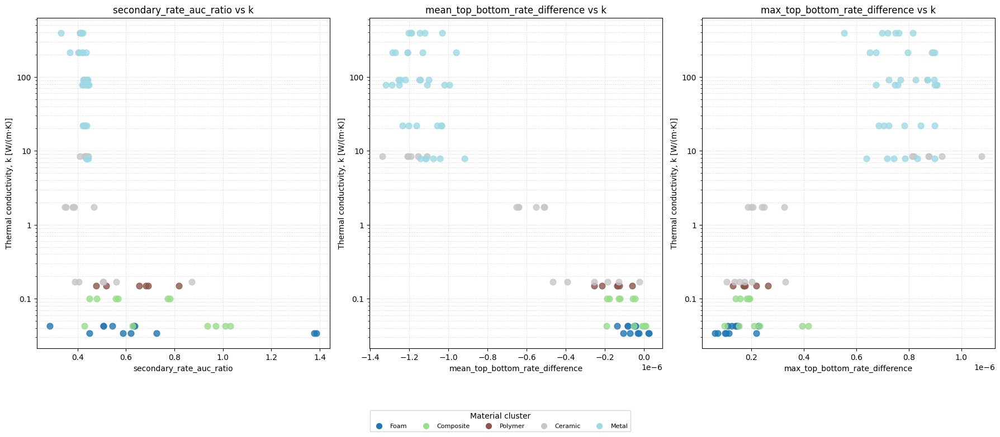

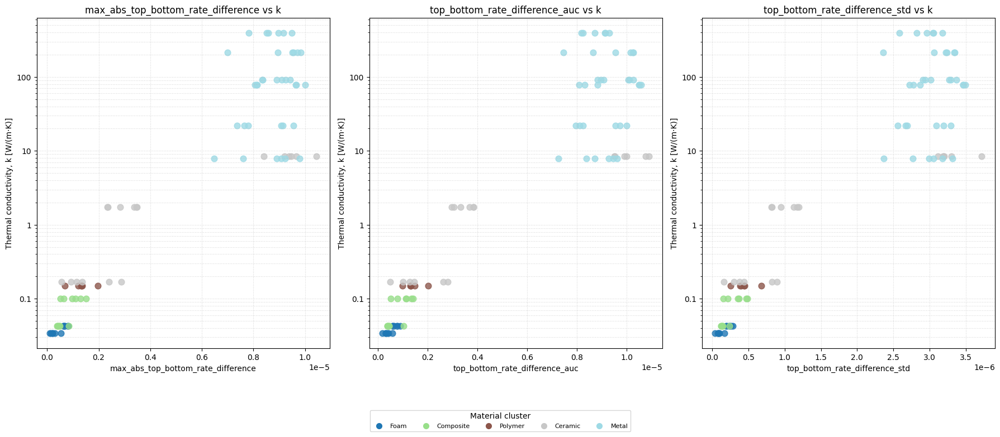

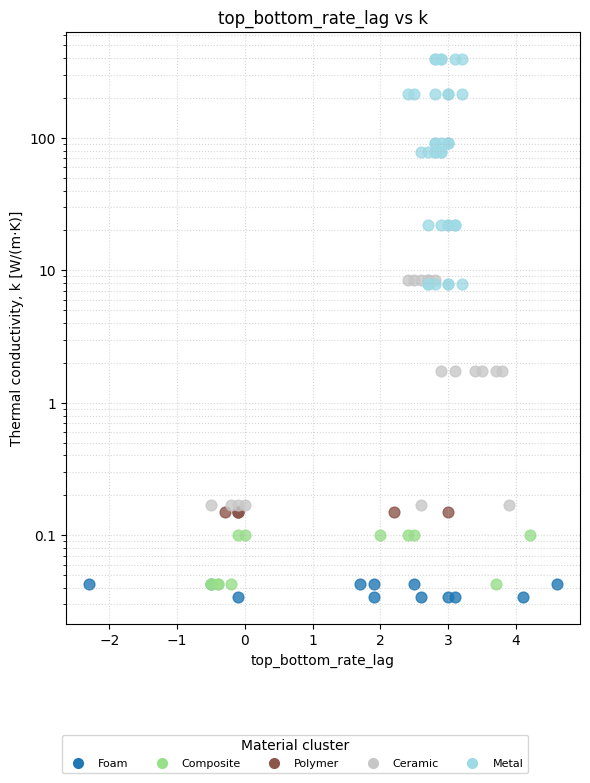

In [20]:
legend_col = "Label"
y_col = "k"
plots_per_fig = 3

# --------------------------------------------------
# Prepare plotting data
# --------------------------------------------------

plot_df = (
    features_df
    .copy()
    .replace([np.inf, -np.inf], np.nan)
)

plot_df[y_col] = pd.to_numeric(
    plot_df[y_col],
    errors="coerce"
)

# Logarithmic axes require positive values
plot_df = plot_df[
    plot_df[y_col] > 0
].copy()


# --------------------------------------------------
# Keep features containing valid numeric values
# --------------------------------------------------

valid_features = []

for feature in features:

    if feature not in plot_df.columns:
        print(f"Missing feature: {feature}")
        continue

    plot_df[feature] = pd.to_numeric(
        plot_df[feature],
        errors="coerce"
    )

    if plot_df[[feature, y_col]].dropna().empty:
        print(f"No valid numeric values: {feature}")
        continue

    valid_features.append(feature)


# --------------------------------------------------
# Order labels automatically by median k
# --------------------------------------------------

groups = (
    plot_df
    .dropna(subset=[legend_col])
    .groupby(legend_col)[y_col]
    .median()
    .sort_values()
    .index
    .tolist()
)


# --------------------------------------------------
# Assign one consistent color to each label
# --------------------------------------------------

cmap = plt.get_cmap(
    "tab20",
    len(groups)
)

group_colors = {
    group: cmap(i)
    for i, group in enumerate(groups)
}


# --------------------------------------------------
# Create plots
# --------------------------------------------------

n_figures = math.ceil(
    len(valid_features) / plots_per_fig
)

for fig_num in range(n_figures):

    current_features = valid_features[
        fig_num * plots_per_fig:
        (fig_num + 1) * plots_per_fig
    ]

    n_current = len(current_features)

    fig, axes = plt.subplots(
        1,
        n_current,
        figsize=(6 * n_current, 8),
        squeeze=False
    )

    axes = axes.ravel()

    for ax, feature in zip(
        axes,
        current_features
    ):

        for group in groups:

            subset = plot_df[
                plot_df[legend_col] == group
            ].dropna(
                subset=[feature, y_col]
            )

            if subset.empty:
                continue

            ax.scatter(
                subset[feature],
                subset[y_col],
                color=group_colors[group],
                alpha=0.8,
                s=60
            )

        ax.set_xlabel(feature)

        ax.set_ylabel(
            "Thermal conductivity, k [W/(m·K)]"
        )

        ax.set_title(
            f"{feature} vs k"
        )

        # Logarithmic numeric y-axis
        ax.set_yscale("log")

        # Major ticks at powers of 10
        ax.yaxis.set_major_locator(
            LogLocator(base=10)
        )

        # Display 0.01, 0.1, 1, 10, 100 instead of scientific notation
        ax.yaxis.set_major_formatter(
            FuncFormatter(
                lambda value, position: f"{value:g}"
            )
        )

        ax.grid(
            which="both",
            linestyle=":",
            alpha=0.5
        )


    # --------------------------------------------------
    # Shared legend
    # --------------------------------------------------

    legend_handles = [
        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="",
            markerfacecolor=group_colors[group],
            markeredgecolor=group_colors[group],
            markersize=7,
            label=str(group).replace("_", " ").title()
        )
        for group in groups
    ]

    fig.legend(
        handles=legend_handles,
        title="Material cluster",
        loc="lower center",
        bbox_to_anchor=(0.5, 0.02),
        ncol=min(8, len(groups)),
        fontsize=8
    )

    plt.tight_layout(
        rect=[0, 0.14, 1, 1]
    )

    plt.show()

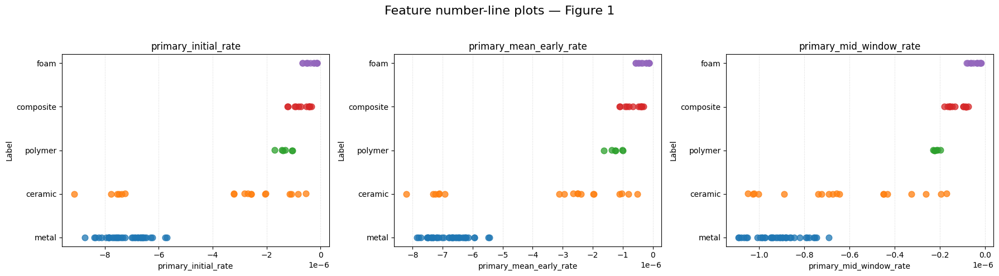

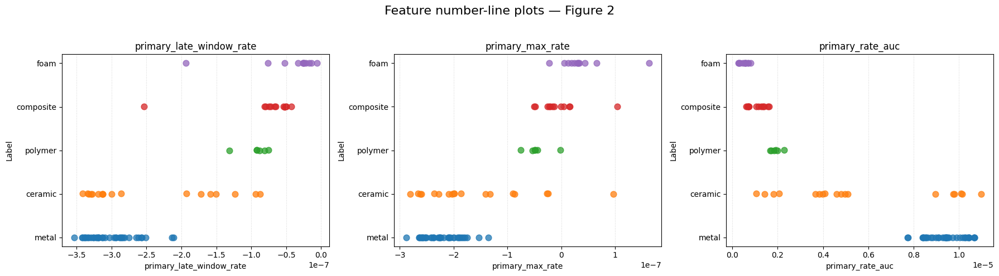

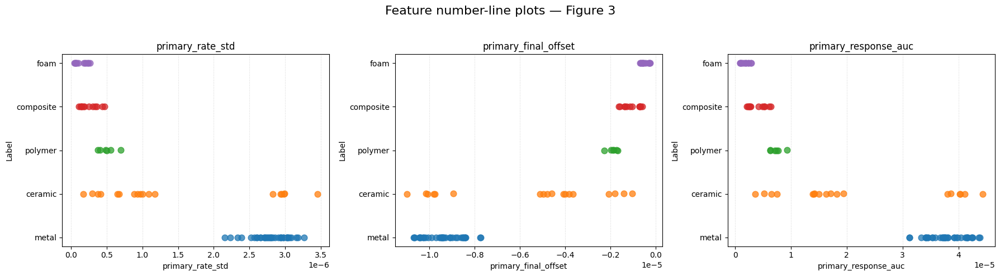

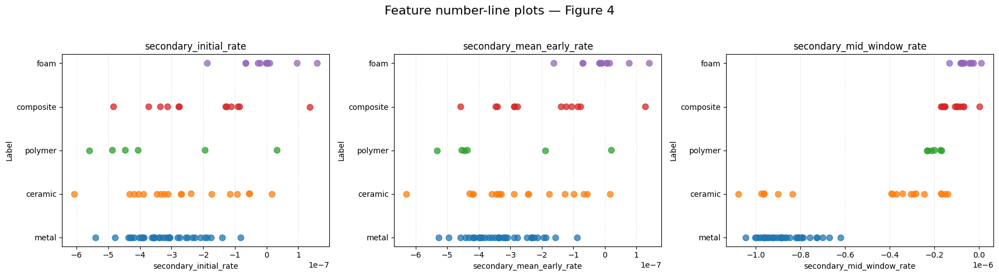

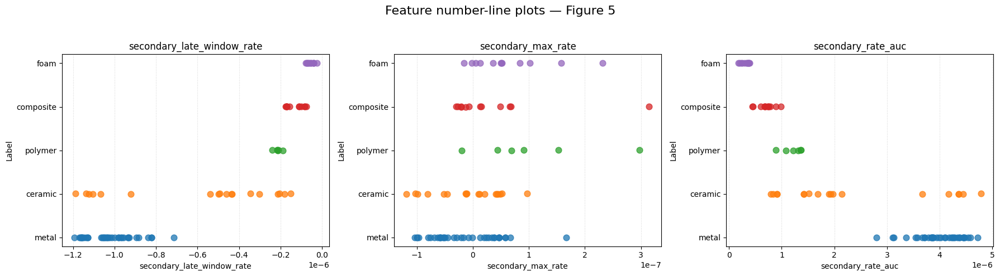

...

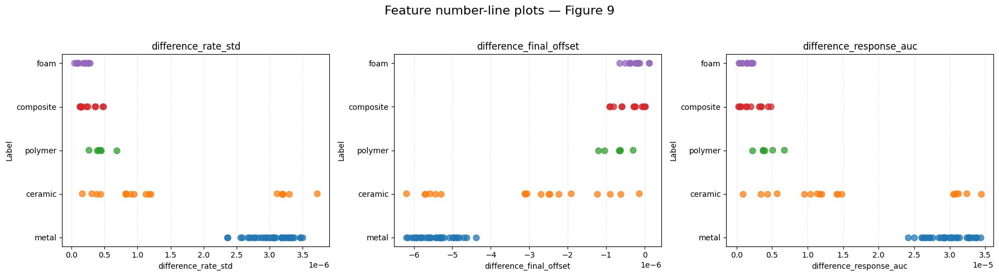

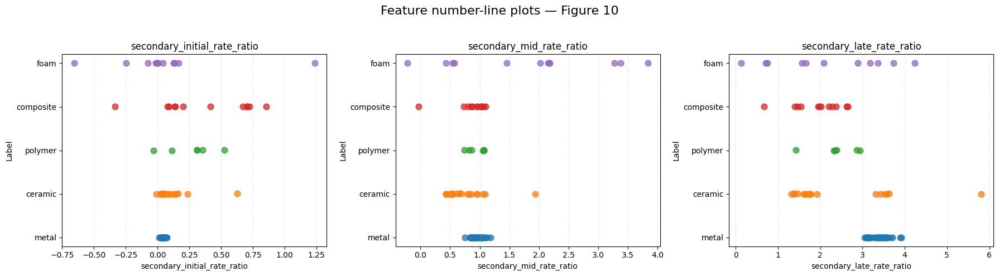

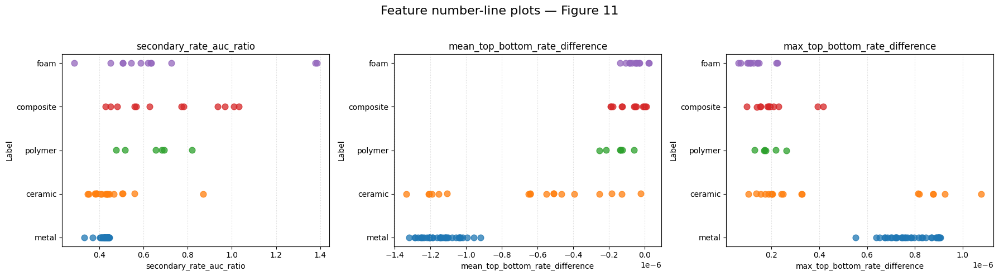

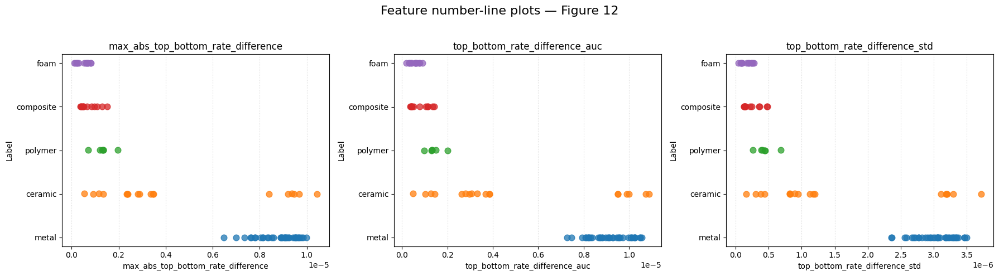

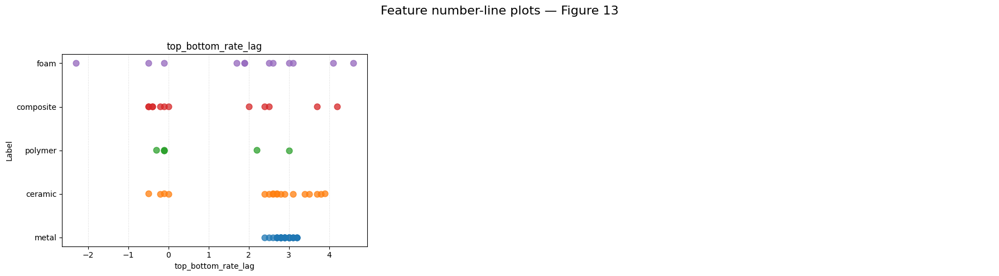

In [21]:
legend_col = "Label"

plots_per_fig = 3
n_cols = 3
n_rows = 1

n_figures = math.ceil(
    len(features) / plots_per_fig
)

desired_order = [
    'metal'
    ,'ceramic'
    ,'polymer'
    ,'composite'
]

available_groups = (
    features_df[legend_col]
    .dropna()
    .unique()
)

groups = [
    group
    for group in desired_order
    if group in available_groups
]

# Include any samples not listed in desired_order
remaining_groups = [
    group
    for group in available_groups
    if group not in groups
]

groups.extend(remaining_groups)


for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig

    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 5),
    )

    axes = np.atleast_1d(axes).flatten()

    for ax, feature in zip(
        axes,
        current_features,
    ):

        for group_idx, group in enumerate(groups):

            subset = features_df[
                features_df[legend_col] == group
            ]

            values = pd.to_numeric(
                subset[feature],
                errors="coerce",
            ).dropna()

            if values.empty:
                continue

            y_position = np.full(
                len(values),
                group_idx,
                dtype=float,
            )

            # Small vertical jitter helps reveal overlapping trials
            jitter = np.random.uniform(
                0,
                0.005,
                size=len(values),
            )

            ax.scatter(
                values,
                y_position + jitter,
                label=str(group),
                alpha=0.75,
                s=60,
            )

        ax.set_yticks(
            range(len(groups))
        )

        ax.set_yticklabels(groups)

        ax.set_xlabel(feature)
        ax.set_ylabel(legend_col)
        ax.set_title(feature)

        ax.grid(
            axis="x",
            linestyle=":",
            alpha=0.5,
        )

    # Hide unused axes in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")

    fig.suptitle(
        (
            "Feature number-line plots — "
            f"Figure {fig_num + 1}"
        ),
        fontsize=16,
    )

    plt.tight_layout(
        rect=[0, 0, 1, 0.95]
    )

    plt.show()

# Feature Extraction - `tsfresh` 

In [22]:
_basic = [
    "mean", "median", "minimum", "maximum", "absolute_maximum"
]

_variability = [
    "standard_deviation", "variance", "root_mean_square",
    "mean_abs_change", "mean_change"
]

_distribution = ["skewness", "kurtosis"]
_energy = ["abs_energy", "sum_values"]
_counts = ["count_above_mean", "count_below_mean"]
_strikes = ["longest_strike_above_mean", "longest_strike_below_mean"]

_linear_trend = [
    {"attr": attr}
    for attr in ("slope", "intercept", "rvalue", "pvalue", "stderr")
]

_autocorr = [
    {"lag": lag}
    for lag in (1, 2, 5, 10)
]

_change_quantiles = [
    {"ql": 0.0, "qh": 0.2, "isabs": False, "f_agg": "mean"},
    {"ql": 0.0, "qh": 0.2, "isabs": True,  "f_agg": "mean"},
    {"ql": 0.8, "qh": 1.0, "isabs": False, "f_agg": "mean"},
    {"ql": 0.8, "qh": 1.0, "isabs": True,  "f_agg": "mean"},
]

_cid_ce = [
    {"normalize": True},
    {"normalize": False},
]

settings = {
    feature_name: None
    for feature_name in (
        _basic
        + _variability
        + _distribution
        + _energy
        + _counts
        + _strikes
    )
}

settings.update({
    "linear_trend": _linear_trend,
    "autocorrelation": _autocorr,
    "change_quantiles": _change_quantiles,
    "cid_ce": _cid_ce,
})

In [23]:
DATA['diff'] = DATA['Secondary'] - DATA['Primary']

In [24]:
# use only filtered data
ts_data = DATA.copy()

# create one ID per material-trial
ts_data["id"] = (
    ts_data["Sample"].astype(str) +
    "_trial_" +
    ts_data["Trial"].astype(int).astype(str)
)

# primary sensor table
primary = ts_data[[
    "id",
    "Time",
    "Primary",
    "k"
]].copy()

primary = primary.rename(columns={
    "Time": "time",
    "Primary": "value"
})

primary["kind"] = "Primary"

# secondary sensor table
secondary = ts_data[[
    "id",
    "Time",
    "Secondary"
]].copy()

secondary = secondary.rename(columns={
    "Time": "time",
    "Secondary": "value"
})

secondary["kind"] = "Secondary"


# diff sensor table
diff = ts_data[[
    "id",
    "Time",
    "diff"
]].copy()

diff = diff.rename(columns={
    "Time": "time",
    "diff": "value"
})

diff["kind"] = "Difference"

# combine primary and secondary
tsfresh_input = pd.concat(
    [primary, secondary, diff],
    ignore_index=True
)

tsfresh_input = tsfresh_input[[
    "id",
    "time",
    "kind",
    "value",
    "k"
]]

# clean invalid values
tsfresh_input = tsfresh_input.replace([np.inf, -np.inf], np.nan)
tsfresh_input = tsfresh_input.dropna()

In [25]:
tsfresh_features = extract_features(
    tsfresh_input,
    column_id="id",
    column_sort="time",
    column_kind="kind",
    column_value="value",
    default_fc_parameters=settings,
    n_jobs=0
)

Feature Extraction: 100%|██████████| 84/84 [00:00<00:00, 668.32it/s]


In [26]:
labels = (
    ts_data[["id", "Sample", "Trial", "Label"]]
    .drop_duplicates()
    .set_index("id")
)
tsfresh_features = tsfresh_features.dropna(axis=1)


tsfresh_features = tsfresh_features.join(labels)
tsfresh_features = tsfresh_features.reset_index()
#tsfresh_features = tsfresh_features.join(ts)
tsfresh_features.head()

,index,Primary__mean,Primary__median,Primary__minimum,Primary__maximum,Primary__absolute_maximum,Primary__standard_deviation,Primary__variance,Primary__root_mean_square,Primary__mean_abs_change,...,"Primary__linear_trend__attr_""stderr""","Primary__change_quantiles__f_agg_""mean""__isabs_False__qh_0.2__ql_0.0","Primary__change_quantiles__f_agg_""mean""__isabs_True__qh_0.2__ql_0.0","Primary__change_quantiles__f_agg_""mean""__isabs_False__qh_1.0__ql_0.8","Primary__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.8",Primary__cid_ce__normalize_True,Primary__cid_ce__normalize_False,Sample,Trial,Label
0,aluminum_trial_1,0.000652,0.000651,0.00065,0.000659,0.000659,0.000002,5.352376e-12,0.000652,1.728000e-07,...,1.346655e-08,-2.200000e-08,2.200000e-08,-6.180000e-07,6.180000e-07,1.124094,0.000003,aluminum,1,metal
1,aluminum_trial_2,0.000652,0.000651,0.00065,0.000657,0.000657,0.000002,3.911896e-12,0.000652,1.424000e-07,...,1.087283e-08,-2.000000e-08,2.000000e-08,-4.780000e-07,4.780000e-07,1.049505,0.000002,aluminum,2,metal
2,aluminum_trial_3,0.000652,0.000651,0.00065,0.000658,0.000658,0.000002,3.900150e-12,0.000652,1.505882e-07,...,1.168197e-08,-1.600000e-08,2.000000e-08,-5.660000e-07,5.660000e-07,1.226771,0.000002,aluminum,3,metal
3,aluminum_trial_4,0.000652,0.000651,0.00065,0.000660,0.000660,0.000003,6.900908e-12,0.000652,1.870588e-07,...,1.455351e-08,-2.400000e-08,2.400000e-08,-6.580000e-07,6.580000e-07,1.152288,0.000003,aluminum,4,metal
4,aluminum_trial_5,0.000652,0.000651,0.00065,0.000660,0.000660,0.000003,6.943235e-12,0.000652,1.916000e-07,...,1.491261e-08,-3.000000e-08,3.000000e-08,-6.620000e-07,6.620000e-07,1.138899,0.000003,aluminum,5,metal


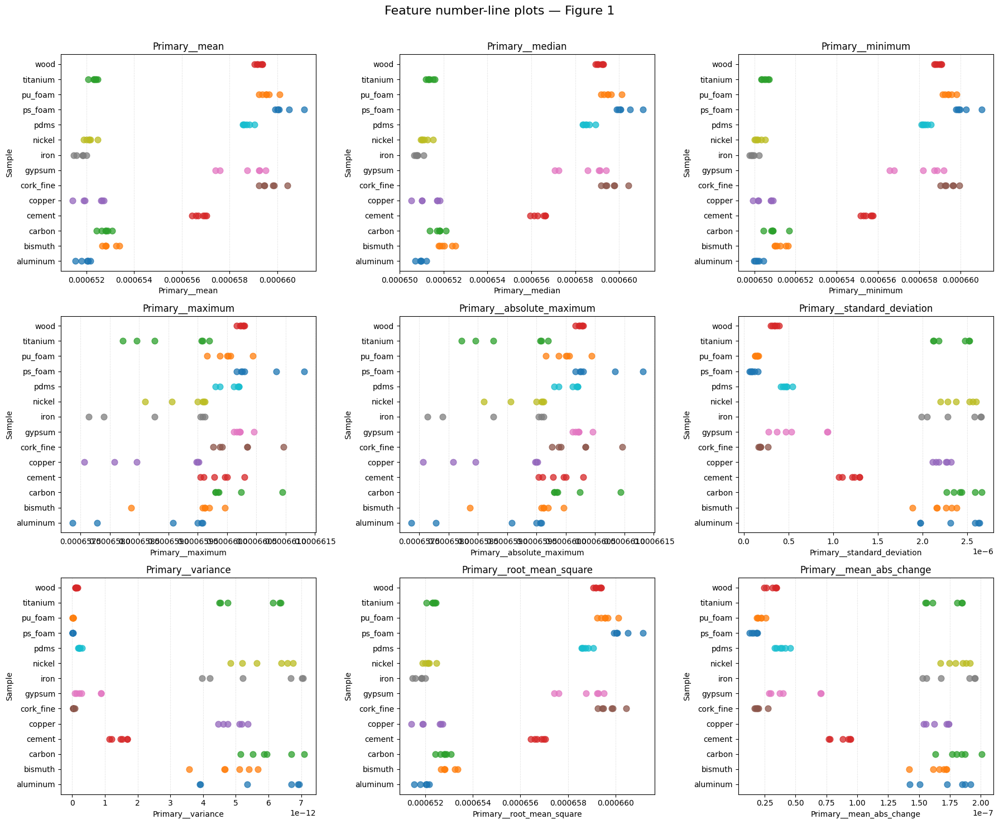

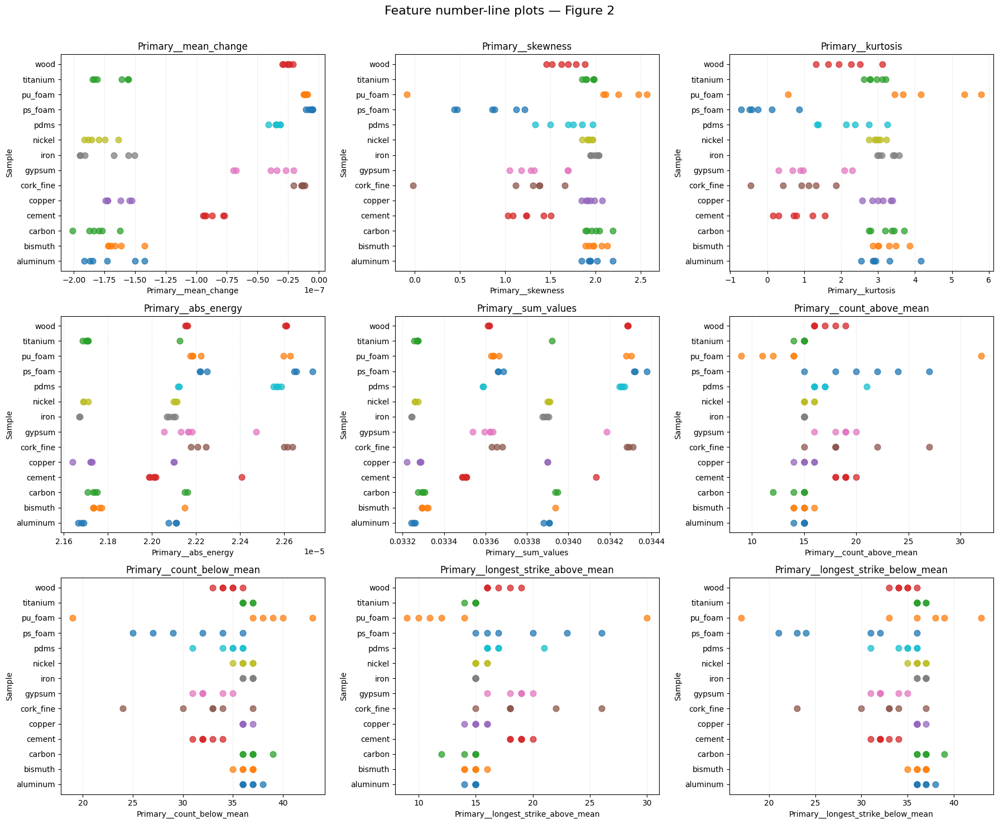

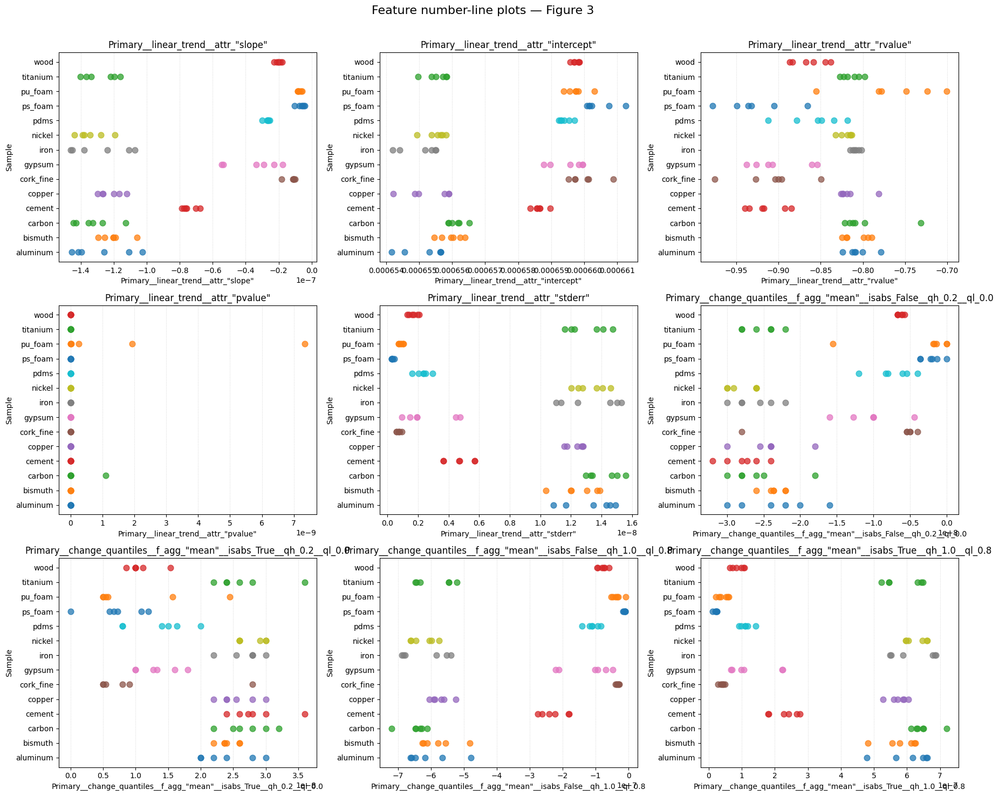

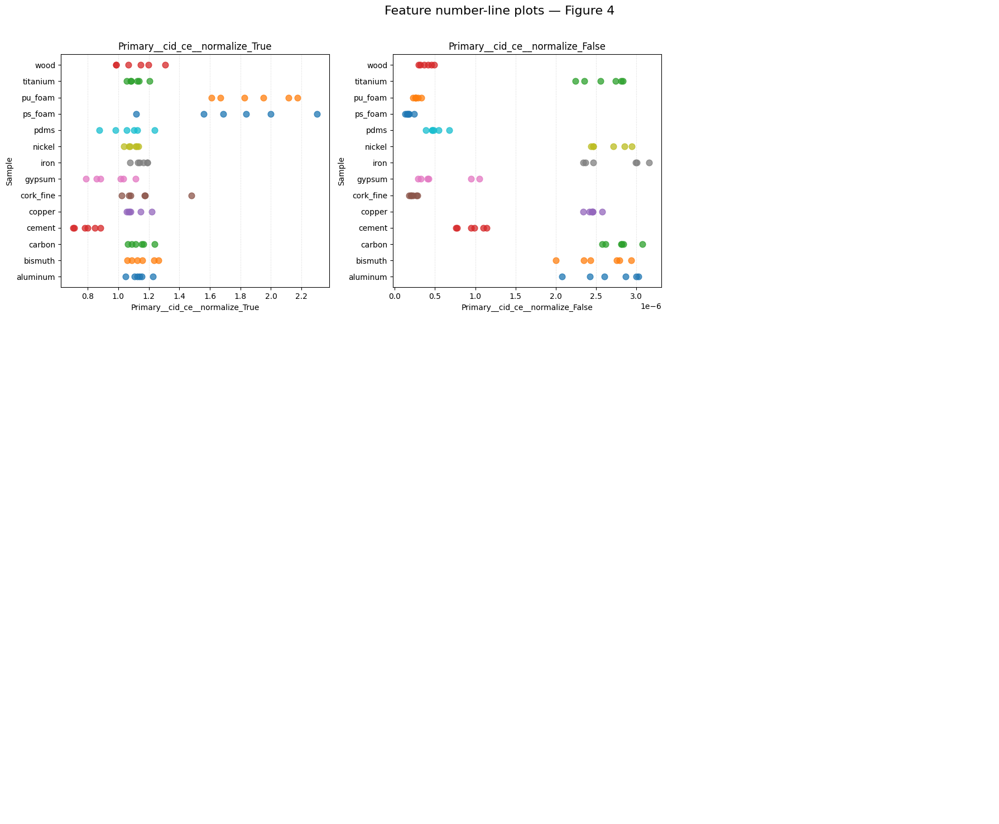

In [27]:
# -index ; - trial

legend_col = "Sample"

# Automatically select numeric features,
# excluding identifiers and elbow_time
excluded_cols = ["Sample", "Trial", "index"]

features = [
    col
    for col in tsfresh_features.select_dtypes(include=np.number).columns
    if col not in excluded_cols
]

plots_per_fig = 9
n_cols = 3
n_rows = 3

n_figures = math.ceil(len(features) / plots_per_fig)

# Keep the same sample order in every subplot
groups = tsfresh_features[legend_col].dropna().unique()

for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig
    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 15)
    )

    axes = axes.flatten()

    for ax, feature in zip(axes, current_features):

        for group_idx, group in enumerate(groups):

            subset = tsfresh_features[
                tsfresh_features[legend_col] == group
            ]

            # Convert to numeric and remove NaN values
            values = pd.to_numeric(
                subset[feature],
                errors="coerce"
            ).dropna()

            # Place every sample on its own horizontal level
            y_position = np.full(
                len(values),
                group_idx
            )

            ax.scatter(
                values,
                y_position,
                label=str(group),
                alpha=0.75,
                s=60
            )

        ax.set_yticks(range(len(groups)))
        ax.set_yticklabels(groups)

        ax.set_xlabel(feature)
        ax.set_ylabel(legend_col)
        ax.set_title(feature)

        ax.grid(
            axis="x",
            linestyle=":",
            alpha=0.5
        )

    # Hide unused plots in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")

    fig.suptitle(
        f"Feature number-line plots — Figure {fig_num + 1}",
        fontsize=16
    )

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

In [28]:
# Create lookup table for thermal conductivity
k_lookup = (
    DATA[["Sample", "k"]]
    .dropna(subset=["Sample", "k"])
    .drop_duplicates(subset=["Sample"])
)

# Remove old k column if it exists
tsfresh_features = tsfresh_features.drop(
    columns=["k"],
    errors="ignore"
)

# Merge k into tsfresh_features
tsfresh_features = tsfresh_features.merge(
    k_lookup,
    on="Sample",
    how="left",
    validate="many_to_one"
)

# Check if k was successfully added
print(tsfresh_features[["Sample", "k"]].drop_duplicates())

       Sample        k
0    aluminum  215.000
6     bismuth    7.920
12     carbon    8.500
18     cement    1.730
24     copper  395.000
30  cork_fine    0.043
36     gypsum    0.170
42       iron   77.500
48     nickel   90.900
54       pdms    0.150
60    ps_foam    0.034
66    pu_foam    0.043
72   titanium   21.900
78       wood    0.100


Features retained: 29
Features removed because of NaN: 0


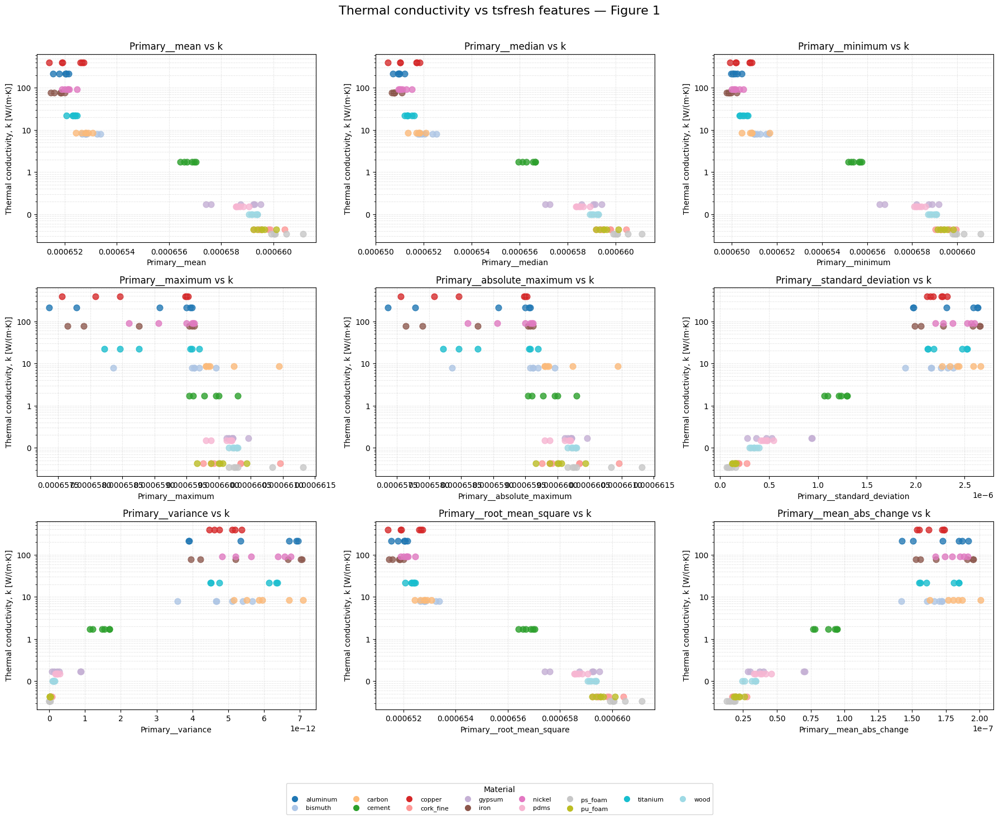

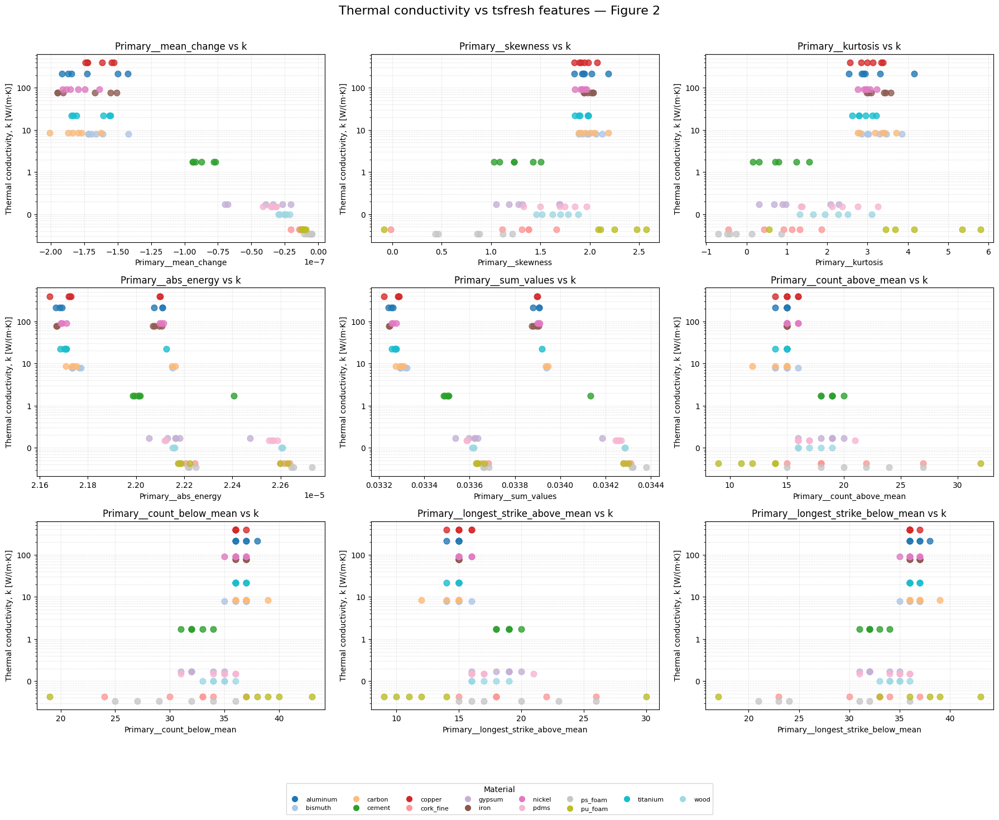

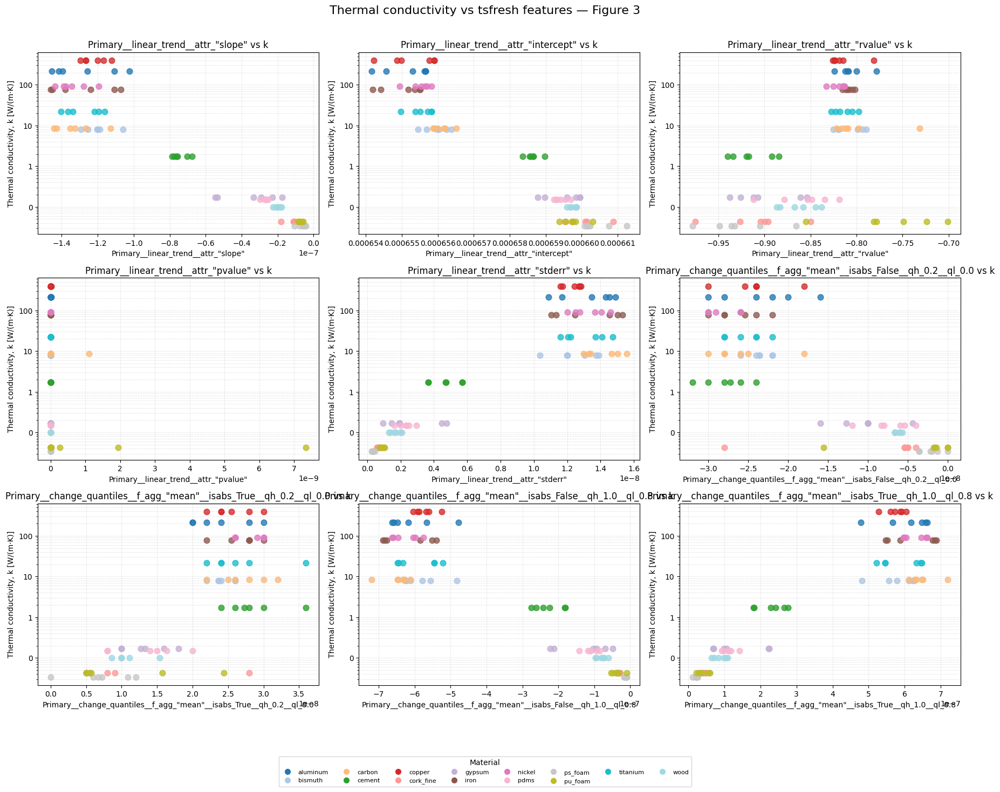

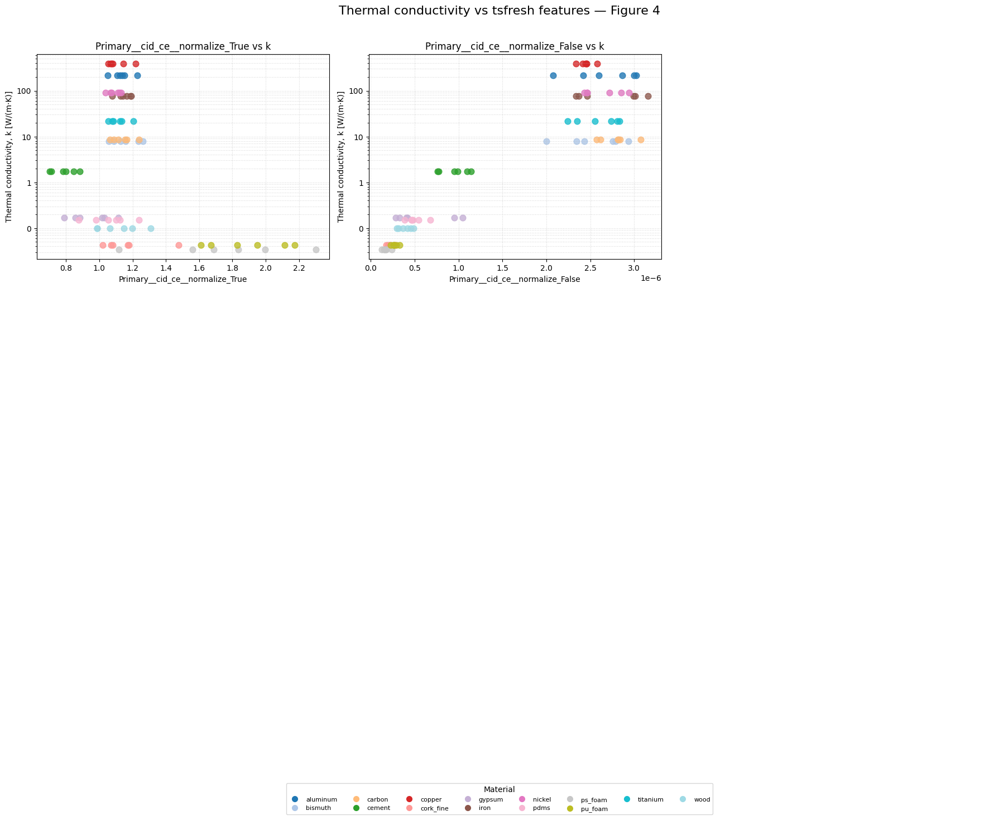

In [29]:
legend_col = "Sample"
y_col = "k"

plots_per_fig = 9
n_cols = 3
n_rows = 3


# --------------------------------------------------
# Prepare data
# --------------------------------------------------

plot_df = tsfresh_features.copy()

# Replace infinite values with NaN
plot_df = plot_df.replace(
    [np.inf, -np.inf],
    np.nan
)

# Ensure k is numeric
plot_df[y_col] = pd.to_numeric(
    plot_df[y_col],
    errors="coerce"
)

# Log scale requires positive k values
plot_df = plot_df[
    plot_df[y_col] > 0
].copy()


# --------------------------------------------------
# Select numeric tsfresh features
# --------------------------------------------------

excluded_cols = [
    "Sample",
    "Trial",
    "index",
    "k",
    "elbow_time"
]

candidate_features = [
    col
    for col in plot_df.select_dtypes(
        include=np.number
    ).columns
    if col not in excluded_cols
]


# Drop feature columns containing any NaN
features = [
    col
    for col in candidate_features
    if plot_df[col].notna().all()
]

dropped_features = [
    col
    for col in candidate_features
    if col not in features
]

print(
    f"Features retained: {len(features)}"
)

print(
    f"Features removed because of NaN: "
    f"{len(dropped_features)}"
)


# --------------------------------------------------
# Create one consistent color per material
# --------------------------------------------------

groups = (
    plot_df[legend_col]
    .dropna()
    .unique()
)

cmap = plt.get_cmap(
    "tab20",
    len(groups)
)

material_colors = {
    group: cmap(i)
    for i, group in enumerate(groups)
}


# --------------------------------------------------
# Plot k against each tsfresh feature
# --------------------------------------------------

n_figures = math.ceil(
    len(features) / plots_per_fig
)

for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig

    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 15)
    )

    axes = axes.flatten()

    for ax, feature in zip(
        axes,
        current_features
    ):

        for group in groups:

            subset = plot_df[
                plot_df[legend_col] == group
            ].dropna(
                subset=[feature, y_col]
            )

            if subset.empty:
                continue

            ax.scatter(
                subset[feature],
                subset[y_col],
                color=material_colors[group],
                label=str(group),
                alpha=0.8,
                s=60
            )

        ax.set_xlabel(feature)

        ax.set_ylabel(
            "Thermal conductivity, k [W/(m·K)]"
        )

        ax.set_title(
            f"{feature} vs k"
        )

        # Logarithmic numeric y-axis
        ax.set_yscale("log")

        # Show ordinary numeric labels
        ax.yaxis.set_major_formatter(
            ScalarFormatter()
        )

        ax.grid(
            which="both",
            linestyle=":",
            alpha=0.5
        )


    # Hide unused axes in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")


    # Shared legend with multiple materials per row
    legend_handles = [
        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="",
            markerfacecolor=material_colors[group],
            markeredgecolor=material_colors[group],
            markersize=7,
            label=str(group)
        )
        for group in groups
    ]

    fig.legend(
        handles=legend_handles,
        title="Material",
        loc="lower center",
        bbox_to_anchor=(0.5, 0.01),
        ncol=min(8, len(groups)),
        fontsize=8
    )

    fig.suptitle(
        f"Thermal conductivity vs tsfresh features "
        f"— Figure {fig_num + 1}",
        fontsize=16
    )

    plt.tight_layout(
        rect=[0, 0.10, 1, 0.97]
    )

    plt.show()

# Feature Extraction - ESN/RC

In [30]:
from reservoirpy.nodes import Reservoir
#from sklearn.preprocessing import StandardScaler

# ------------------------------------------------------------
# Prepare ESN input
# ------------------------------------------------------------

esn_data = DATA.copy()

if "diff" not in esn_data.columns:
    esn_data["diff"] = esn_data["Secondary"] - esn_data["Primary"]

esn_data["id"] = (
    esn_data["Sample"].astype(str)
    + "_trial_"
    + esn_data["Trial"].astype(int).astype(str)
)

input_cols = [
    "Primary",
    "Secondary",
    "diff",
]

esn_data = esn_data.replace([np.inf, -np.inf], np.nan)
esn_data = esn_data.dropna(subset=["id", "Time"] + input_cols)

esn_data = esn_data.sort_values(["id", "Time"]).reset_index(drop=True)


# ------------------------------------------------------------
# Global input scaling
# ------------------------------------------------------------

scaler = StandardScaler()

esn_data[input_cols] = scaler.fit_transform(
    esn_data[input_cols]
)


# ------------------------------------------------------------
# ESN feature extraction
# ------------------------------------------------------------

def extract_esn_features_from_sequence(
    sequence,
    units=100,
    sr=0.9,
    lr=0.3,
    input_scaling=0.5,
    random_state=42,
):
    reservoir = Reservoir(
        units=units,
        sr=sr,
        lr=lr,
        input_scaling=input_scaling,
        seed=random_state,
    )

    states = reservoir.run(sequence)

    features = {}

    for state_idx in range(states.shape[1]):
        state_values = states[:, state_idx]

        features[f"esn_state_{state_idx}_mean"] = np.mean(state_values)
        features[f"esn_state_{state_idx}_std"] = np.std(state_values)
        features[f"esn_state_{state_idx}_min"] = np.min(state_values)
        features[f"esn_state_{state_idx}_max"] = np.max(state_values)
        features[f"esn_state_{state_idx}_final"] = state_values[-1]

    return features

In [31]:
esn_feature_rows = []

for trial_id, subset in esn_data.groupby("id", sort=False):
    subset = subset.sort_values("Time").copy()

    sequence = subset[input_cols].to_numpy(dtype=float)

    if len(sequence) < 3:
        print(f"Skipped {trial_id}: too few observations")
        continue

    features = extract_esn_features_from_sequence(
        sequence,
        units=100,
        sr=0.9,
        lr=0.3,
        input_scaling=0.5,
        random_state=42,
    )

    features["id"] = trial_id

    esn_feature_rows.append(features)


esn_features = pd.DataFrame(esn_feature_rows)


# ------------------------------------------------------------
# Add labels / metadata
# ------------------------------------------------------------

labels = (
    esn_data[["id", "Sample", "Trial", "Label", "k"]]
    .drop_duplicates()
)

esn_features = esn_features.merge(
    labels,
    on="id",
    how="left",
    validate="one_to_one",
)

esn_features.head()

,esn_state_0_mean,esn_state_0_std,esn_state_0_min,esn_state_0_max,esn_state_0_final,esn_state_1_mean,esn_state_1_std,esn_state_1_min,esn_state_1_max,esn_state_1_final,...,esn_state_99_mean,esn_state_99_std,esn_state_99_min,esn_state_99_max,esn_state_99_final,id,Sample,Trial,Label,k
0,-0.127923,0.135711,-0.271286,0.183742,-0.088953,0.073647,0.057257,-0.038594,0.174381,0.070417,...,-0.137574,0.163370,-0.326257,0.140560,-0.153054,aluminum_trial_1,aluminum,1,metal,215.0
1,0.008484,0.102525,-0.088824,0.255203,0.002682,0.142526,0.071320,0.000000,0.272754,0.098768,...,-0.001410,0.118577,-0.138946,0.213891,-0.024428,aluminum_trial_2,aluminum,2,metal,215.0
2,-0.057950,0.108928,-0.164682,0.212727,-0.042223,0.117175,0.061780,0.000000,0.238482,0.088966,...,-0.079484,0.133368,-0.234826,0.160854,-0.080210,aluminum_trial_3,aluminum,3,metal,215.0
3,-0.292311,0.172249,-0.474574,0.080656,-0.239560,0.005284,0.060756,-0.154428,0.054537,0.054537,...,-0.248186,0.180684,-0.430617,0.039663,-0.329628,aluminum_trial_4,aluminum,4,metal,215.0
4,-0.295491,0.173274,-0.475961,0.077814,-0.250774,0.005167,0.060404,-0.152695,0.054080,0.054080,...,-0.248727,0.181858,-0.431496,0.037608,-0.341209,aluminum_trial_5,aluminum,5,metal,215.0


# Machine Learning Target: `k`

## 6-Fold Classification

In [32]:
def simple_multiclass_logistic_cv(
    df,
    target_col="Label",
    random_state=42,
    n_splits=6,
    class_order=[
        "foam",
        "composite",
        "polymer",
        "ceramic",
        "metal",
    ],
):
    work_df = (
        df
        .copy()
        .replace([np.inf, -np.inf], np.nan)
        .dropna(subset=[target_col])
    )

    excluded_cols = [
        "Sample",
        "Trial",
        "Label",
        "k",
        "index",
        "elbow_time",
        "elbow_idx",
        "elbow_value",
        "is_elbow",
        "Elbow time",
        "Elbow value",
        "Elbow index",
    ]

    features = [
        col
        for col in work_df.select_dtypes(include=np.number).columns
        if col not in excluded_cols
    ]

    features = [
        col
        for col in features
        if work_df[col].notna().any()
    ]

    X = work_df[features]
    y = work_df[target_col]

    ordered_classes = [
        label
        for label in class_order
        if label in y.unique()
    ]

    print("Number of features:", len(features))
    print("Classes:", ordered_classes)

    cv = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state,
    )

    cv_rows = []
    y_true_all = []
    y_pred_all = []

    for fold, (train_idx, test_idx) in enumerate(cv.split(X, y), start=1):
        X_train = X.iloc[train_idx]
        X_test = X.iloc[test_idx]
        y_train = y.iloc[train_idx]
        y_test = y.iloc[test_idx]

        model = Pipeline([
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler()),
            (
                "classifier",
                LogisticRegression(
                    solver="lbfgs",
                    max_iter=5000,
                    C=1.0,
                    class_weight=None,
                    random_state=random_state,
                ),
            ),
        ])

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        report = classification_report(
            y_test,
            y_pred,
            labels=ordered_classes,
            zero_division=0,
            output_dict=True,
        )

        cv_rows.append({
            "fold": fold,
            "accuracy": report["accuracy"],
            "macro_precision": report["macro avg"]["precision"],
            "macro_recall": report["macro avg"]["recall"],
            "macro_f1": report["macro avg"]["f1-score"],
            "weighted_precision": report["weighted avg"]["precision"],
            "weighted_recall": report["weighted avg"]["recall"],
            "weighted_f1": report["weighted avg"]["f1-score"],
        })

        y_true_all.append(y_test)
        y_pred_all.append(pd.Series(y_pred, index=y_test.index))

        print(f"\nFold {fold}")
        print("Accuracy:", report["accuracy"])

        print("\nClassification report:")
        print(
            classification_report(
                y_test,
                y_pred,
                labels=ordered_classes,
                zero_division=0,
            )
        )

    cv_results = pd.DataFrame(cv_rows)

    print("\nPer-fold CV performance:")
    print(cv_results.round(4))

    print("\nAverage CV performance:")
    print(
        cv_results
        .drop(columns="fold")
        .mean()
        .round(4)
    )

    print("\nCV performance standard deviation:")
    print(
        cv_results
        .drop(columns="fold")
        .std()
        .round(4)
    )

    y_true_all = pd.concat(y_true_all)
    y_pred_all = pd.concat(y_pred_all)

    print("\nOverall out-of-fold classification report:")
    print(
        classification_report(
            y_true_all,
            y_pred_all,
            labels=ordered_classes,
            zero_division=0,
        )
    )

    ConfusionMatrixDisplay.from_predictions(
        y_true_all,
        y_pred_all,
        labels=ordered_classes,
        display_labels=[
            str(label).replace("_", " ").title()
            for label in ordered_classes
        ],
        cmap="Blues",
        xticks_rotation=45,
    )

    plt.xlabel("Predicted material cluster")
    plt.ylabel("Actual material cluster")
    plt.title("6-Fold CV Multiclass Logistic Regression")
    plt.tight_layout()
    plt.show()

    final_model = Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        (
            "classifier",
            LogisticRegression(
                solver="lbfgs",
                max_iter=5000,
                C=1.0,
                class_weight=None,
                random_state=random_state,
            ),
        ),
    ])

    final_model.fit(X, y)

    return final_model, features, cv_results

### Feature: thermal parameters

Number of features: 53
Classes: ['foam', 'composite', 'polymer', 'ceramic', 'metal']

Fold 1
Accuracy: 0.7142857142857143

Classification report:
              precision    recall  f1-score   support

        foam       1.00      0.50      0.67         2
   composite       0.50      1.00      0.67         2
     polymer       0.00      0.00      0.00         1
     ceramic       0.50      0.33      0.40         3
       metal       0.86      1.00      0.92         6

    accuracy                           0.71        14
   macro avg       0.57      0.57      0.53        14
weighted avg       0.69      0.71      0.67        14


Fold 2
Accuracy: 0.9285714285714286

Classification report:
              precision    recall  f1-score   support

        foam       1.00      1.00      1.00         2
   composite       1.00      1.00      1.00         2
     polymer       1.00      1.00      1.00         1
     ceramic       1.00      0.67      0.80         3
       metal       0.86      1.00

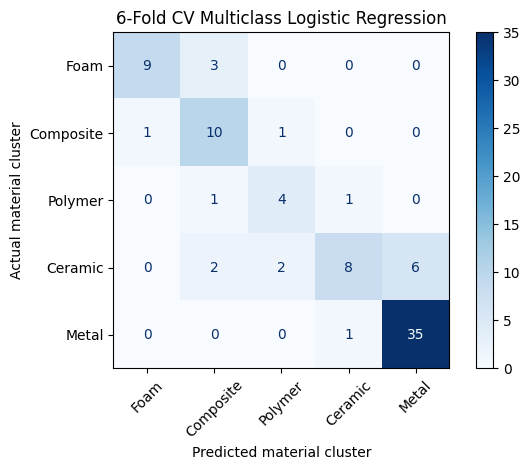

In [33]:
logistic_model, logistic_features, cv_results = simple_multiclass_logistic_cv(
    df=features_df[['primary_response_auc', 'primary_initial_rate',
       'primary_mean_early_rate', 'primary_mid_window_rate',
       'primary_late_window_rate', 'primary_max_rate',
       'primary_time_of_max_rate', 'primary_max_abs_rate',
       'primary_time_of_max_abs_rate', 'primary_rate_decay_ratio',
       'primary_rate_auc', 'primary_signed_rate_auc', 'primary_rate_std',
       'secondary_elbow_value', 'secondary_final_offset',
       'secondary_response_auc', 'secondary_initial_rate',
       'secondary_mean_early_rate', 'secondary_mid_window_rate',
       'secondary_late_window_rate', 'secondary_max_rate',
       'secondary_time_of_max_rate', 'secondary_max_abs_rate',
       'secondary_time_of_max_abs_rate', 'secondary_rate_decay_ratio',
       'secondary_rate_auc', 'secondary_signed_rate_auc', 'secondary_rate_std',
       'difference_elbow_value', 'difference_final_offset',
       'difference_response_auc', 'difference_initial_rate',
       'difference_mean_early_rate', 'difference_mid_window_rate',
       'difference_late_window_rate', 'difference_max_rate',
       'difference_time_of_max_rate', 'difference_max_abs_rate',
       'difference_time_of_max_abs_rate', 'difference_rate_decay_ratio',
       'difference_rate_auc', 'difference_signed_rate_auc',
       'difference_rate_std', 'secondary_initial_rate_ratio',
       'secondary_mid_rate_ratio', 'secondary_late_rate_ratio',
       'secondary_rate_auc_ratio', 'mean_top_bottom_rate_difference',
       'max_top_bottom_rate_difference', 'max_abs_top_bottom_rate_difference',
       'top_bottom_rate_difference_auc', 'top_bottom_rate_difference_std',
       'top_bottom_rate_lag', 'Label']],
    target_col="Label",
    n_splits=6,
    random_state=42,
)

### Features: time-series

Number of features: 29
Classes: ['foam', 'composite', 'polymer', 'ceramic', 'metal']

Fold 1
Accuracy: 0.7857142857142857

Classification report:
              precision    recall  f1-score   support

        foam       1.00      1.00      1.00         2
   composite       0.50      1.00      0.67         2
     polymer       0.00      0.00      0.00         1
     ceramic       1.00      0.33      0.50         3
       metal       0.86      1.00      0.92         6

    accuracy                           0.79        14
   macro avg       0.67      0.67      0.62        14
weighted avg       0.80      0.79      0.74        14


Fold 2
Accuracy: 0.8571428571428571

Classification report:
              precision    recall  f1-score   support

        foam       1.00      1.00      1.00         2
   composite       1.00      1.00      1.00         2
     polymer       0.00      0.00      0.00         1
     ceramic       0.67      0.67      0.67         3
       metal       0.86      1.00

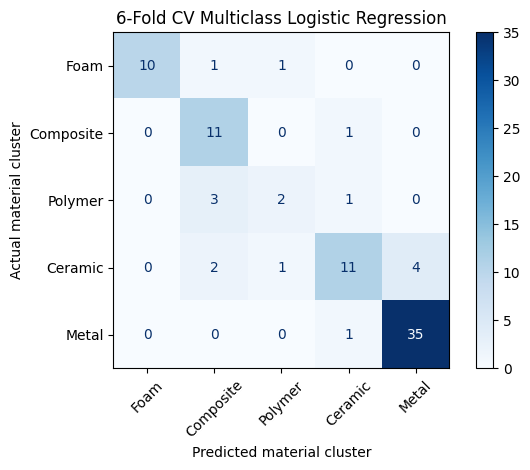

In [34]:
logistic_model, logistic_features, cv_results = simple_multiclass_logistic_cv(
    df=tsfresh_features[['Primary__mean', 'Primary__median', 'Primary__minimum',
       'Primary__maximum', 'Primary__absolute_maximum',
       'Primary__standard_deviation', 'Primary__variance',
       'Primary__root_mean_square', 'Primary__mean_abs_change',
       'Primary__mean_change', 'Primary__skewness', 'Primary__kurtosis',
       'Primary__abs_energy', 'Primary__sum_values',
       'Primary__count_above_mean', 'Primary__count_below_mean',
       'Primary__longest_strike_above_mean',
       'Primary__longest_strike_below_mean',
       'Primary__linear_trend__attr_"slope"',
       'Primary__linear_trend__attr_"intercept"',
       'Primary__linear_trend__attr_"rvalue"',
       'Primary__linear_trend__attr_"pvalue"',
       'Primary__linear_trend__attr_"stderr"',
       'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_0.2__ql_0.0',
       'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_0.2__ql_0.0',
       'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.8',
       'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_1.0__ql_0.8',
       'Primary__cid_ce__normalize_True', 'Primary__cid_ce__normalize_False', 'Label']],
    target_col="Label",
    n_splits=6,
    random_state=42,
)

### Features: ESN

Number of features: 500
Classes: ['foam', 'composite', 'polymer', 'ceramic', 'metal']

Fold 1
Accuracy: 0.7857142857142857

Classification report:
              precision    recall  f1-score   support

        foam       1.00      1.00      1.00         2
   composite       0.67      1.00      0.80         2
     polymer       0.00      0.00      0.00         1
     ceramic       0.50      0.33      0.40         3
       metal       0.86      1.00      0.92         6

    accuracy                           0.79        14
   macro avg       0.60      0.67      0.62        14
weighted avg       0.71      0.79      0.74        14


Fold 2
Accuracy: 0.9285714285714286

Classification report:
              precision    recall  f1-score   support

        foam       1.00      1.00      1.00         2
   composite       1.00      1.00      1.00         2
     polymer       1.00      1.00      1.00         1
     ceramic       1.00      0.67      0.80         3
       metal       0.86      1.0

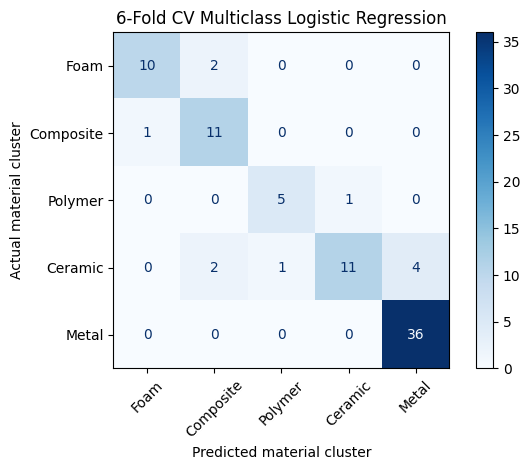

In [35]:
logistic_model, logistic_features, cv_results = simple_multiclass_logistic_cv(
    df=esn_features[[c for c in esn_features.columns if 'esn' in c] + ['Label']],
    target_col="Label",
    n_splits=6,
    random_state=42,
)

## 6-Fold Regression

In [36]:
from sklearn.compose import TransformedTargetRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.model_selection import KFold
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    max_error,
)
#from sklearn.pipeline import Pipeline
#from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler


def safe_mape(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    valid = np.isfinite(y_true) & np.isfinite(y_pred) & ~np.isclose(y_true, 0)

    if valid.sum() == 0:
        return np.nan

    return np.mean(np.abs((y_true[valid] - y_pred[valid]) / y_true[valid])) * 100


def safe_medape(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    valid = np.isfinite(y_true) & np.isfinite(y_pred) & ~np.isclose(y_true, 0)

    if valid.sum() == 0:
        return np.nan

    return np.median(np.abs((y_true[valid] - y_pred[valid]) / y_true[valid])) * 100


def safe_smape(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    denominator = np.abs(y_true) + np.abs(y_pred)

    valid = (
        np.isfinite(y_true)
        & np.isfinite(y_pred)
        & ~np.isclose(denominator, 0)
    )

    if valid.sum() == 0:
        return np.nan

    return np.mean(
        2 * np.abs(y_pred[valid] - y_true[valid]) / denominator[valid]
    ) * 100

def regression_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    return {
        "mae": mean_absolute_error(y_true, y_pred),
        "rmse": np.sqrt(mean_squared_error(y_true, y_pred)),
        "r2": r2_score(y_true, y_pred) if len(y_true) >= 2 else np.nan,
        "mape": safe_mape(y_true, y_pred),
        "medape": safe_medape(y_true, y_pred),
        "smape": safe_smape(y_true, y_pred),
        "max_error": max_error(y_true, y_pred),
    }

def simple_log_linear_regression_cv(
    df,
    target_col="k",
    eval_group_col="Label",
    random_state=42,
    n_splits=6,
):
    work_df = (
        df
        .copy()
        .replace([np.inf, -np.inf], np.nan)
        .dropna(subset=[target_col])
    )

    work_df = work_df[work_df[target_col] >= 0].copy()

    excluded_cols = [
        "Sample",
        "Trial",
        "Label",
        "k",
        "index",
        "elbow_time",
        "elbow_idx",
        "elbow_value",
        "is_elbow",
        "Elbow time",
        "Elbow value",
        "Elbow index",
    ]

    excluded_cols = list(set(excluded_cols + [target_col]))

    features = [
        col
        for col in work_df.select_dtypes(include=np.number).columns
        if col not in excluded_cols
    ]

    features = [
        col
        for col in features
        if work_df[col].notna().any()
    ]

    X = work_df[features]
    y = work_df[target_col]

    print("Number of features:", len(features))
    print("Target:", target_col)
    print("Evaluation group:", eval_group_col)
    print("Model target transform: log1p(k)")
    print("Prediction inverse transform: expm1(predicted log1p(k))")

    cv = KFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state,
    )

    cv_rows = []
    group_rows = []
    y_true_all = []
    y_pred_all = []

    for fold, (train_idx, test_idx) in enumerate(cv.split(X, y), start=1):
        X_train = X.iloc[train_idx]
        X_test = X.iloc[test_idx]

        y_train = y.iloc[train_idx]
        y_test = y.iloc[test_idx]

        base_model = Pipeline([
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler()),
            ("regressor", Ridge(random_state = 42, alpha = 0.1)),
        ])

        model = TransformedTargetRegressor(
            regressor=base_model,
            func=np.log1p,
            inverse_func=np.expm1,
            check_inverse=False,
        )

        model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_pred = np.clip(y_pred, 0, None)

        fold_metrics = regression_metrics(y_test, y_pred)

        cv_rows.append({
            "fold": fold,
            **fold_metrics,
        })

        y_true_all.append(y_test)
        y_pred_all.append(pd.Series(y_pred, index=y_test.index))

        print(f"\nFold {fold}")
        print(f"MAE: {fold_metrics['mae']:.4f}")
        print(f"RMSE: {fold_metrics['rmse']:.4f}")
        print(f"R2: {fold_metrics['r2']:.4f}")
        print(f"MAPE: {fold_metrics['mape']:.4f}%")
        print(f"MedAPE: {fold_metrics['medape']:.4f}%")
        print(f"SMAPE: {fold_metrics['smape']:.4f}%")
        print(f"Max error: {fold_metrics['max_error']:.4f}")

        fold_eval = pd.DataFrame({
            "group": work_df.iloc[test_idx][eval_group_col].values,
            "y_true": y_test.values,
            "y_pred": y_pred,
        })

        fold_group_rows = []

        for group_name, group_data in fold_eval.groupby("group"):
            group_metrics = regression_metrics(
                group_data["y_true"],
                group_data["y_pred"],
            )

            row = {
                "fold": fold,
                "group": group_name,
                "n": len(group_data),
                **group_metrics,
            }

            group_rows.append(row)
            fold_group_rows.append(row)

        fold_group_results = pd.DataFrame(fold_group_rows)

        print("\nPerformance per group:")
        print(
            fold_group_results[
                [
                    "group",
                    "n",
                    "mae",
                    "rmse",
                    "r2",
                    "mape",
                    "medape",
                    "smape",
                    "max_error",
                ]
            ].round(4)
        )

    cv_results = pd.DataFrame(cv_rows)
    group_cv_results = pd.DataFrame(group_rows)

    print("\nPer-fold CV performance:")
    print(cv_results.round(4))

    print("\nAverage CV performance:")
    print(cv_results.drop(columns="fold").mean().round(4))

    print("\nCV performance standard deviation:")
    print(cv_results.drop(columns="fold").std().round(4))

    print("\nAverage performance per group:")
    print(
        group_cv_results
        .drop(columns=["fold", "n"])
        .groupby("group")
        .mean()
        .round(4)
    )

    y_true_all = pd.concat(y_true_all)
    y_pred_all = pd.concat(y_pred_all)

    plt.figure(figsize=(6, 6))
    plt.scatter(y_true_all, y_pred_all)

    min_value = 0
    max_value = max(y_true_all.max(), y_pred_all.max())

    plt.plot(
        [min_value, max_value],
        [min_value, max_value],
        linestyle=":",
    )

    #plt.xlim(0, max_value)
    #plt.ylim(0, max_value)

    plt.xlabel("Actual k")
    plt.ylabel("Predicted k")
    plt.title("6-Fold CV Log-Linear Regression: Actual vs Predicted")
    plt.tight_layout()
    plt.show()

    final_base_model = Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("regressor", LinearRegression()),
    ])

    final_model = TransformedTargetRegressor(
        regressor=final_base_model,
        func=np.log1p,
        inverse_func=np.expm1,
        check_inverse=False,
    )

    final_model.fit(X, y)

    return final_model, features, cv_results, group_cv_results

### Features: thermal parameters

Number of features: 53
Target: k
Evaluation group: Label
Model target transform: log1p(k)
Prediction inverse transform: expm1(predicted log1p(k))

Fold 1
MAE: 21.2265
RMSE: 42.8180
R2: 0.6687
MAPE: 750.5292%
MedAPE: 71.4621%
SMAPE: 104.0646%
Max error: 113.8408

Performance per group:
       group  n      mae     rmse           r2       mape     medape  \
0    ceramic  4   1.9210   3.1438       0.0469    55.9507    70.3395   
1  composite  2   0.0715   0.0770      -6.2939   100.0000   100.0000   
2       foam  2   1.4950   2.0841 -214486.9023  4383.8490  4383.8490   
3      metal  5  57.0807  71.5797       0.3790   136.3549    52.9492   
4    polymer  1   0.9512   0.9512          NaN   634.1330   634.1330   

      smape  max_error  
0   42.1223     6.1650  
1  200.0000     0.1000  
2  197.7446     2.9470  
3   68.1760   113.8408  
4  152.0460     0.9512  

Fold 2
MAE: 48.6834
RMSE: 95.6383
R2: 0.2286
MAPE: 335.9586%
MedAPE: 94.7620%
SMAPE: 130.5039%
Max error: 304.0450

Performance pe

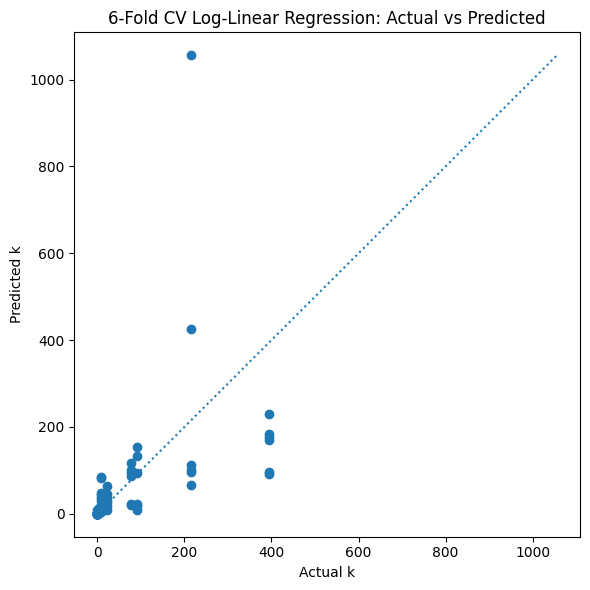

In [37]:
log_lin_model, log_lin_features, log_lin_cv_results, log_lin_group_results = (
    simple_log_linear_regression_cv(
        df=features_df[['primary_response_auc', 'primary_initial_rate',
       'primary_mean_early_rate', 'primary_mid_window_rate',
       'primary_late_window_rate', 'primary_max_rate',
       'primary_time_of_max_rate', 'primary_max_abs_rate',
       'primary_time_of_max_abs_rate', 'primary_rate_decay_ratio',
       'primary_rate_auc', 'primary_signed_rate_auc', 'primary_rate_std',
       'secondary_elbow_value', 'secondary_final_offset',
       'secondary_response_auc', 'secondary_initial_rate',
       'secondary_mean_early_rate', 'secondary_mid_window_rate',
       'secondary_late_window_rate', 'secondary_max_rate',
       'secondary_time_of_max_rate', 'secondary_max_abs_rate',
       'secondary_time_of_max_abs_rate', 'secondary_rate_decay_ratio',
       'secondary_rate_auc', 'secondary_signed_rate_auc', 'secondary_rate_std',
       'difference_elbow_value', 'difference_final_offset',
       'difference_response_auc', 'difference_initial_rate',
       'difference_mean_early_rate', 'difference_mid_window_rate',
       'difference_late_window_rate', 'difference_max_rate',
       'difference_time_of_max_rate', 'difference_max_abs_rate',
       'difference_time_of_max_abs_rate', 'difference_rate_decay_ratio',
       'difference_rate_auc', 'difference_signed_rate_auc',
       'difference_rate_std', 'secondary_initial_rate_ratio',
       'secondary_mid_rate_ratio', 'secondary_late_rate_ratio',
       'secondary_rate_auc_ratio', 'mean_top_bottom_rate_difference',
       'max_top_bottom_rate_difference', 'max_abs_top_bottom_rate_difference',
       'top_bottom_rate_difference_auc', 'top_bottom_rate_difference_std',
       'top_bottom_rate_lag', 'k', 'Label']],
        target_col="k",
        eval_group_col="Label",
        n_splits=6,
        random_state=42,
    )
)

### Features: time-series

Number of features: 29
Target: k
Evaluation group: Label
Model target transform: log1p(k)
Prediction inverse transform: expm1(predicted log1p(k))

Fold 1
MAE: 29.9112
RMSE: 61.9790
R2: 0.3059
MAPE: 259.3856%
MedAPE: 74.8931%
SMAPE: 110.0095%
Max error: 163.4335

Performance per group:
       group  n      mae      rmse          r2       mape     medape  \
0    ceramic  4   1.9412    3.1996      0.0128    62.5823    73.4335   
1  composite  2   0.0715    0.0770     -6.2939   100.0000   100.0000   
2       foam  2   0.4428    0.6045 -18045.8162  1292.7626  1292.7626   
3      metal  5  81.9808  103.6706     -0.3025   111.1685    76.0156   
4    polymer  1   0.0596    0.0596         NaN    39.7018    39.7018   

      smape  max_error  
0   93.1539     6.2705  
1  200.0000     0.1000  
2  119.2933     0.8544  
3   95.8792   163.4335  
4   49.5350     0.0596  

Fold 2
MAE: 46.7523
RMSE: 107.4007
R2: 0.0272
MAPE: 1153.6523%
MedAPE: 122.6286%
SMAPE: 101.4399%
Max error: 367.8943

Performance

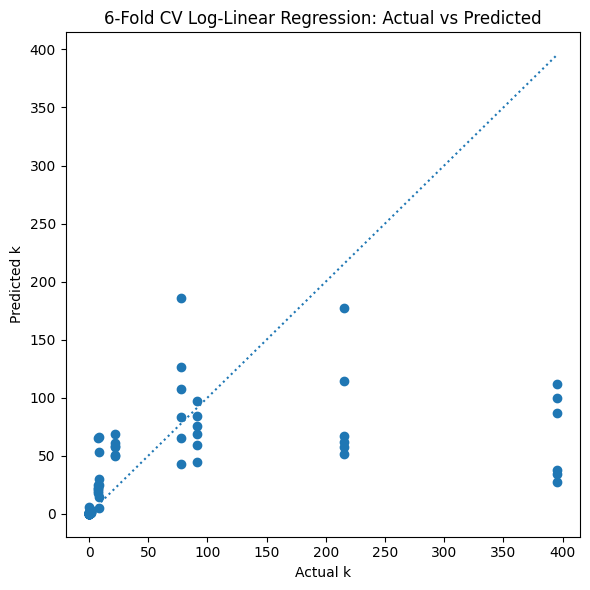

In [38]:
log_lin_model, log_lin_features, log_lin_cv_results, log_lin_group_results = (
    simple_log_linear_regression_cv(
        df=tsfresh_features[[ 'Primary__mean', 'Primary__median', 'Primary__minimum',
       'Primary__maximum', 'Primary__absolute_maximum',
       'Primary__standard_deviation', 'Primary__variance',
       'Primary__root_mean_square', 'Primary__mean_abs_change',
       'Primary__mean_change', 'Primary__skewness', 'Primary__kurtosis',
       'Primary__abs_energy', 'Primary__sum_values',
       'Primary__count_above_mean', 'Primary__count_below_mean',
       'Primary__longest_strike_above_mean',
       'Primary__longest_strike_below_mean',
       'Primary__linear_trend__attr_"slope"',
       'Primary__linear_trend__attr_"intercept"',
       'Primary__linear_trend__attr_"rvalue"',
       'Primary__linear_trend__attr_"pvalue"',
       'Primary__linear_trend__attr_"stderr"',
       'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_0.2__ql_0.0',
       'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_0.2__ql_0.0',
       'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.8',
       'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_1.0__ql_0.8',
       'Primary__cid_ce__normalize_True', 'Primary__cid_ce__normalize_False', 'k', 'Label']],
        target_col="k",
        eval_group_col="Label",
        n_splits=6,
        random_state=42,
    )
)

### Features: ESN

Number of features: 500
Target: k
Evaluation group: Label
Model target transform: log1p(k)
Prediction inverse transform: expm1(predicted log1p(k))

Fold 1
MAE: 29.8061
RMSE: 56.2925
R2: 0.4274
MAPE: 514.2035%
MedAPE: 100.0000%
SMAPE: 109.8150%
Max error: 146.0548

Performance per group:
       group  n      mae     rmse          r2       mape     medape     smape  \
0    ceramic  4   2.9783   4.4718     -0.9283    87.1377    78.4215  102.3782   
1  composite  2   0.9052   1.2535  -1933.5876  2079.9085  2079.9085  118.8511   
2       foam  2   0.3614   0.4877 -11743.4533   850.9715   850.9715  188.9009   
3      metal  5  80.4487  94.1062     -0.0733   118.3254    70.8354   75.8810   
4    polymer  1   0.5954   0.5954         NaN   396.9113   396.9113  132.9884   

   max_error  
0     8.5000  
1     1.7724  
2     0.6888  
3   146.0548  
4     0.5954  

Fold 2
MAE: 34.7612
RMSE: 60.8113
R2: 0.6881
MAPE: 162.3671%
MedAPE: 86.3711%
SMAPE: 91.7818%
Max error: 156.3956

Performance per gro

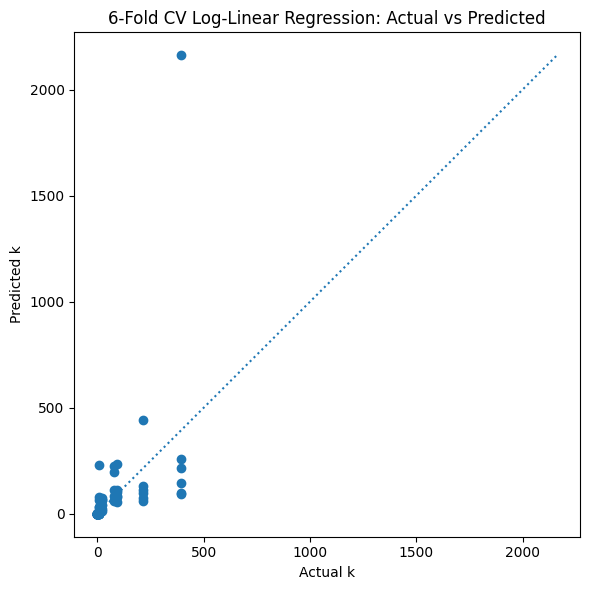

In [39]:
log_lin_model, log_lin_features, log_lin_cv_results, log_lin_group_results = (
    simple_log_linear_regression_cv(
        df=esn_features[[c for c in esn_features.columns if 'esn' in c] + ['k', 'Label']],
        target_col="k",
        eval_group_col="Label",
        n_splits=6,
        random_state=42,
    )
)